# Train

> In this module, we develop trainers of different models

In [1]:
#| hide
import sys
sys.path.append("/notebooks/katlas")
from nbdev.showdoc import *
%matplotlib inline
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from fastbook import *
from katlas.core import Data
from katlas.feature import *
from katlas.train import *
from katlas.plot import *

from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import *
from sklearn.svm import *
from sklearn.ensemble import *
from sklearn.model_selection import train_test_split, StratifiedGroupKFold
from sklearn.metrics import mean_squared_error
from scipy.stats import spearmanr,pearsonr

import xgboost as xgb
import joblib

# import matplotlib.pyplot as plt

from pathlib import Path
import math

/usr/local/lib/python3.9/dist-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/lib/python3.9/dist-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/lib/python3.9/dist-packages/umap/distances.py:1086: NumbaDeprecationWarning: The 'nopython' keyword argument 

## Prepare dataset

### Target

In [3]:
target = Data.get_unstack_q85_up40()

### Kinase

In [4]:
kinase = Data.get_esm_full()

In [5]:
# reduce dimension
kinase_pca = reduce_dim(kinase,n_components=64)

In [6]:
# add annotation
kinase_pca.columns = 'esm_' + kinase_pca.columns

kinase_pca = kinase_pca.rename(columns = {'esm_kinase':'kinase'})

In [7]:
kinase_pca

,kinase,esm_PCA1,esm_PCA2,esm_PCA3,esm_PCA4,esm_PCA5,esm_PCA6,esm_PCA7,esm_PCA8,esm_PCA9,esm_PCA10,esm_PCA11,esm_PCA12,esm_PCA13,esm_PCA14,esm_PCA15,esm_PCA16,esm_PCA17,esm_PCA18,esm_PCA19,esm_PCA20,esm_PCA21,esm_PCA22,esm_PCA23,esm_PCA24,esm_PCA25,esm_PCA26,esm_PCA27,esm_PCA28,esm_PCA29,esm_PCA30,esm_PCA31,esm_PCA32,esm_PCA33,esm_PCA34,esm_PCA35,esm_PCA36,esm_PCA37,esm_PCA38,esm_PCA39,esm_PCA40,esm_PCA41,esm_PCA42,esm_PCA43,esm_PCA44,esm_PCA45,esm_PCA46,esm_PCA47,esm_PCA48,esm_PCA49,esm_PCA50,esm_PCA51,esm_PCA52,esm_PCA53,esm_PCA54,esm_PCA55,esm_PCA56,esm_PCA57,esm_PCA58,esm_PCA59,esm_PCA60,esm_PCA61,esm_PCA62,esm_PCA63,esm_PCA64
0,AAK1,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.247360,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.003970,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845
1,ABL1,-1.931306,0.637669,-0.072235,-0.004348,0.312829,-0.505273,0.126467,-0.011544,-0.275820,0.048729,0.072435,0.195654,-0.084111,0.051488,-0.101775,0.087392,0.137371,-0.015153,-0.075616,0.053635,0.056328,-0.138841,-0.159921,0.053026,0.058108,-0.076574,-0.088034,0.102523,-0.040311,-0.031613,0.120338,-0.073371,0.008042,0.079160,-0.021081,0.073007,-0.050973,0.025580,-0.051110,-0.004018,0.040173,-0.014155,-0.006515,-0.004287,0.070771,0.033457,-0.026757,-0.024254,-0.100689,-0.074734,-0.004123,0.002112,-0.009017,0.096475,0.034698,0.030652,0.007423,-0.032890,-0.073979,-0.007177,-0.015137,-0.035481,0.021278,-0.016305
2,ABL2,-2.048180,0.627373,-0.178074,-0.033735,0.317193,-0.496570,0.108552,0.013383,-0.162621,-0.049872,0.011715,0.185261,0.059543,0.032895,-0.039218,0.129844,0.125766,-0.018607,0.008860,0.053493,0.009433,-0.046260,-0.038240,0.058908,0.023800,-0.033622,-0.030200,0.029683,-0.046255,-0.050329,0.095298,-0.071284,0.053442,0.048633,-0.046210,0.114328,0.020992,0.056918,-0.005738,-0.025896,0.051347,-0.070953,-0.004342,0.001195,0.035350,0.045032,-0.024570,0.019013,-0.085642,-0.109564,0.015654,-0.006472,0.003532,0.080850,0.034486,0.018591,-0.005754,-0.000693,-0.052234,0.008839,-0.032262,-0.033427,0.064374,-0.030907
3,TNK2,-0.897710,1.145315,0.450898,0.119766,0.291116,-0.379524,-0.084186,0.251804,-0.216353,-0.161187,0.053212,0.148786,0.004534,-0.057937,-0.211477,-0.108984,-0.102808,0.052803,0.024738,0.082097,0.034644,-0.238088,0.016375,0.037881,0.210644,-0.025836,0.108260,-0.020523,-0.021300,-0.076778,0.044177,-0.063041,-0.012587,0.043635,-0.073801,-0.077123,-0.096927,0.135297,-0.096873,-0.040031,-0.047582,-0.015064,-0.110818,-0.023351,-0.004970,0.013316,0.073302,0.016430,0.019699,-0.110918,0.035945,0.014094,-0.072784,0.033735,-0.021426,0.011789,0.018161,0.027162,-0.108019,-0.031179,0.002264,-0.031765,0.011870,-0.033201
4,ACVR2A,2.334148,0.541859,0.152062,-0.329577,-0.281140,-0.075879,0.543338,0.290886,-0.041614,0.406689,-0.104070,0.035531,0.096863,-0.057850,-0.149677,0.002580,-0.164501,-0.168633,0.275975,-0.189426,-0.308967,0.070275,-0.008715,0.006837,0.153902,0.022378,0.023499,0.176016,0.002594,-0.035115,0.006721,0.181504,-0.098002,0.083294,-0.073673,-0.104607,0.111415,0.044986,-0.127008,-0.061525,0.023939,-0.166168,-0.088847,-0.056617,0.033836,0.081539,0.045643,0.189226,0.026287,-0.045981,-0.094152,-0.113859,0.088983,-0.016529,-0.042940,-0.001238,-0.105317,-0.003495,0.003248,0.029781,0.026708,-0.106743,-0.065541,-0.053887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
490,YSK1,-0

### a.a.

Features

In [8]:
aa = Data.get_aa_feature()

In [9]:
# reduce dimension
aa_pca = reduce_dim(aa,n_components=16)

# add annotation
aa_pca.columns = 'aa_' + aa_pca.columns

aa_pca = aa_pca.rename(columns = {'aa_aa':'aa'})

### Combine

In [10]:
target.shape

(59994, 5)

In [11]:
df = target.merge(kinase_pca).merge(aa_pca).reset_index(drop=True)

In [12]:
df

,kinase,substrate,target,position,aa,esm_PCA1,esm_PCA2,esm_PCA3,esm_PCA4,esm_PCA5,esm_PCA6,esm_PCA7,esm_PCA8,esm_PCA9,esm_PCA10,esm_PCA11,esm_PCA12,esm_PCA13,esm_PCA14,esm_PCA15,esm_PCA16,esm_PCA17,esm_PCA18,esm_PCA19,esm_PCA20,esm_PCA21,esm_PCA22,esm_PCA23,esm_PCA24,esm_PCA25,esm_PCA26,esm_PCA27,esm_PCA28,esm_PCA29,esm_PCA30,esm_PCA31,esm_PCA32,esm_PCA33,esm_PCA34,esm_PCA35,esm_PCA36,esm_PCA37,esm_PCA38,esm_PCA39,esm_PCA40,esm_PCA41,esm_PCA42,esm_PCA43,esm_PCA44,esm_PCA45,esm_PCA46,esm_PCA47,esm_PCA48,esm_PCA49,esm_PCA50,esm_PCA51,esm_PCA52,esm_PCA53,esm_PCA54,esm_PCA55,esm_PCA56,esm_PCA57,esm_PCA58,esm_PCA59,esm_PCA60,esm_PCA61,esm_PCA62,esm_PCA63,esm_PCA64,aa_PCA1,aa_PCA2,aa_PCA3,aa_PCA4,aa_PCA5,aa_PCA6,aa_PCA7,aa_PCA8,aa_PCA9,aa_PCA10,aa_PCA11,aa_PCA12,aa_PCA13,aa_PCA14,aa_PCA15,aa_PCA16
0,AAK1,-5P,1.667971,-5,P,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,1.403490,0.224282,-0.163520,-0.649079,-0.057365,0.004034
1,AAK1,-4P,1.152337,-4,P,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,1.403490,0.224282,-0.163520,-0.649079,-0.057365,0.004034
2,AAK1,-3P,1.954319,-3,P,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,1.403490,0.224282,-0.163520,-0.649079,-0.057365,0.004034
3,AAK1,-2P,0.485449,-2,P,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,1.403490,0.224282,-0.163520,-0.649079,-0.057365,0.004034
4,AAK1,-1P,2.791637,-1,P,-0.216769,-0.733580,

In [73]:
# df.to_csv('df_esm64_aa16.csv',index=False)

#### Try aa one hot encoding

In [80]:
temp = target.merge(kinase_pca).reset_index(drop=True)

In [81]:
df2 = pd.concat([temp,pd.get_dummies(temp.aa)],axis=1)

In [82]:
df2

,kinase,substrate,target,position,aa,esm_PCA1,esm_PCA2,esm_PCA3,esm_PCA4,esm_PCA5,esm_PCA6,esm_PCA7,esm_PCA8,esm_PCA9,esm_PCA10,esm_PCA11,esm_PCA12,esm_PCA13,esm_PCA14,esm_PCA15,esm_PCA16,esm_PCA17,esm_PCA18,esm_PCA19,esm_PCA20,esm_PCA21,esm_PCA22,esm_PCA23,esm_PCA24,esm_PCA25,esm_PCA26,esm_PCA27,esm_PCA28,esm_PCA29,esm_PCA30,esm_PCA31,esm_PCA32,esm_PCA33,esm_PCA34,esm_PCA35,esm_PCA36,esm_PCA37,esm_PCA38,esm_PCA39,esm_PCA40,esm_PCA41,esm_PCA42,esm_PCA43,esm_PCA44,esm_PCA45,esm_PCA46,esm_PCA47,esm_PCA48,esm_PCA49,esm_PCA50,esm_PCA51,esm_PCA52,esm_PCA53,esm_PCA54,esm_PCA55,esm_PCA56,esm_PCA57,esm_PCA58,esm_PCA59,esm_PCA60,esm_PCA61,esm_PCA62,esm_PCA63,esm_PCA64,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y,t,y
0,AAK1,-5P,1.667971,-5,P,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,AAK1,-5G,0.567495,-5,G,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,AAK1,-5A,0.657475,-5,A,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,AAK1,-5C,1.028856,-5,C,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.048426,0.036052,-0.157780,0.086889,-0.083062,-0.022601,-0.075341,0.056845,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,AAK1,-5S,1.083113,-5,S,-0.216769,-0.733580,-0.344105,-0.128011,-0.132599,0.291402,0.276428,0.436074,0.082743,-0.154011,0.160621,-0.139237,-0.24736,-0.063899,0.057053,-0.150866,0.057690,-0.122848,0.142676,-0.221692,0.235782,-0.045391,0.356115,0.054616,-0.046005,-0.026163,0.052584,-0.076907,-0.087619,-0.107619,0.140290,0.054464,0.019788,0.045404,-0.00397,-0.031520,0.094496,-0.035393,0.033353,0.004383,-0.041130,0.063835,-0.032990,-0.163464,-0.028508,0.097613,0.066614,-0.153882,-0.141769,-0.035814,-0.028078,-0.092820,-0.017141,0.001073,-0.070159,-0.005157,-0.0

## Train

In [13]:
df.columns

Index(['kinase', 'substrate', 'target', 'position', 'aa', 'esm_PCA1',
       'esm_PCA2', 'esm_PCA3', 'esm_PCA4', 'esm_PCA5', 'esm_PCA6', 'esm_PCA7',
       'esm_PCA8', 'esm_PCA9', 'esm_PCA10', 'esm_PCA11', 'esm_PCA12',
       'esm_PCA13', 'esm_PCA14', 'esm_PCA15', 'esm_PCA16', 'esm_PCA17',
       'esm_PCA18', 'esm_PCA19', 'esm_PCA20', 'esm_PCA21', 'esm_PCA22',
       'esm_PCA23', 'esm_PCA24', 'esm_PCA25', 'esm_PCA26', 'esm_PCA27',
       'esm_PCA28', 'esm_PCA29', 'esm_PCA30', 'esm_PCA31', 'esm_PCA32',
       'esm_PCA33', 'esm_PCA34', 'esm_PCA35', 'esm_PCA36', 'esm_PCA37',
       'esm_PCA38', 'esm_PCA39', 'esm_PCA40', 'esm_PCA41', 'esm_PCA42',
       'esm_PCA43', 'esm_PCA44', 'esm_PCA45', 'esm_PCA46', 'esm_PCA47',
       'esm_PCA48', 'esm_PCA49', 'esm_PCA50', 'esm_PCA51', 'esm_PCA52',
       'esm_PCA53', 'esm_PCA54', 'esm_PCA55', 'esm_PCA56', 'esm_PCA57',
       'esm_PCA58', 'esm_PCA59', 'esm_PCA60', 'esm_PCA61', 'esm_PCA62',
       'esm_PCA63', 'esm_PCA64', 'aa_PCA1', 'aa_PCA2', 'aa_PC

In [14]:
feat_col = ['position'] + df.columns.tolist()[5:]

target_col = ['target']

In [15]:
# prepare the dataframe for split
kinase = Data.get_kinase_info_full()

info = df[['kinase']].merge(kinase,'left')

(info.kinase == df.kinase).value_counts()

Let's do a 5 fold splits, and sample the data from various categories of substrate specificity

In [73]:
def train_nfold(df, info, model, seed=123):
    
    print(f'------------------------------------- seed {seed} -----------------------------------------------')
    sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
    preds = []
    
    for fold, (train_idx, test_idx) in enumerate(sgkf.split(info.index.values, info.category,info.kinase)):
        print(f'# kinase in test set: {info.loc[test_idx].kinase.unique().shape[0]}')
        print(f'# kinase in train set: {info.loc[train_idx].kinase.unique().shape[0]}')
        print(f'test set: {info.loc[test_idx].kinase.unique()}')
        # print(info.loc[train_idx].kinase.unique())
        X_train = df.loc[train_idx][feat_col]
        X_test = df.loc[test_idx][feat_col]
        y_train = df.loc[train_idx][target_col]
        y_test = df.loc[test_idx][target_col]

        # model = KNeighborsRegressor(n_neighbors=2)
        pred = train_ML(model,X_train, X_test, y_train, y_test)
        preds.append(pred)
    
    preds_df = pd.concat(preds).sort_index().reset_index()
        
    return preds_df

In [80]:
models = [KNeighborsRegressor(n_neighbors=2), 
          LinearRegression(),
          Ridge(alpha=1.0), 
          Lasso(0.1), 
          ElasticNet(0.1),
          DecisionTreeRegressor(),
          XGBRegressor(max_depth = 10),
          RandomForestRegressor()
         ]

In [81]:
ps = []
df_draw = []
pearson_means = []
spearman_means = []
for model in models:
    for seed in range(3):

        # save target/pred
        p = train_nfold(df,info,model, seed=seed)
        ps.append(p)

        # save target/pred + kinase info
        d = pd.concat([p,info],axis=1)
        df_draw.append(d)

        pearson = d.groupby('kinase')[['target','pred']].corr(method='pearson').pred.apply(abs).loc[::2].reset_index().sort_values('pred')
        spearman = d.groupby('kinase')[['target','pred']].corr(method='spearman').pred.apply(abs).loc[::2].reset_index().sort_values('pred')

        pearson_mean = pearson.pred.mean()
        spearman_mean = spearman.pred.mean()
        print('------------------------------------------------ final score -------------------------------------------------------')
        print(f'the average pearson across all kinase is {pearson_mean.round(3)}')
        print(f'the average spearman across all kinase is {spearman_mean.round(3)}')

        pearson_means.append(pearson_mean)
        spearman_means.append(spearman_mean)
    

------------------------------------- seed 0 -----------------------------------------------
# kinase in test set: 60
# kinase in train set: 238
test set: ['AKT2' 'AURC' 'BCKDK' 'BRAF' 'BRSK1' 'CAMK1G' 'CAMK2D' 'CAMKK2' 'CDK5' 'CDK7' 'CDK17' 'CDK18' 'CHAK2' 'CK1A2' 'CK1E' 'COT' 'CRIK' 'DLK' 'DMPK1' 'DYRK4' 'FAM20C' 'GRK6' 'HIPK2' 'IRAK1' 'IRE1' 'KHS2'
 'LATS2' 'MAK' 'MARK4' 'MEK1' 'MLK1' 'MNK1' 'MST1' 'MST4' 'NDR2' 'NEK11' 'NLK' 'P70S6K' 'P70S6KB' 'PAK4' 'PAK5' 'PBK' 'PIM1' 'PIM2' 'PKCA' 'PKCD' 'PKCI' 'PKR' 'PLK4' 'RIPK2' 'SBK' 'SGK1' 'SMMLCK'
 'SRPK1' 'TAK1' 'TGFBR2' 'TLK1' 'TLK2' 'TTBK1' 'YSK1']
KNeighborsRegressor(n_neighbors=2)
rmse is 0.8146
Spearman correlation coefficient: 0.5812
Pearson correlation coefficient: 0.7094 
# kinase in test set: 60
# kinase in train set: 238
test set: ['AKT3' 'ALK2' 'BIKE' 'BMPR1B' 'CAMK1A' 'CAMK2B' 'CAMLCK' 'CDK1' 'CDK3' 'CDK6' 'CDK14' 'CDK16' 'CHAK1' 'CK1G2' 'CLK1' 'DRAK1' 'EEF2K' 'ERK5' 'ERK7' 'GCN2' 'GRK7' 'GSK3A' 'HGK' 'HRI' 'IKKB' 'JNK3'
 'LAT

## Train aa one-hot

In [95]:
df2.columns

Index(['kinase', 'substrate', 'target', 'position', 'aa', 'esm_PCA1',
       'esm_PCA2', 'esm_PCA3', 'esm_PCA4', 'esm_PCA5', 'esm_PCA6', 'esm_PCA7',
       'esm_PCA8', 'esm_PCA9', 'esm_PCA10', 'esm_PCA11', 'esm_PCA12',
       'esm_PCA13', 'esm_PCA14', 'esm_PCA15', 'esm_PCA16', 'esm_PCA17',
       'esm_PCA18', 'esm_PCA19', 'esm_PCA20', 'esm_PCA21', 'esm_PCA22',
       'esm_PCA23', 'esm_PCA24', 'esm_PCA25', 'esm_PCA26', 'esm_PCA27',
       'esm_PCA28', 'esm_PCA29', 'esm_PCA30', 'esm_PCA31', 'esm_PCA32',
       'esm_PCA33', 'esm_PCA34', 'esm_PCA35', 'esm_PCA36', 'esm_PCA37',
       'esm_PCA38', 'esm_PCA39', 'esm_PCA40', 'esm_PCA41', 'esm_PCA42',
       'esm_PCA43', 'esm_PCA44', 'esm_PCA45', 'esm_PCA46', 'esm_PCA47',
       'esm_PCA48', 'esm_PCA49', 'esm_PCA50', 'esm_PCA51', 'esm_PCA52',
       'esm_PCA53', 'esm_PCA54', 'esm_PCA55', 'esm_PCA56', 'esm_PCA57',
       'esm_PCA58', 'esm_PCA59', 'esm_PCA60', 'esm_PCA61', 'esm_PCA62',
       'esm_PCA63', 'esm_PCA64', 'A', 'C', 'D', 'E', 'F', 'G'

In [93]:
feat_col = ['position'] + df2.columns.tolist()[5:]

target_col = ['target']

# prepare the dataframe for split
kinase_info = Data.get_kinase_info()

kinase_info = kinase_info[['kinase','Family','category','category_big','cluster2']]

info = df2[['kinase']].merge(kinase_info,'left')

(info.kinase == df2.kinase).value_counts()

True    59004
Name: kinase, dtype: int64

In [94]:
sgkf = StratifiedGroupKFold(n_splits=5)
pred_dfs = []
gains = []
weights = []
for fold, (train_idx, test_idx) in enumerate(sgkf.split(info.index.values, info.cluster2,info.kinase)):
    print(f'# kinase in test set: {info.loc[test_idx].kinase.unique().shape[0]}')
    print(f'# kinase in train set: {info.loc[train_idx].kinase.unique().shape[0]}')
    print(f'test set: {info.loc[test_idx].kinase.unique()}')
    # print(info.loc[train_idx].kinase.unique())
    X_train = df2.loc[train_idx][feat_col]
    X_test = df2.loc[test_idx][feat_col]
    y_train = df2.loc[train_idx][target_col]
    y_test = df2.loc[test_idx][target_col]
    
    model = KNeighborsRegressor(n_neighbors=2)
    pred = train_ML(model,X_train, X_test, y_train, y_test)

# kinase in test set: 60
# kinase in train set: 238
test set: ['AAK1' 'AKT1' 'ALPHAK3' 'AURA' 'BMPR1A' 'BRSK1' 'CAMK2A' 'CAMKK1' 'CAMLCK' 'CDK3' 'CDK8' 'CDK9' 'CDK14' 'CK1E' 'CK2A2' 'CLK4' 'COT' 'DAPK3' 'DYRK1B' 'ERK7' 'GAK' 'GCK' 'GRK7' 'HIPK2' 'IKKA' 'IRE2'
 'JNK2' 'LATS2' 'MAP3K15' 'MAPKAPK2' 'MEKK1' 'MELK' 'MLK1' 'MRCKB' 'MST1' 'MYO3A' 'NEK3' 'NEK7' 'NUAK2' 'P38G' 'P90RSK' 'PAK6' 'PDHK4' 'PHKG1' 'PKACG' 'PKCB' 'PKCI' 'PKN2' 'PLK1' 'PRKD3' 'RIPK1'
 'RSK4' 'SKMLCK' 'SLK' 'TAO1' 'TGFBR2' 'TSSK1' 'TTBK2' 'VRK2' 'YANK2']
KNeighborsRegressor(n_neighbors=2)
rmse is 0.7716
Spearman correlation coefficient: 0.6408
Pearson correlation coefficient: 0.7259 
# kinase in test set: 60
# kinase in train set: 238
test set: ['ACVR2A' 'AKT2' 'ANKRD3' 'AURB' 'BMPR1B' 'BRSK2' 'CAMK2B' 'CDC7' 'CDK4' 'CDK10' 'CDK17' 'CHK1' 'CHK2' 'CK1G1' 'DAPK1' 'DCAMKL1' 'DLK' 'DYRK2' 'ERK2' 'ERK5' 'GRK3' 'GRK4' 'HGK' 'HIPK3' 'IKKB' 'JNK3'
 'KHS1' 'MAPKAPK3' 'MARK3' 'MASTL' 'MEKK2' 'MLK2' 'MOK' 'MSK1' 'MST2' 'MYO3B' 'ND

In [63]:
X_train = df.loc[train_idx][feat_col]
X_test = df.loc[test_idx][feat_col]
y_train = df.loc[train_idx][target_col]
y_test = df.loc[test_idx][target_col]

In [26]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((47916, 75), (12078, 75), (47916, 1), (12078, 1))

In [16]:
X_train

,position,aa_PCA1,aa_PCA2,aa_PCA3,aa_PCA4,aa_PCA5,aa_PCA6,aa_PCA7,aa_PCA8,aa_PCA9,aa_PCA10,kinase_PCA1,kinase_PCA2,kinase_PCA3,kinase_PCA4,kinase_PCA5,kinase_PCA6,kinase_PCA7,kinase_PCA8,kinase_PCA9,kinase_PCA10,kinase_PCA11,kinase_PCA12,kinase_PCA13,kinase_PCA14,kinase_PCA15,kinase_PCA16,kinase_PCA17,kinase_PCA18,kinase_PCA19,kinase_PCA20,kinase_PCA21,kinase_PCA22,kinase_PCA23,kinase_PCA24,kinase_PCA25,kinase_PCA26,kinase_PCA27,kinase_PCA28,kinase_PCA29,kinase_PCA30,kinase_PCA31,kinase_PCA32,kinase_PCA33,kinase_PCA34,kinase_PCA35,kinase_PCA36,kinase_PCA37,kinase_PCA38,kinase_PCA39,kinase_PCA40,kinase_PCA41,kinase_PCA42,kinase_PCA43,kinase_PCA44,kinase_PCA45,kinase_PCA46,kinase_PCA47,kinase_PCA48,kinase_PCA49,kinase_PCA50,kinase_PCA51,kinase_PCA52,kinase_PCA53,kinase_PCA54,kinase_PCA55,kinase_PCA56,kinase_PCA57,kinase_PCA58,kinase_PCA59,kinase_PCA60,kinase_PCA61,kinase_PCA62,kinase_PCA63,kinase_PCA64
1,-5,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,-0.150220,0.073302,0.308196,-0.238646,0.105586,0.033188,0.069498,0.221664,-0.001412,-0.032614,-0.029324,-0.062901,0.024985,0.015759,0.046197,0.045294,-0.000006,-0.056313,0.006324,0.017413,0.061269,-0.004388,0.041262,-0.027565,-0.061847,0.004643,0.006507,0.044089,0.024325,0.022731,0.027216,-0.029711,-0.066039,0.016742,0.019602,0.034781,0.040937,-0.016112,0.018979,-0.052120,-0.030294,-0.049378,-0.001516,0.005815,-0.052004,-0.027060,-0.014207,0.046313,0.014451,-0.034136,0.018856,0.009514,-0.013288,0.002985,0.002592,0.016959,-0.017130,-0.000488,-0.014951,-0.005467,0.028269,-0.011457,-0.017786,0.027410
2,-5,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,-0.142741,0.066838,0.308167,-0.226747,0.101209,0.050273,0.049103,0.256594,0.031583,-0.046782,-0.034158,-0.052944,-0.013263,-0.013480,0.026533,0.037413,-0.002465,-0.053529,0.025498,0.010946,0.067472,0.027553,0.042502,-0.029007,-0.044327,-0.014437,0.003456,0.050002,0.010618,0.017557,0.004048,-0.023954,-0.065627,0.013174,0.053760,0.064169,0.032358,0.009812,0.022070,-0.052905,-0.020121,-0.050300,0.000614,0.006202,-0.039694,-0.020097,-0.010555,0.047115,0.007863,-0.033106,0.007134,-0.002238,0.000200,0.003847,0.017394,0.017234,-0.023466,0.006423,-0.024473,-0.021968,0.036521,-0.003095,-0.015215,0.024910
3,-5,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,-0.403074,-0.056543,-0.106092,0.002882,-0.052857,-0.009850,-0.148108,-0.048897,0.108031,0.102822,-0.065697,-0.088190,0.000616,-0.041970,-0.002696,0.084745,0.061518,0.008004,-0.013450,0.011361,0.089199,0.012944,0.004396,-0.000282,0.023799,0.013174,-0.034535,0.000622,0.087420,0.016567,-0.034626,0.008382,0.006486,-0.017277,0.007057,0.000065,-0.031074,0.031458,-0.028817,-0.067692,0.027588,-0.041458,0.012025,0.016674,-0.020263,0.034682,-0.017581,-0.002719,-0.058457,0.028809,0.003126,0.014903,-0.029932,0.008793,-0.030493,-0.036556,0.010006,0.013721,-0.036666,-0.023057,0.005293,-0.024758,-0.033548,-0.007334
4,-5,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,-0.294243,-0.015516,-0.046013,-0.039334,-0.064474,-0.013162,-0.156643,-0.084266,0.123221,0.026324,-0.010121,-0.052869,-0.028457,-0.016877,0.009923,0.046498,0.077921,-0.023008,-0.013009,-0.019438,-0.001388,-0.012100,-0.005670,0.016050,0.017674,0.017243,-0.008309,0.017269,0.038964,-0.003623,-0.021364,-0.007558,-0.027820,0.030552,-0.007121,0.020401,-0.006044,0.016752,-0.017095,-0.050276,0.038237,-0.027505,0.000472,0.031716,-0.014319,0.027040,0.007062,-0.007316,-0.028275,0.018808,-0.004199,0.031789,-0.023057,0.017640,0.012943,-0.022658,-0.009145,-0.007988,-0.010408,-0.003955,0.003335,-0.006607,0.003508,0.010488
6,-5,-4.604141,2.659866,1.697217,-0.613948,1.642941,-1.759448,4.083249,-1.740442,3.579492,3.997759,-0.318117,0.107869,0.241401,-0.253591,0.191336,0.081930,0.085864,0.258866,0.013555,-0.056565,-0.009710,-0.077578,-0.058959,0.012344,0.082655,0.016128,-0.018729,

## Linear Regression

### LinearRegression

without any regularization

In [23]:
model = LinearRegression()

pred = train_ML(model,X_train, X_test, y_train, y_test)

LinearRegression()
rmse is 1.0367
Spearman correlation coefficient: 0.2726
Pearson correlation coefficient: 0.2418 


### Ridge

L2 regularization

In [24]:
model = Ridge(alpha=1.0)

pred = train_ML(model,X_train, X_test, y_train, y_test)

Ridge()
rmse is 1.0365
Spearman correlation coefficient: 0.2734
Pearson correlation coefficient: 0.2425 


adjust alpha value

In [25]:
model = Ridge(alpha=10)

pred = train_ML(model,X_train, X_test, y_train, y_test)

Ridge(alpha=100)
rmse is 1.0340
Spearman correlation coefficient: 0.2878
Pearson correlation coefficient: 0.2501 


### Lasso

L1 regularization

In [26]:
model = Lasso(0.1)

pred = train_ML(model,X_train, X_test, y_train, y_test)

Lasso(alpha=0.1)
rmse is 1.0393
Spearman correlation coefficient: 0.3319
Pearson correlation coefficient: 0.2399 


### ElasticNet

L1 + L2 regularization

In [27]:
model = ElasticNet(0.1)

pred = train_ML(model,X_train, X_test, y_train, y_test)

ElasticNet(alpha=0.1)
rmse is 1.0358
Spearman correlation coefficient: 0.3250
Pearson correlation coefficient: 0.2466 


In [28]:
model = ElasticNet(0.01)

pred = train_ML(model,X_train, X_test, y_train, y_test)

ElasticNet(alpha=0.01)
rmse is 1.0341
Spearman correlation coefficient: 0.3011
Pearson correlation coefficient: 0.2495 


### Bayesian Ridge

In [29]:
model = BayesianRidge()
pred = train_ML(model,X_train, X_test, y_train, y_test)

BayesianRidge()
rmse is 1.0339
Spearman correlation coefficient: 0.2896
Pearson correlation coefficient: 0.2505 


In [30]:
model = BayesianRidge(verbose=True)
pred = train_ML(model,X_train, X_test, y_train, y_test)

Convergence after  11  iterations
BayesianRidge(verbose=True)
rmse is 1.0339
Spearman correlation coefficient: 0.2896
Pearson correlation coefficient: 0.2505 


### Tweedie Regressor

In [31]:
model = TweedieRegressor(power=3)
pred = train_ML(model,X_train, X_test, y_train, y_test)

TweedieRegressor(power=3)
rmse is 1.0368
Spearman correlation coefficient: 0.3095
Pearson correlation coefficient: 0.2452 


### Poisson Regressor

In [202]:
PoissonRegressor?

Init signature:
PoissonRegressor(
    *,
    alpha=1.0,
    fit_intercept=True,
    max_iter=100,
    tol=0.0001,
    warm_start=False,
    verbose=0,
)
Docstring:     
Generalized Linear Model with a Poisson distribution.

This regressor uses the 'log' link function.

Read more in the :ref:`User Guide <Generalized_linear_regression>`.

.. versionadded:: 0.23

Parameters
----------
alpha : float, default=1
    Constant that multiplies the penalty term and thus determines the
    regularization strength. ``alpha = 0`` is equivalent to unpenalized
    GLMs. In this case, the design matrix `X` must have full column rank
    (no collinearities).
    Values must be in the range `[0.0, inf)`.

fit_intercept : bool, default=True
    Specifies if a constant (a.k.a. bias or intercept) should be
    added to the linear predictor (X @ coef + intercept).

max_iter : int, default=100
    The maximal number of iterations for the solver.
    Values must be in the range `[1, inf)`.

tol : float, defau

In [32]:
model = PoissonRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

PoissonRegressor()
rmse is 1.0346
Spearman correlation coefficient: 0.3063
Pearson correlation coefficient: 0.2492 


In [33]:
model = PoissonRegressor(alpha=10)
pred = train_ML(model,X_train, X_test, y_train, y_test)

PoissonRegressor(alpha=10)
rmse is 1.0454
Spearman correlation coefficient: 0.3102
Pearson correlation coefficient: 0.2417 


### Orthogonal Matching Pursuit (OMP)

In [208]:
OrthogonalMatchingPursuit??

Init signature:
OrthogonalMatchingPursuit(
    *,
    n_nonzero_coefs=None,
    tol=None,
    fit_intercept=True,
    normalize='deprecated',
    precompute='auto',
)
Source:        
class OrthogonalMatchingPursuit(MultiOutputMixin, RegressorMixin, LinearModel):
    """Orthogonal Matching Pursuit model (OMP).

    Read more in the :ref:`User Guide <omp>`.

    Parameters
    ----------
    n_nonzero_coefs : int, default=None
        Desired number of non-zero entries in the solution. If None (by
        default) this value is set to 10% of n_features.

    tol : float, default=None
        Maximum norm of the residual. If not None, overrides n_nonzero_coefs.

    fit_intercept : bool, default=True
        Whether to calculate the intercept for this model. If set
        to false, no intercept will be used in calculations
        (i.e. data is expected to be centered).

    normalize : bool, default=True
        This parameter is ignored when ``fit_intercept`` is set to False.
        I

In [34]:
model = OrthogonalMatchingPursuit()
pred = train_ML(model,X_train, X_test, y_train, y_test)

OrthogonalMatchingPursuit()
rmse is 1.0341
Spearman correlation coefficient: 0.3184
Pearson correlation coefficient: 0.2498 


/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_base.py:133: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), OrthogonalMatchingPursuit())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


### ARD Regression

In [213]:
ARDRegression?

Init signature:
ARDRegression(
    *,
    n_iter=300,
    tol=0.001,
    alpha_1=1e-06,
    alpha_2=1e-06,
    lambda_1=1e-06,
    lambda_2=1e-06,
    compute_score=False,
    threshold_lambda=10000.0,
    fit_intercept=True,
    normalize='deprecated',
    copy_X=True,
    verbose=False,
)
Docstring:     
Bayesian ARD regression.

Fit the weights of a regression model, using an ARD prior. The weights of
the regression model are assumed to be in Gaussian distributions.
Also estimate the parameters lambda (precisions of the distributions of the
weights) and alpha (precision of the distribution of the noise).
The estimation is done by an iterative procedures (Evidence Maximization)

Read more in the :ref:`User Guide <bayesian_regression>`.

Parameters
----------
n_iter : int, default=300
    Maximum number of iterations.

tol : float, default=1e-3
    Stop the algorithm if w has converged.

alpha_1 : float, default=1e-6
    Hyper-parameter : shape parameter for the Gamma distribution pri

In [35]:
model = ARDRegression()
pred = train_ML(model,X_train, X_test, y_train, y_test)

ARDRegression()
rmse is 1.0350
Spearman correlation coefficient: 0.2977
Pearson correlation coefficient: 0.2467 


## Support Vector Machinese (SVM)

In [36]:
from sklearn.svm import *
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

### Linear SVR

In [37]:
model = LinearSVR(random_state=0,max_iter=10000)
pred = train_ML(model,X_train, X_test, y_train, y_test)

LinearSVR(max_iter=10000, random_state=0)
rmse is 1.0511
Spearman correlation coefficient: 0.3514
Pearson correlation coefficient: 0.2251 


/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [39]:
# model = make_pipeline(StandardScaler(),
#                      LinearSVR(random_state=0,max_iter=10000, tol=1e-5))
# pred = train_ML(model,X_train, X_test, y_train, y_test)

### NuSVR

In [41]:
# model = NuSVR()
# pred = train_ML(model,X_train, X_test, y_train, y_test)

## Nearest Neighbors

In [22]:
for i in range(1,10):
    model  = KNeighborsRegressor(n_neighbors=i)
    pred = train_ML(model,X_train, X_test, y_train, y_test)

KNeighborsRegressor(n_neighbors=1)
rmse is 0.8151
Spearman correlation coefficient: 0.6412
Pearson correlation coefficient: 0.7005 
KNeighborsRegressor(n_neighbors=2)
rmse is 0.8113
Spearman correlation coefficient: 0.6566
Pearson correlation coefficient: 0.6924 
KNeighborsRegressor(n_neighbors=3)
rmse is 0.8421
Spearman correlation coefficient: 0.6420
Pearson correlation coefficient: 0.6592 
KNeighborsRegressor(n_neighbors=4)
rmse is 0.8301
Spearman correlation coefficient: 0.6396
Pearson correlation coefficient: 0.6626 
KNeighborsRegressor()
rmse is 0.8313
Spearman correlation coefficient: 0.6298
Pearson correlation coefficient: 0.6575 
KNeighborsRegressor(n_neighbors=6)
rmse is 0.8481
Spearman correlation coefficient: 0.6158
Pearson correlation coefficient: 0.6395 
KNeighborsRegressor(n_neighbors=7)
rmse is 0.8491
Spearman correlation coefficient: 0.6074
Pearson correlation coefficient: 0.6341 
KNeighborsRegressor(n_neighbors=8)
rmse is 0.8483
Spearman correlation coefficient: 0.606

In [64]:
model = KNeighborsRegressor(n_neighbors=2)
pred = train_ML(model,X_train, X_test, y_train, y_test)

KNeighborsRegressor(n_neighbors=2)
rmse is 0.7217
Spearman correlation coefficient: 0.6900
Pearson correlation coefficient: 0.7377 


In [58]:
model = KNeighborsRegressor(n_neighbors=2)
pred = train_ML(model,X_train, X_test, y_train, y_test)

KNeighborsRegressor(n_neighbors=2)
rmse is 0.6992
Spearman correlation coefficient: 0.6591
Pearson correlation coefficient: 0.7625 


In [192]:
model = KNeighborsRegressor(n_neighbors=2)
pred = train_ML(model,X_train, X_test, y_train, y_test)

KNeighborsRegressor(n_neighbors=2)
rmse is 0.7833
Spearman correlation coefficient: 0.7018
Pearson correlation coefficient: 0.7019 


In [19]:
pred2 = pd.concat([pred,
           df[['kinase','substrate','position','aa']].loc[pred.index],
           info.loc[pred.index].drop(columns='kinase')
          ],axis=1)

In [20]:
import seaborn as sns

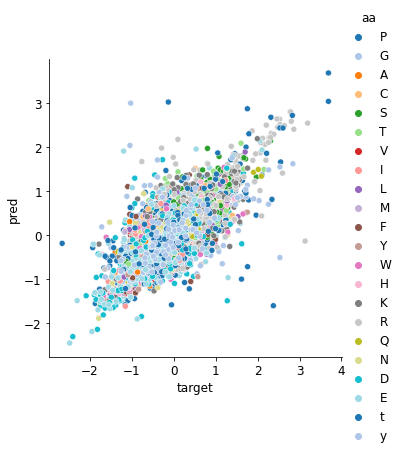

In [21]:
sns.relplot(x=np.log(pred2.target), y=np.log(pred2.pred), hue = pred2.aa,palette='tab20');

In [196]:
pearson = pred2.groupby('kinase')[['target','pred']].corr().pred.loc[::2].reset_index()

# Get the absolute value of pearson correlation, and name the column pearson
pearson['pearson'] = abs(pearson.pred)

pearson = pearson.merge(kinase_info, 'left')

print(f'The average pearson value across kinases in test set is : {pearson.pearson.mean().round(4)}')

The average pearson value across kinases in test set is : 0.7122


In [197]:
from katlas.plot import *

/usr/local/lib/python3.9/dist-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/lib/python3.9/dist-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/usr/local/lib/python3.9/dist-packages/umap/distances.py:1086: NumbaDeprecationWarning: The 'nopython' keyword argument 

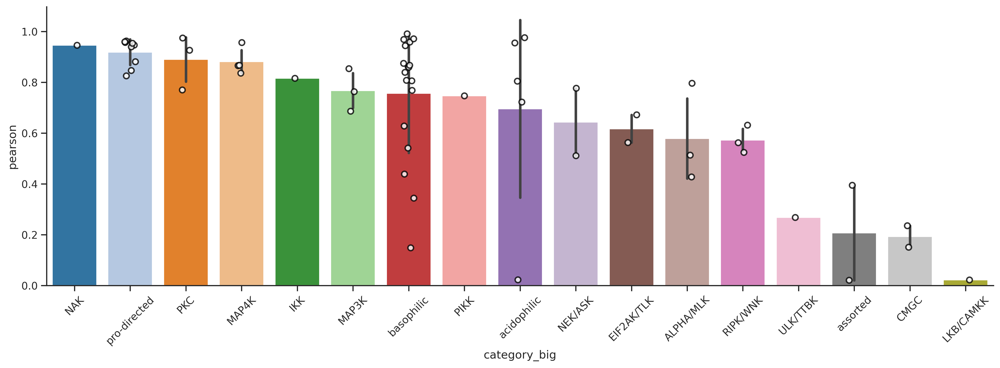

In [73]:
plot_bar(pearson,'pearson','category_big')

In [76]:
# sns.displot(pearson,
#             x = 'pearson',
#             aspect=2,
#             kind='kde',
#             hue = 'category_big',
#             palette = 'tab20',
#             height=4,
#             warn_singular=False
#            ).set(xlim=(0,1.5));

In [77]:
max_group = pearson.groupby('category_big').apply(lambda r: r.loc[r['pearson'].idxmax()]).reset_index(drop=True).sort_values('pearson',ascending=False)
min_group = pearson.groupby('category_big').apply(lambda r: r.loc[r['pearson'].idxmin()]).reset_index(drop=True).sort_values('pearson',ascending=False)

In [80]:
pred2 = pred2.rename(columns= {'target':'label'})

In [90]:
max_group

,kinase,level_1,pred,pearson,Family,category,category_big
15,AKT3,target,0.990703,0.990703,AGC,AKT/ROCK,basophilic
13,CK1D,target,0.975654,0.975654,CK1,CK1,acidophilic
10,PKCH,target,0.974316,0.974316,AGC,PKC,PKC
16,CDK3,target,0.962571,0.962571,CMGC,CDK_I,pro-directed
6,TAO2,target,0.956400,0.956400,STE,MAP4K,MAP4K
7,AAK1,target,0.946311,0.946311,Other,NAK,NAK
5,MST2,target,0.853678,0.853678,STE,MAP3K,MAP3K
3,TBK1,target,0.815741,0.815741,Other,IKK,IKK
0,MLK4,target,0.796159,0.796159,STE,ALPHA/MLK,ALPHA/MLK
8,NEK4,target,0.776560,0.776560,Other,NEK/ASK,NEK/ASK


------AKT3------
Logo of AKT3  from raw dataset


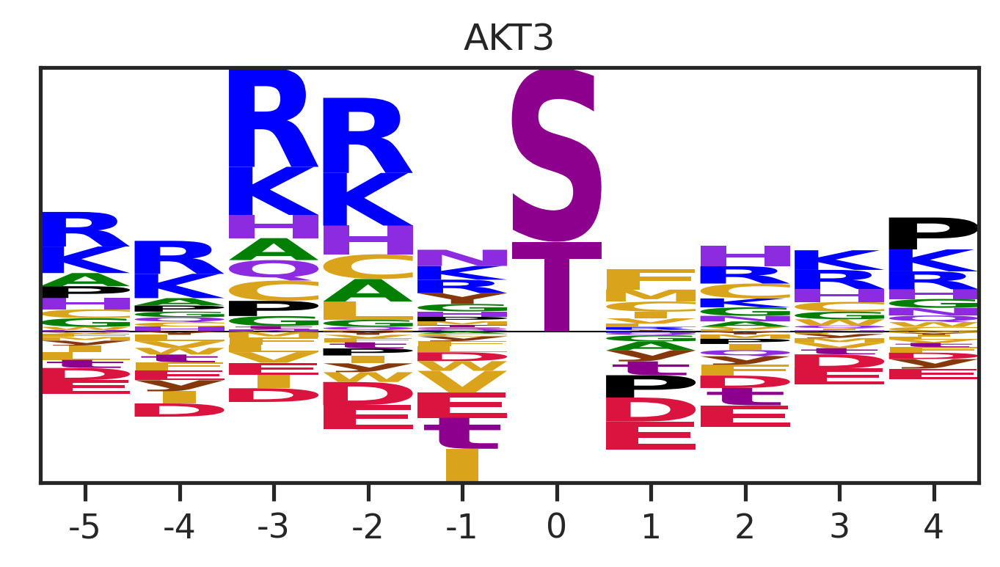

Logo of AKT3  from reversed label


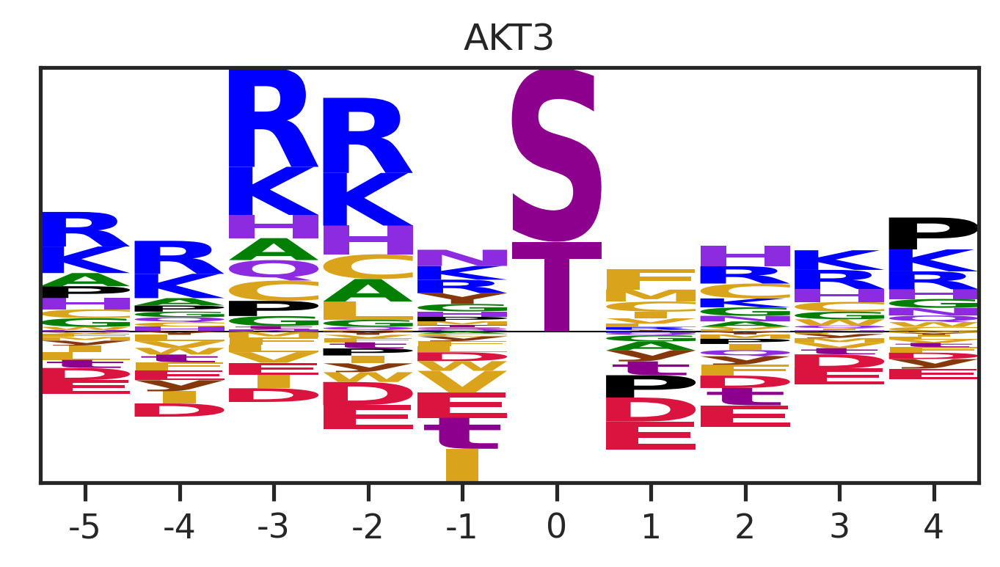

Logo of AKT3  based on prediction


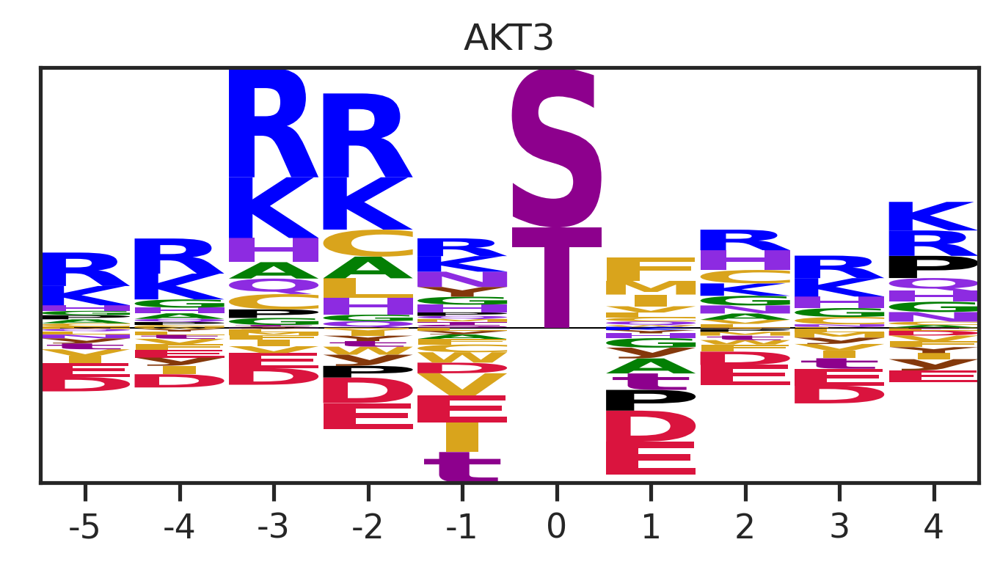

correlation


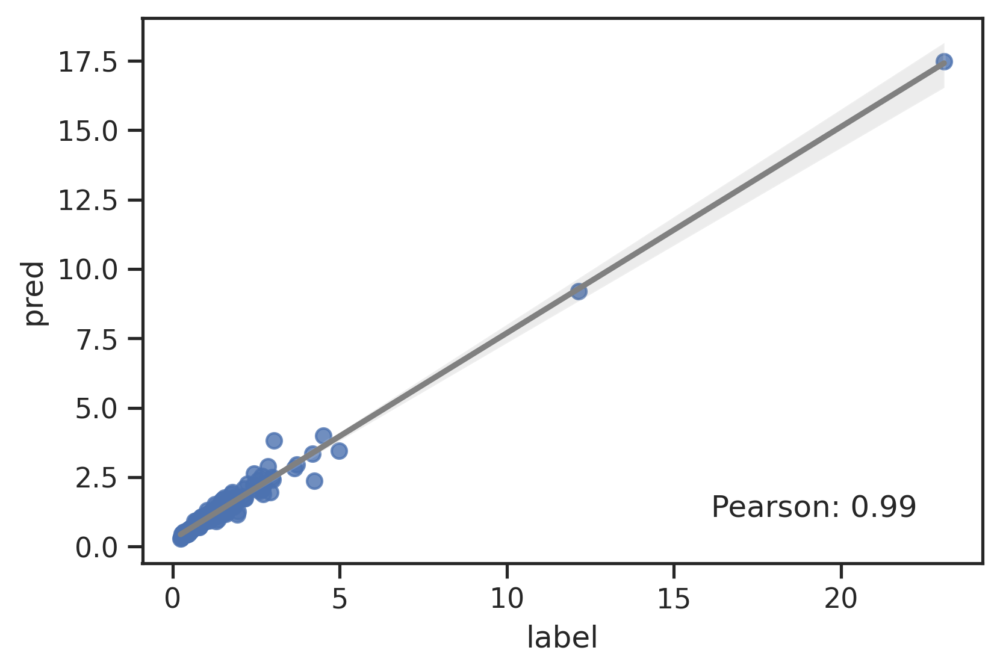

colored by aa


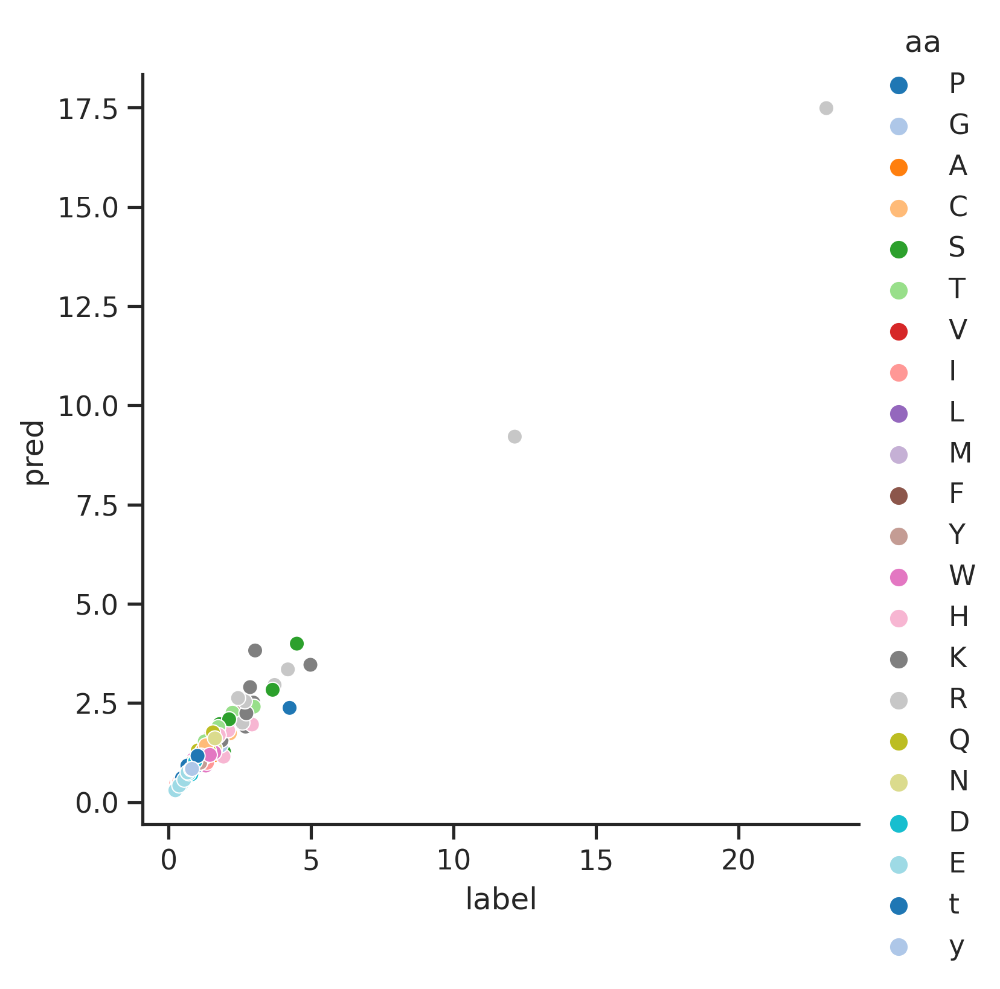

------CK1D------
Logo of CK1D  from raw dataset


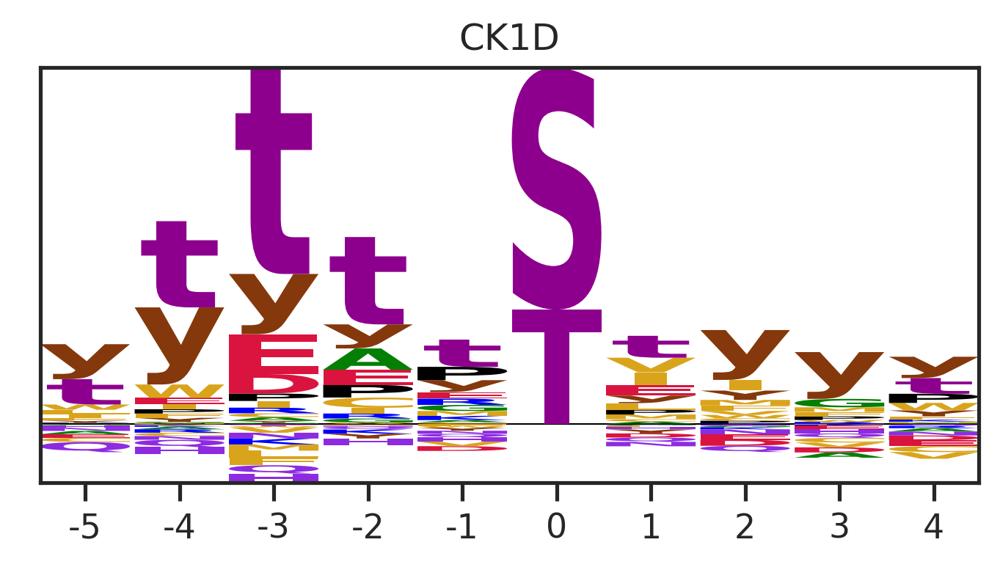

Logo of CK1D  from reversed label


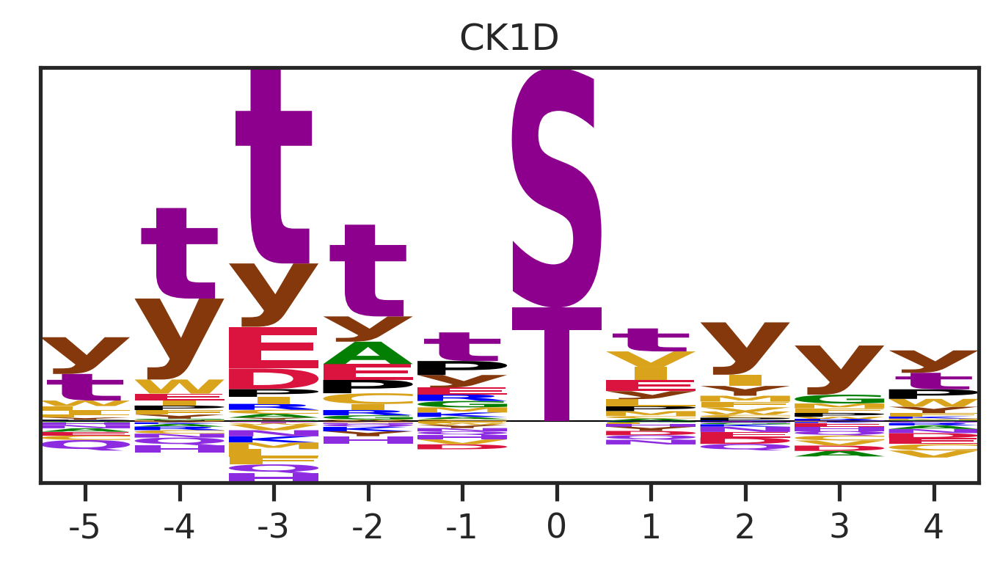

Logo of CK1D  based on prediction


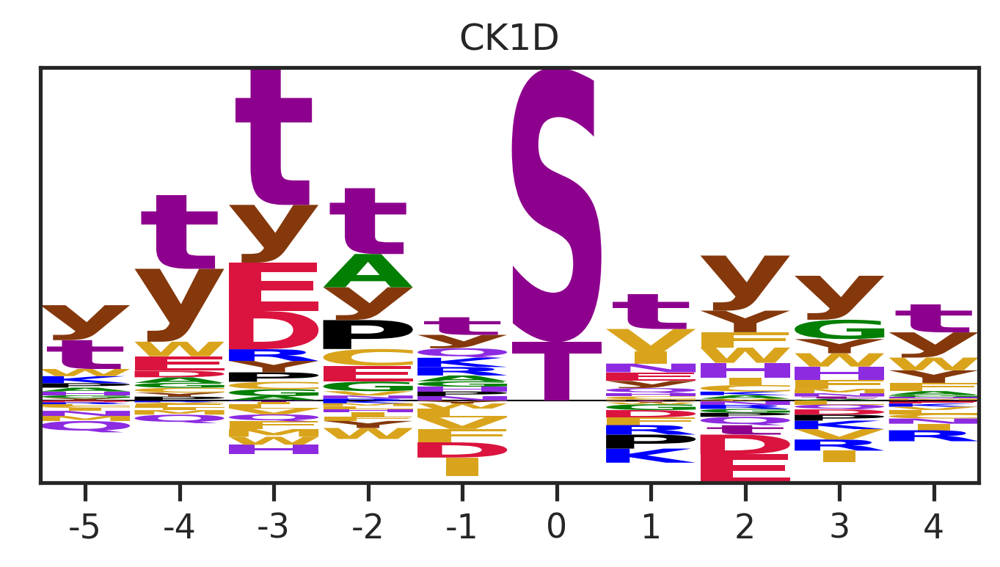

correlation


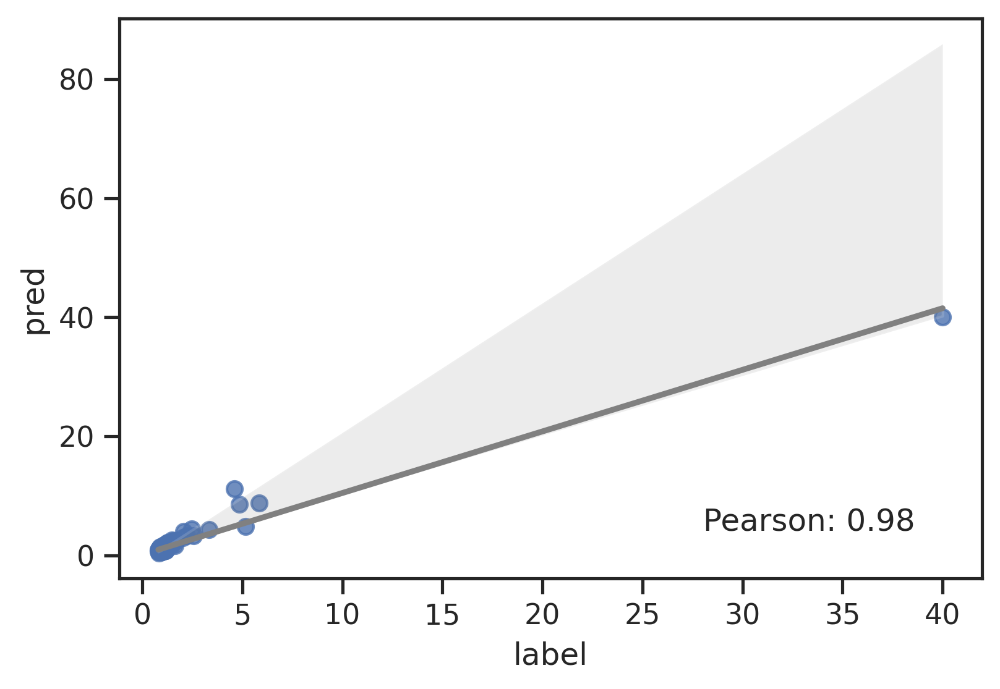

colored by aa


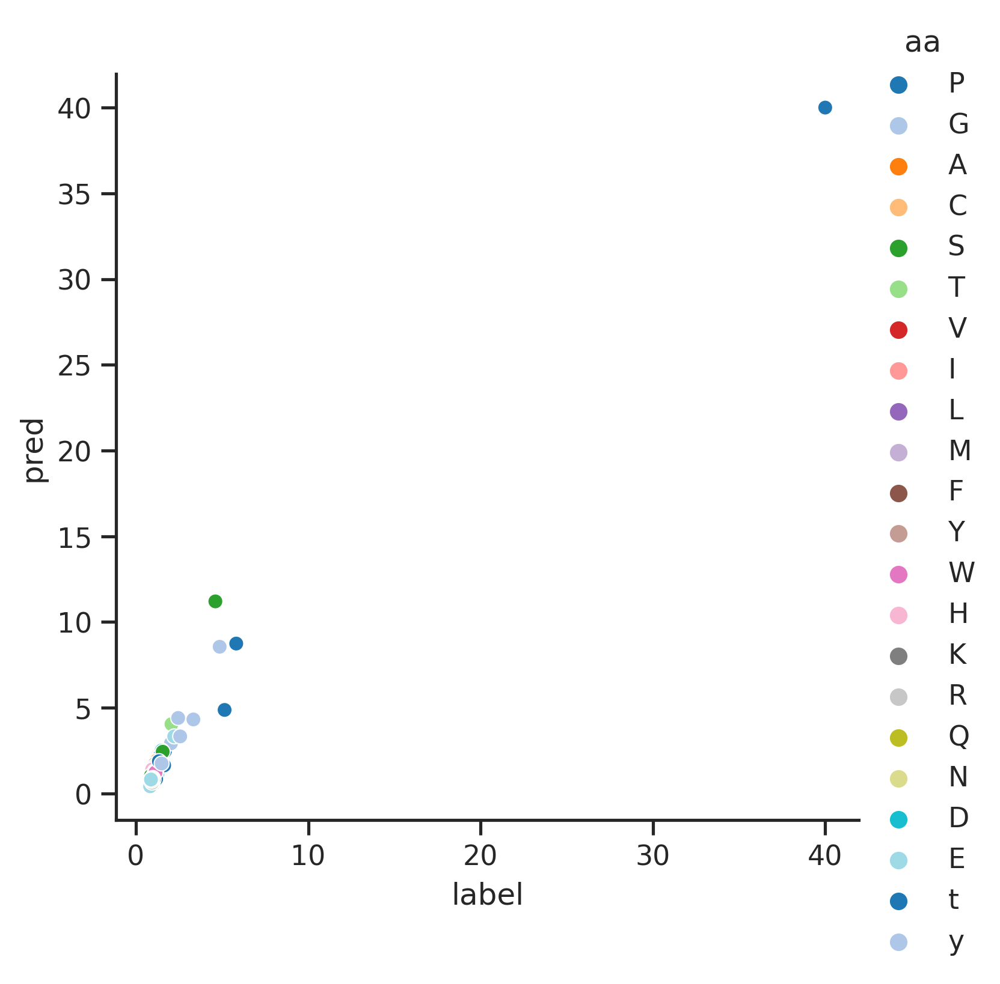

------PKCH------
Logo of PKCH  from raw dataset


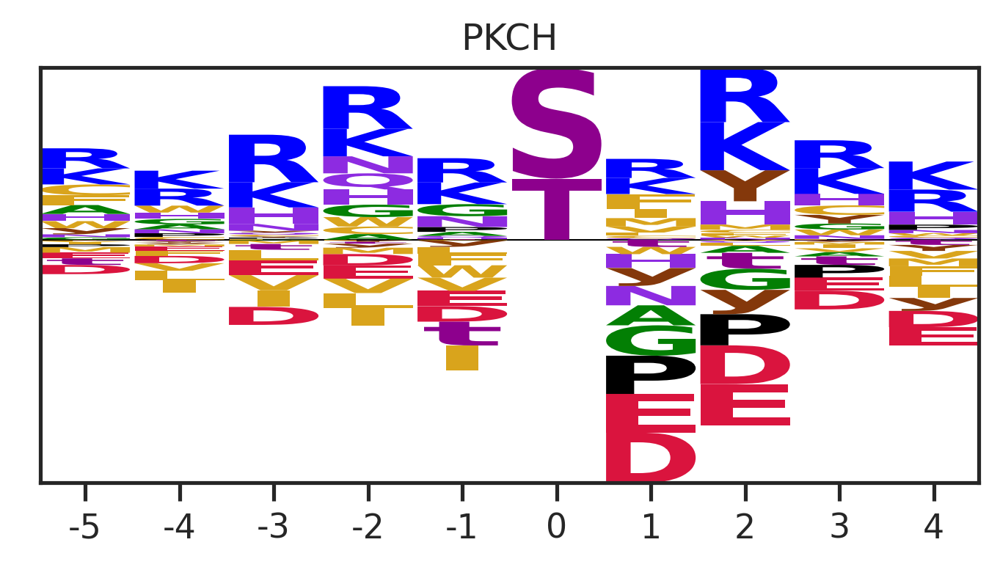

Logo of PKCH  from reversed label


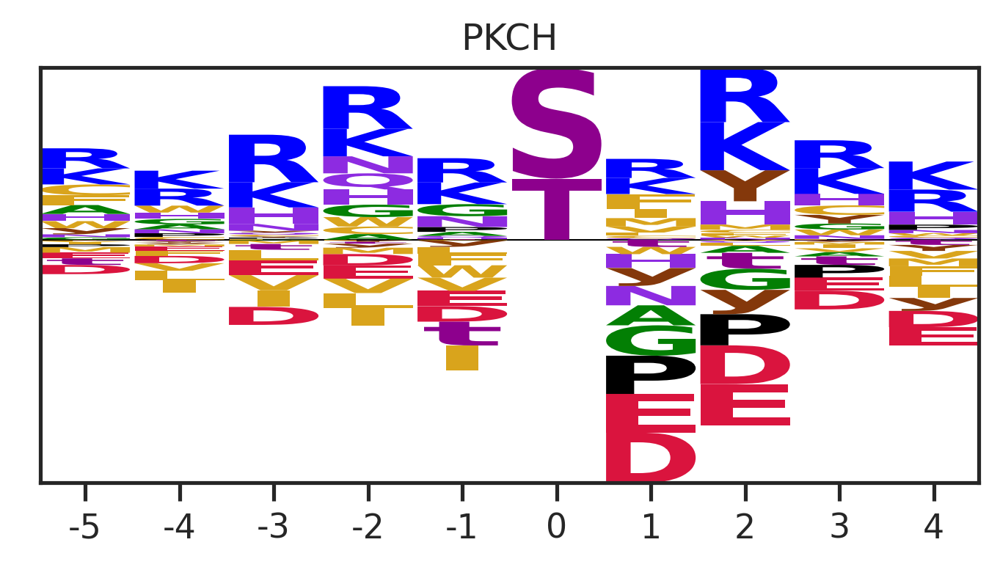

Logo of PKCH  based on prediction


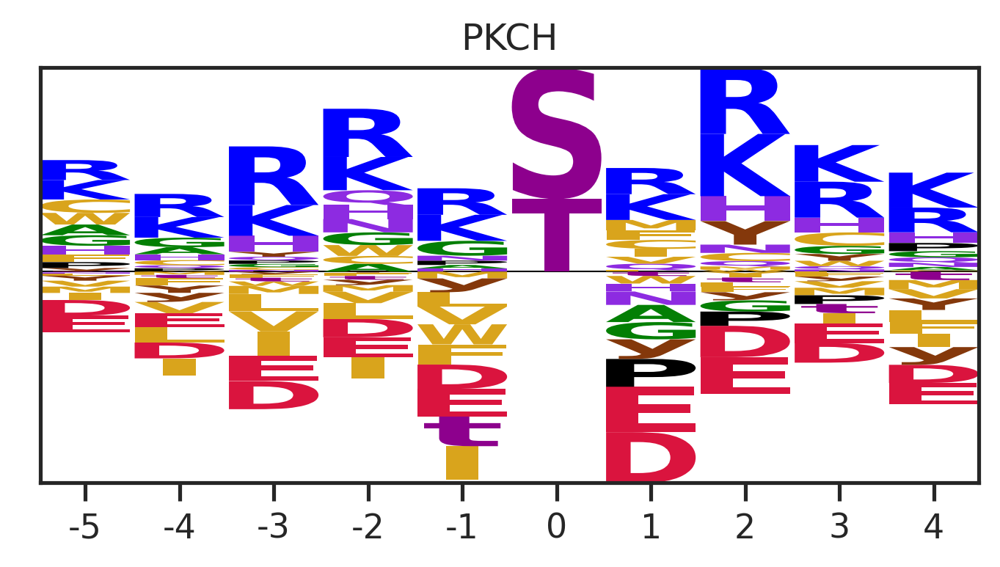

correlation


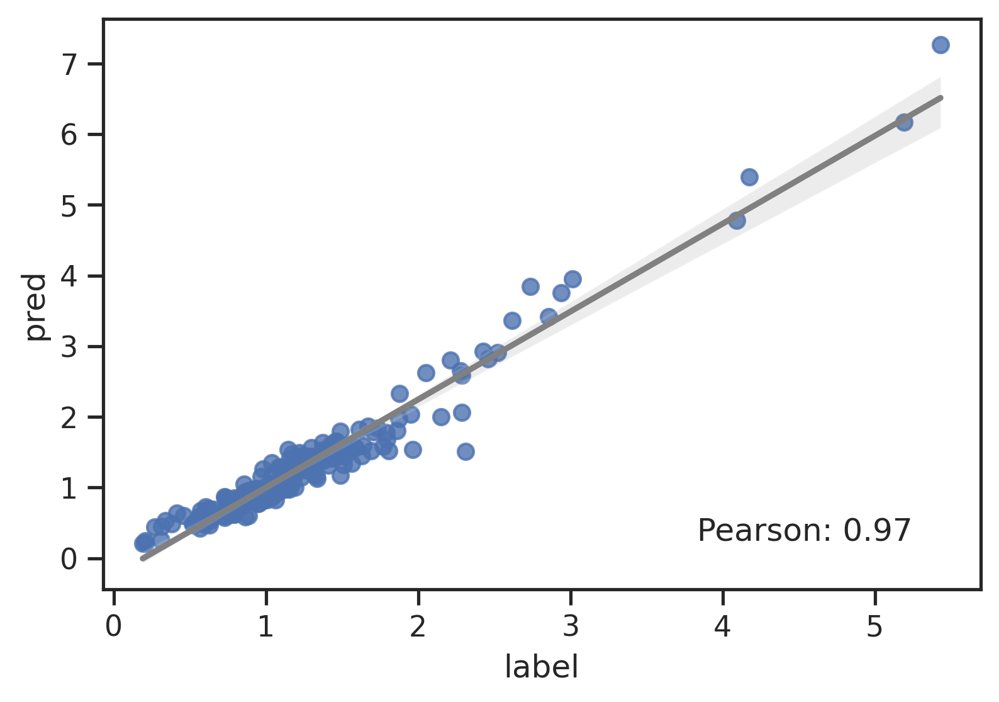

colored by aa


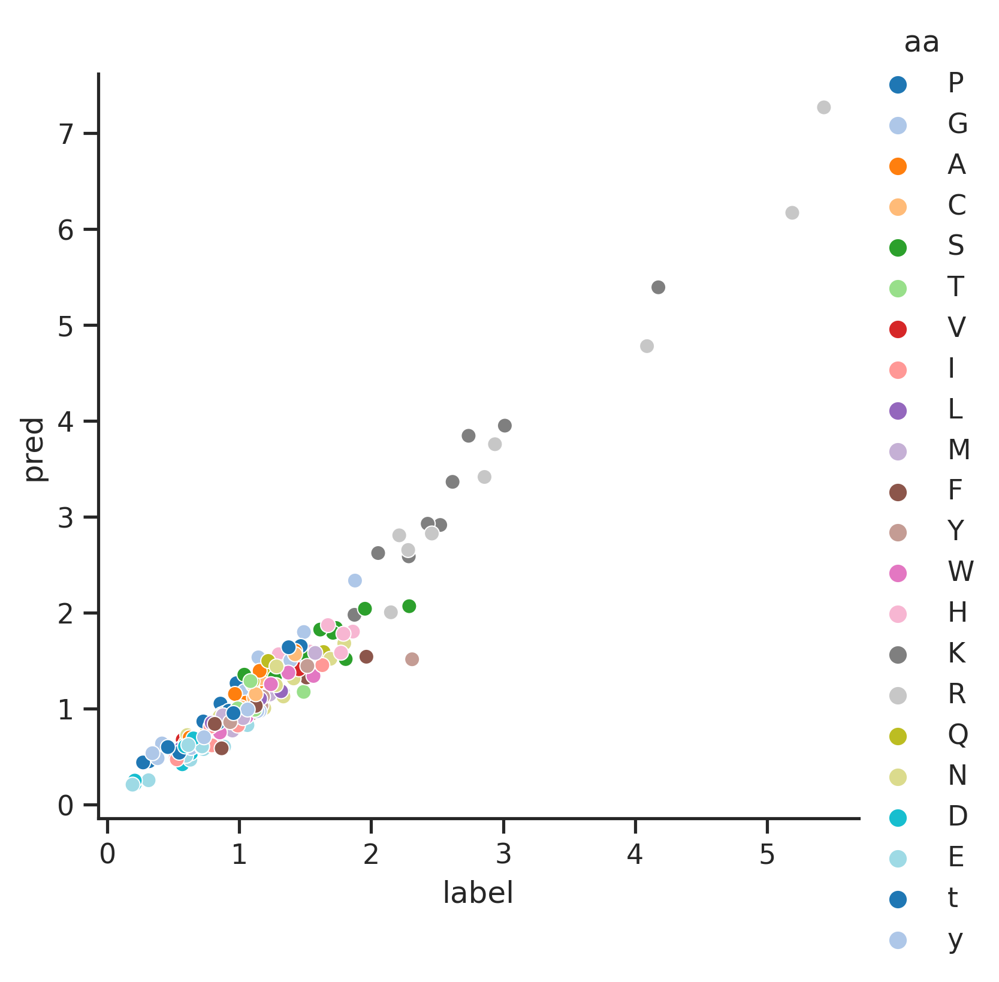

------CDK3------
Logo of CDK3  from raw dataset


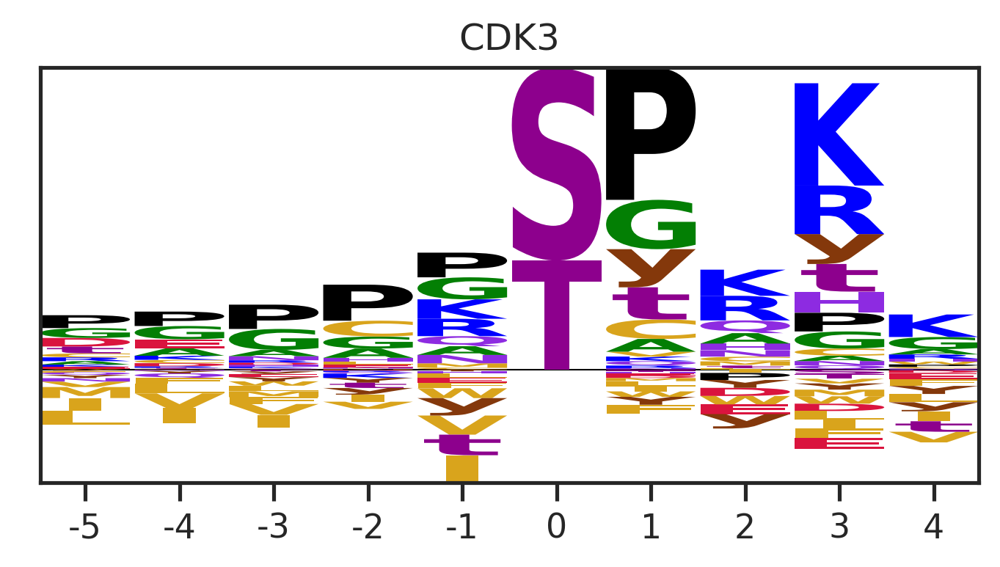

Logo of CDK3  from reversed label


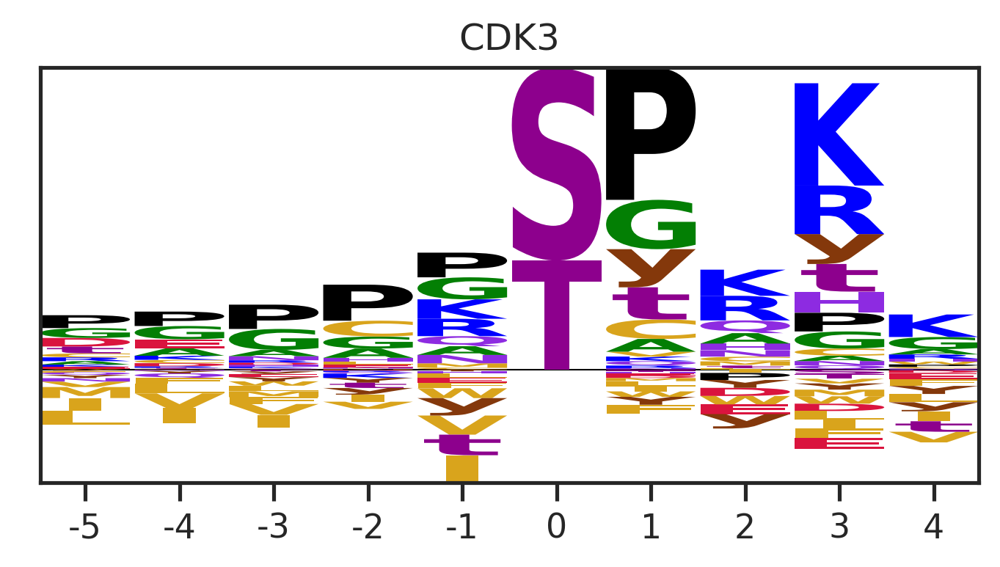

Logo of CDK3  based on prediction


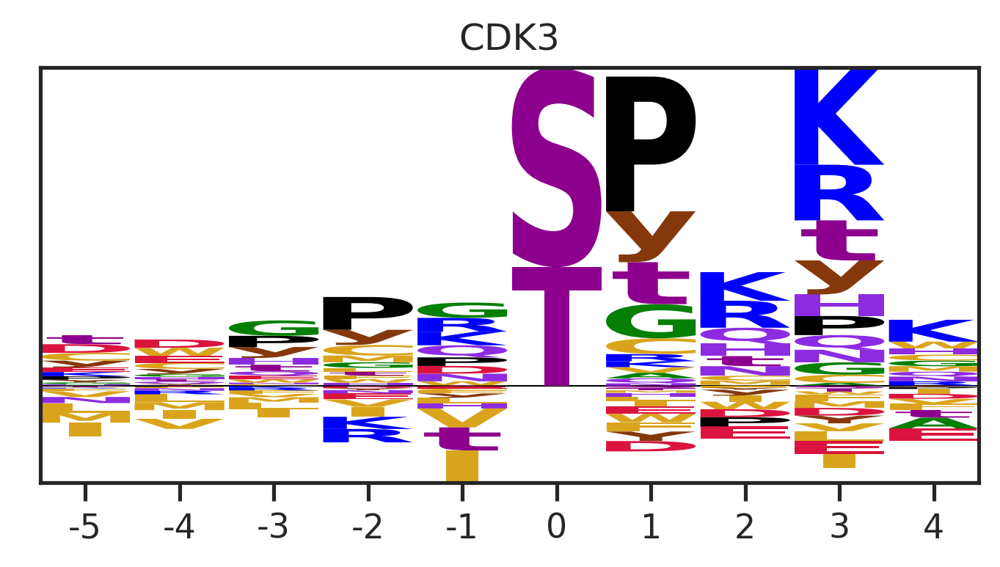

correlation


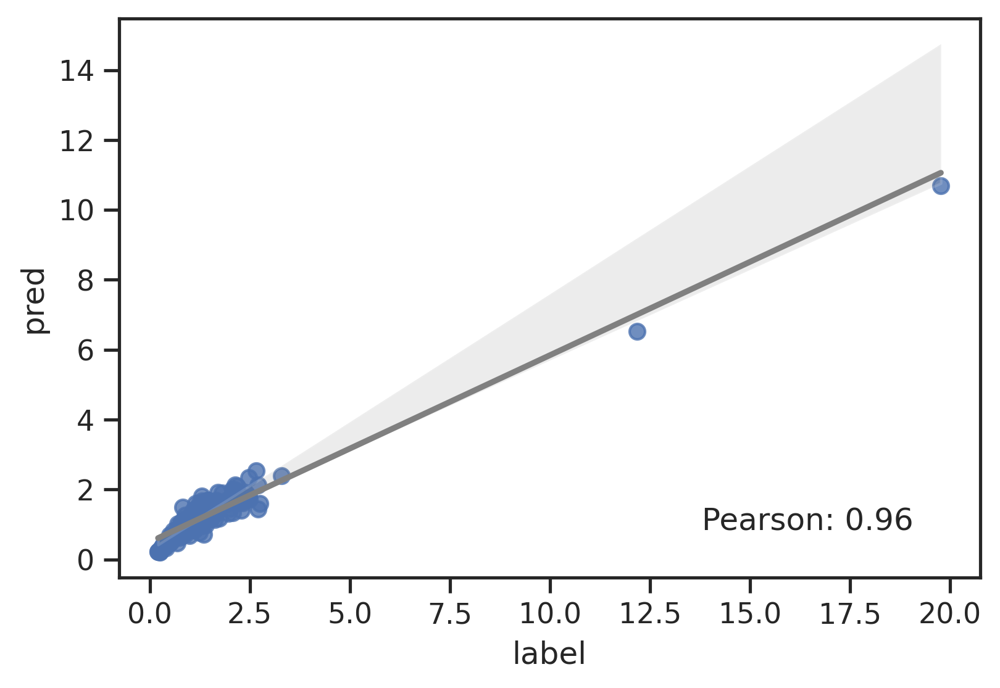

colored by aa


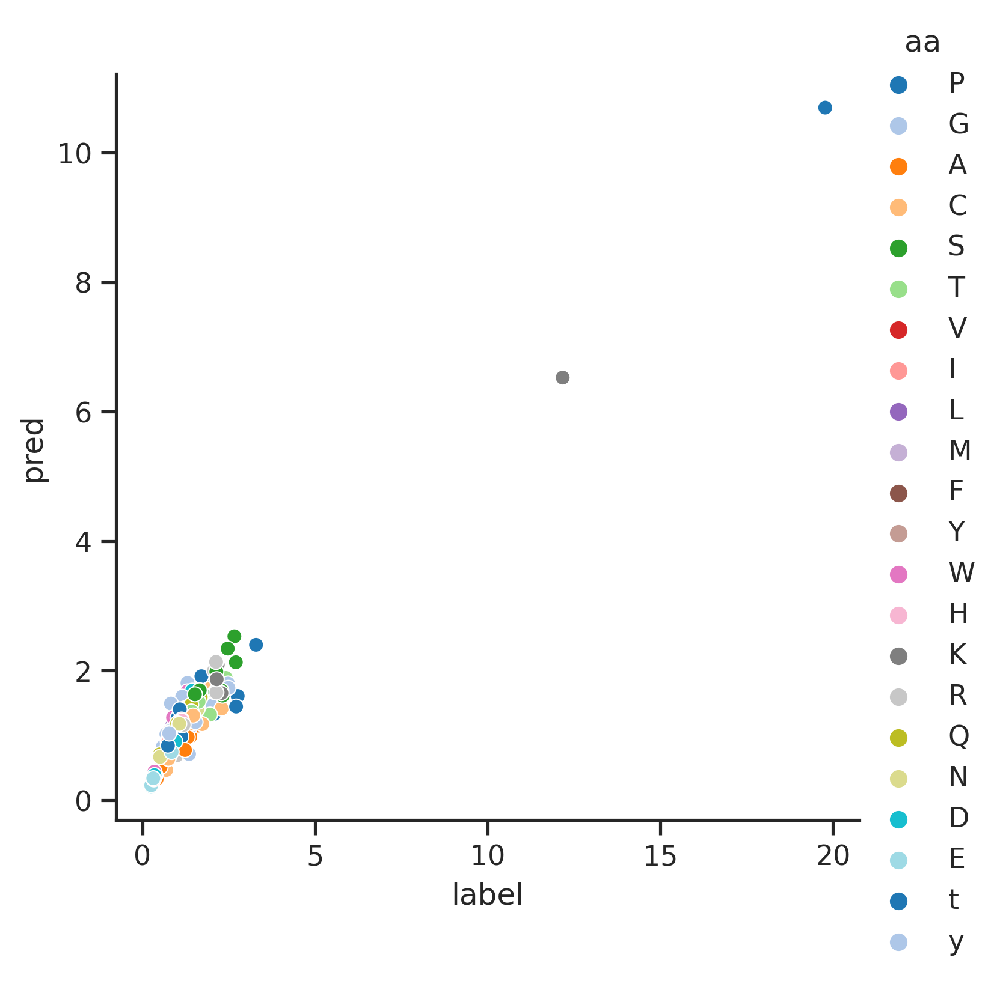

------TAO2------
Logo of TAO2  from raw dataset


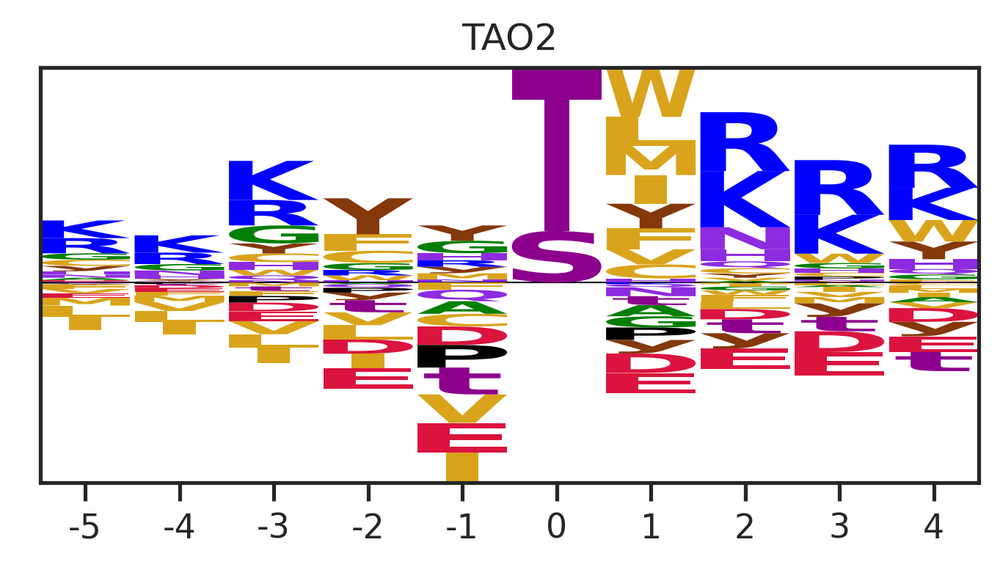

Logo of TAO2  from reversed label


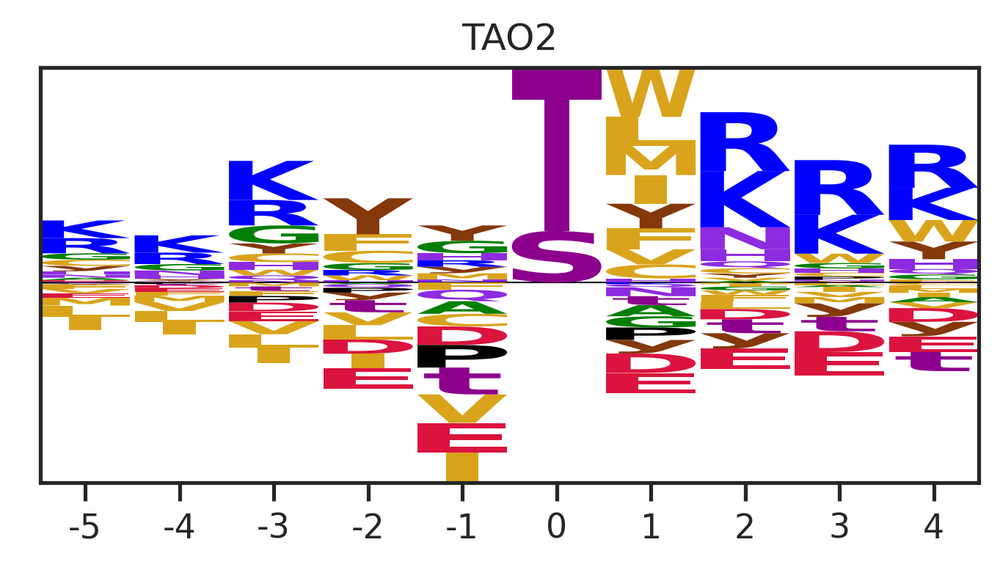

Logo of TAO2  based on prediction


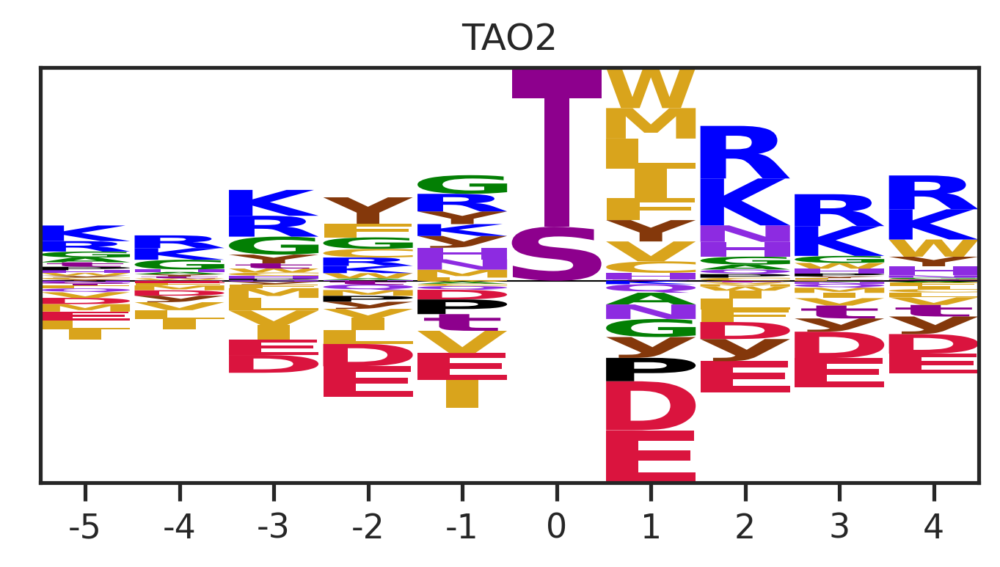

correlation


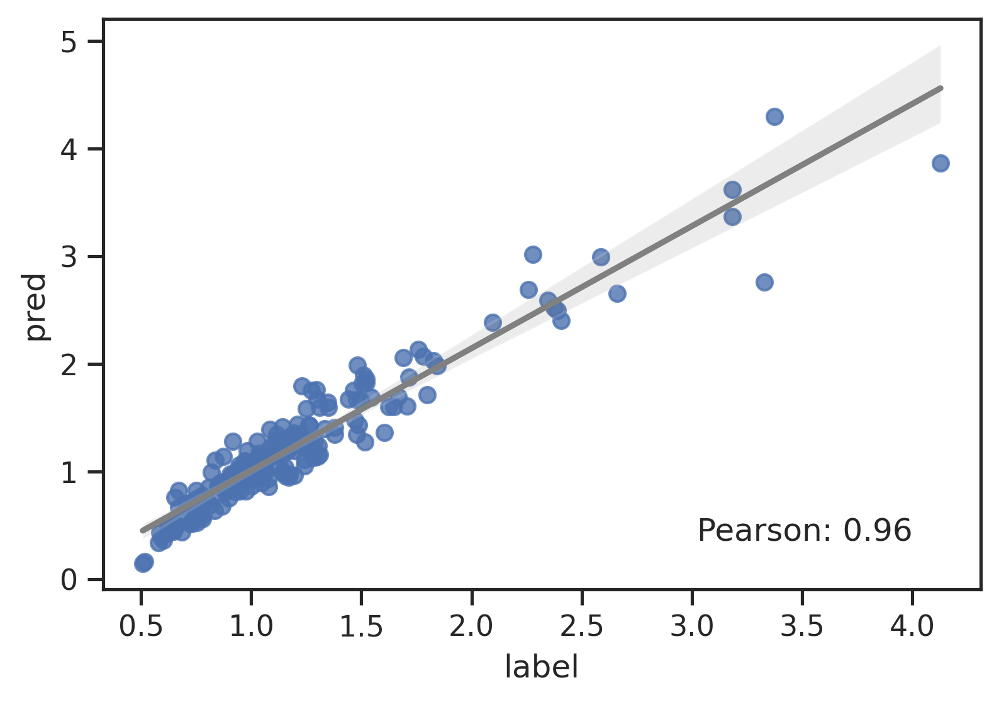

colored by aa


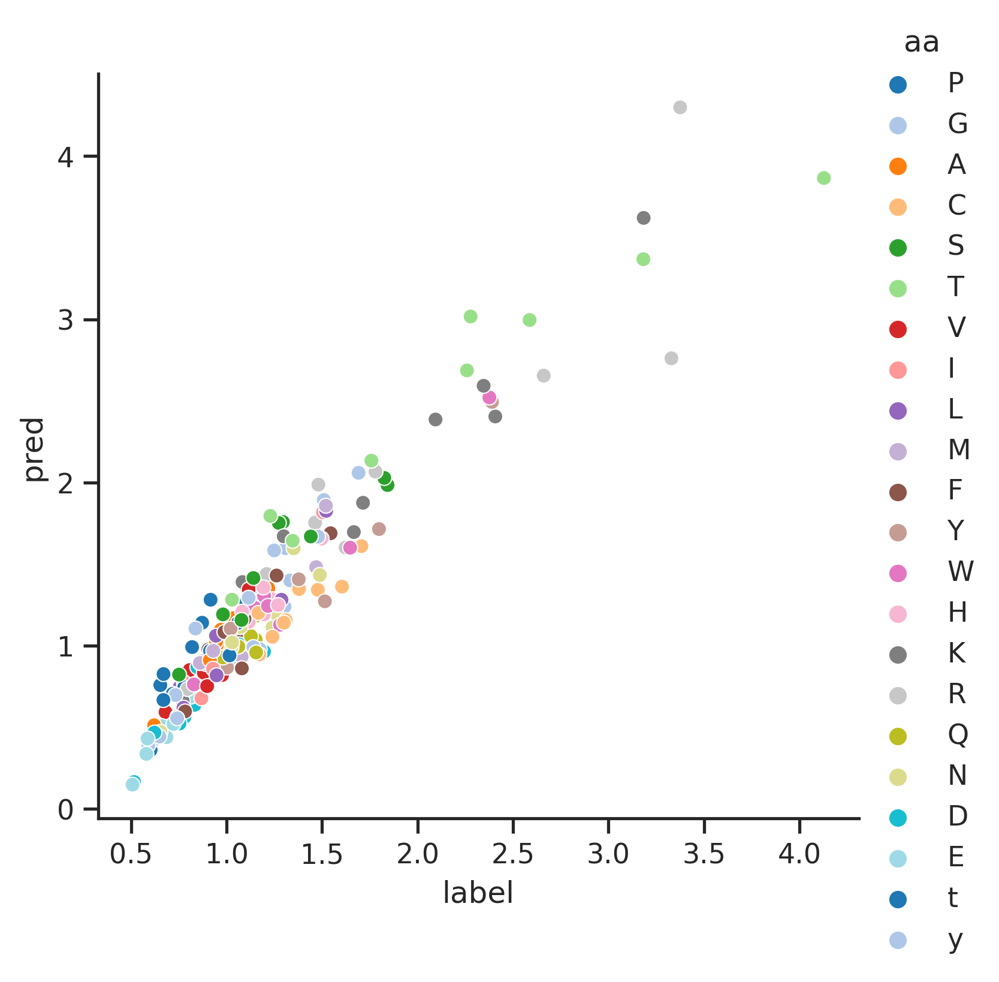

------AAK1------
Logo of AAK1  from raw dataset


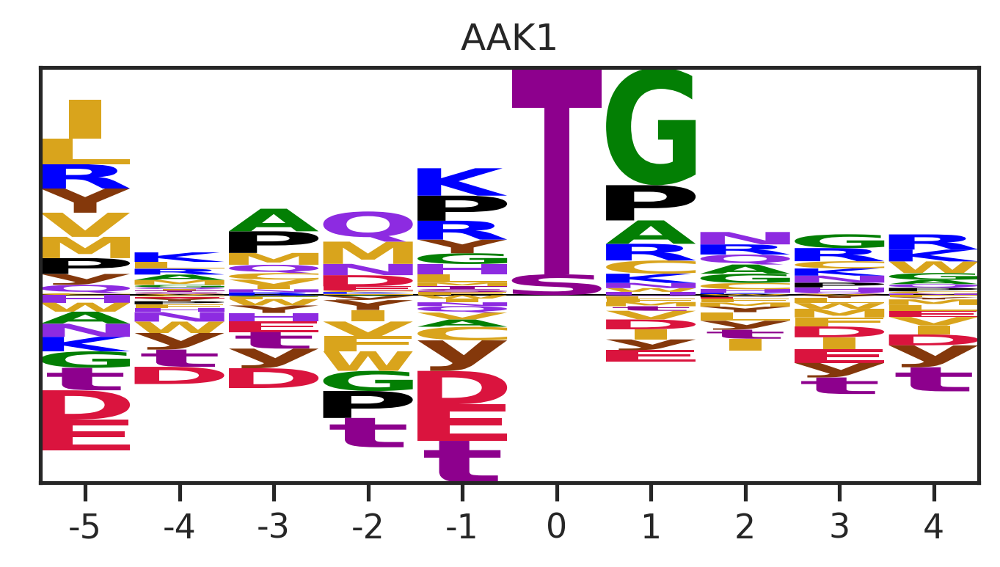

Logo of AAK1  from reversed label


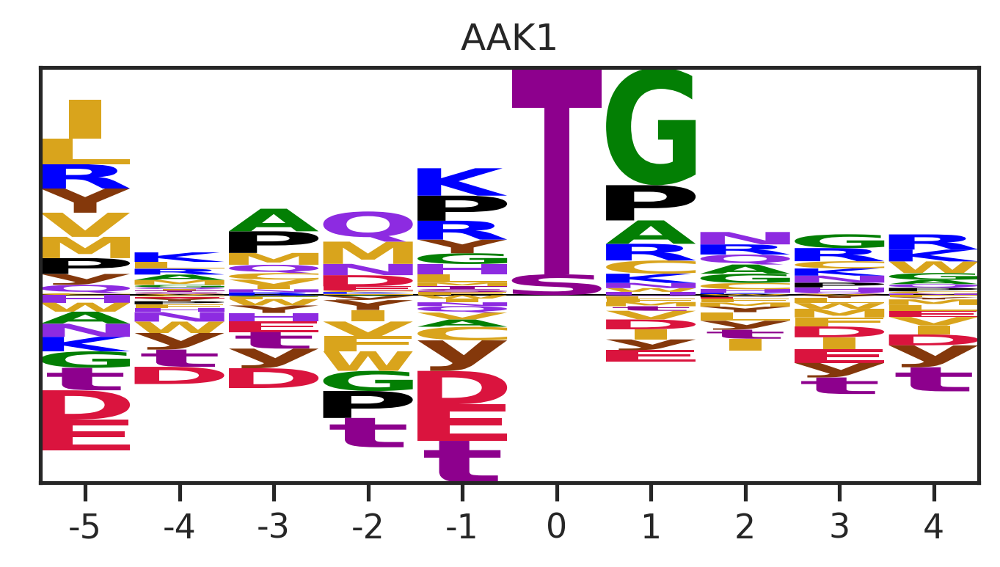

Logo of AAK1  based on prediction


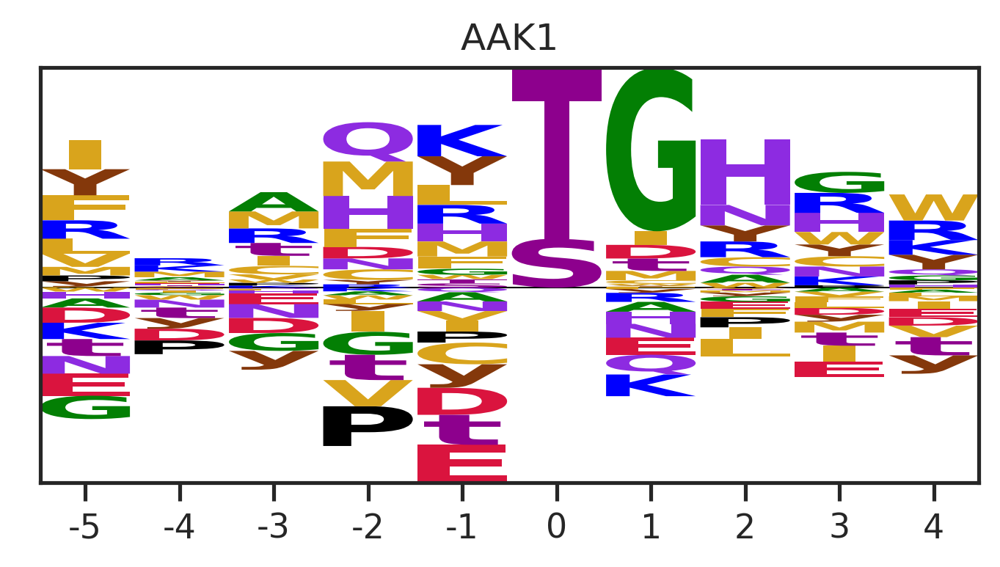

correlation


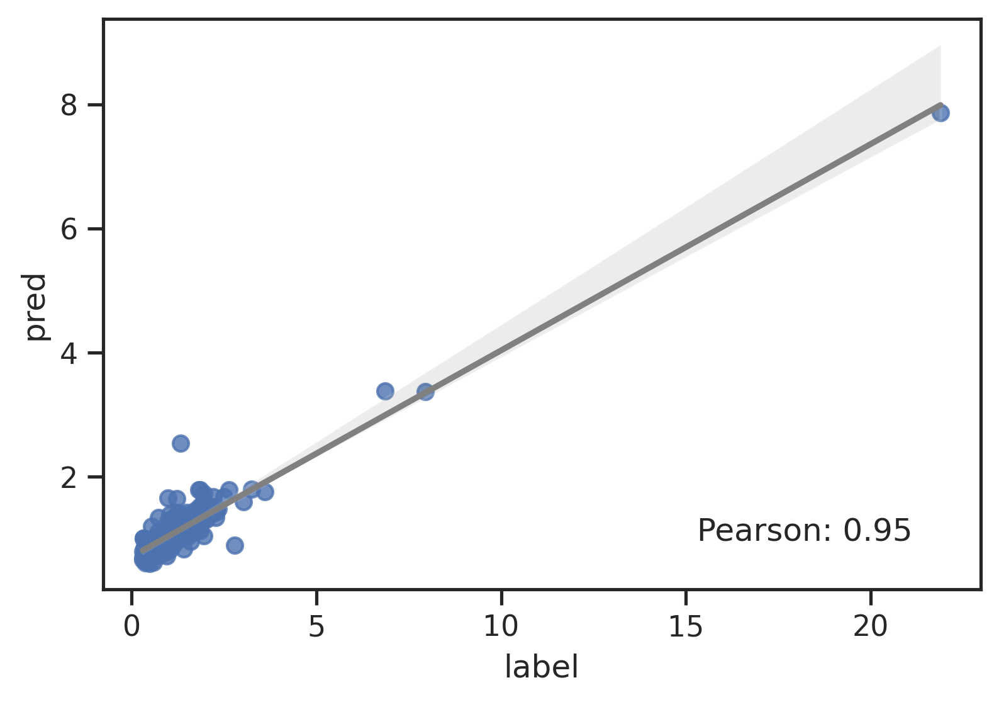

colored by aa


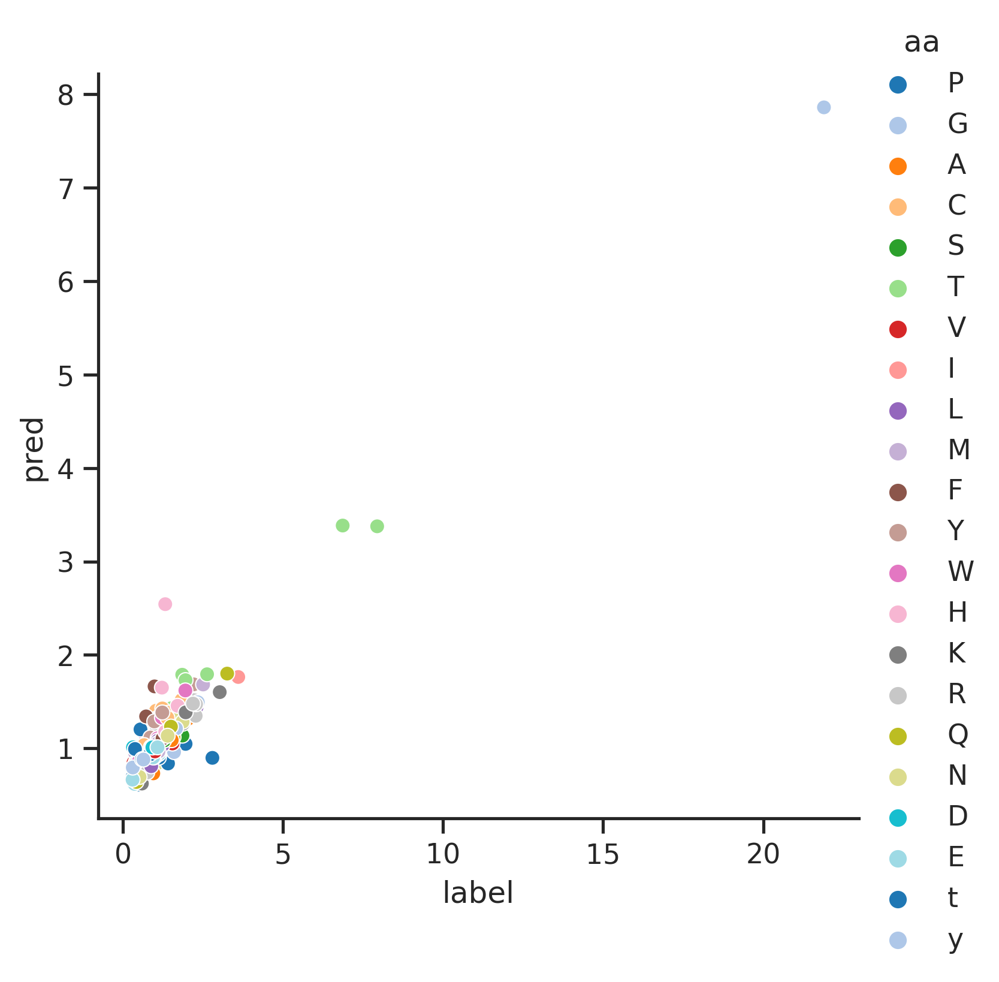

------MST2------
Logo of MST2  from raw dataset


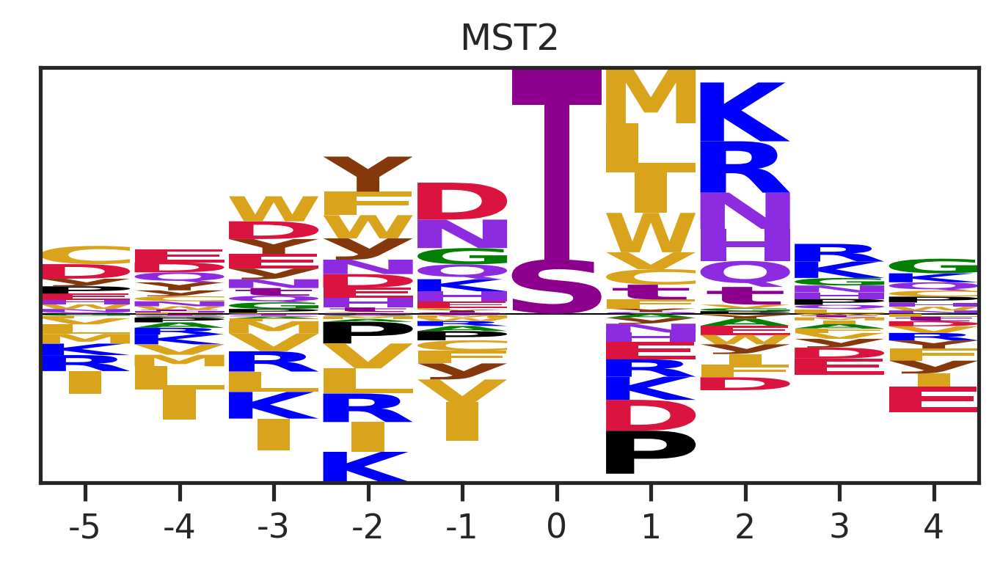

Logo of MST2  from reversed label


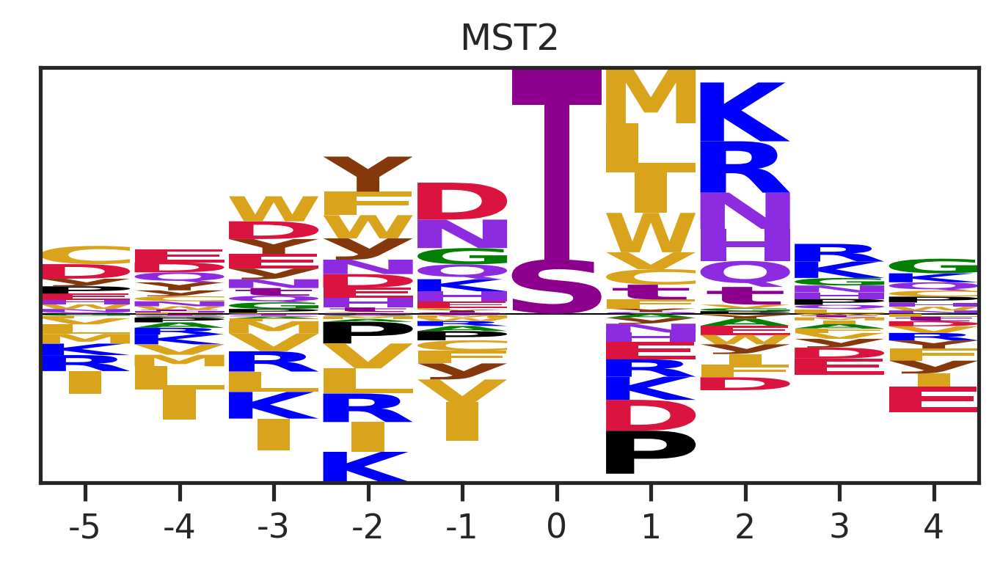

Logo of MST2  based on prediction


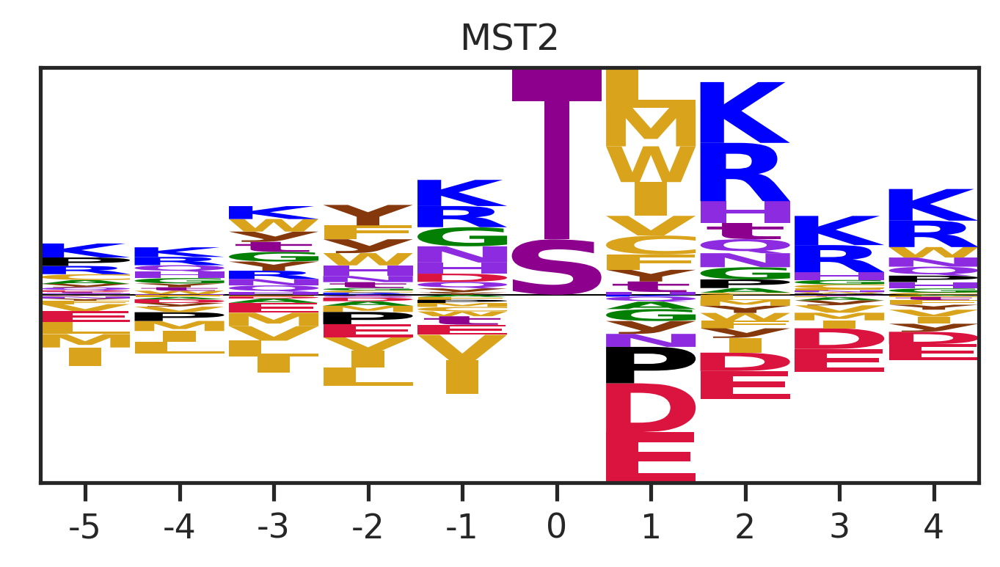

correlation


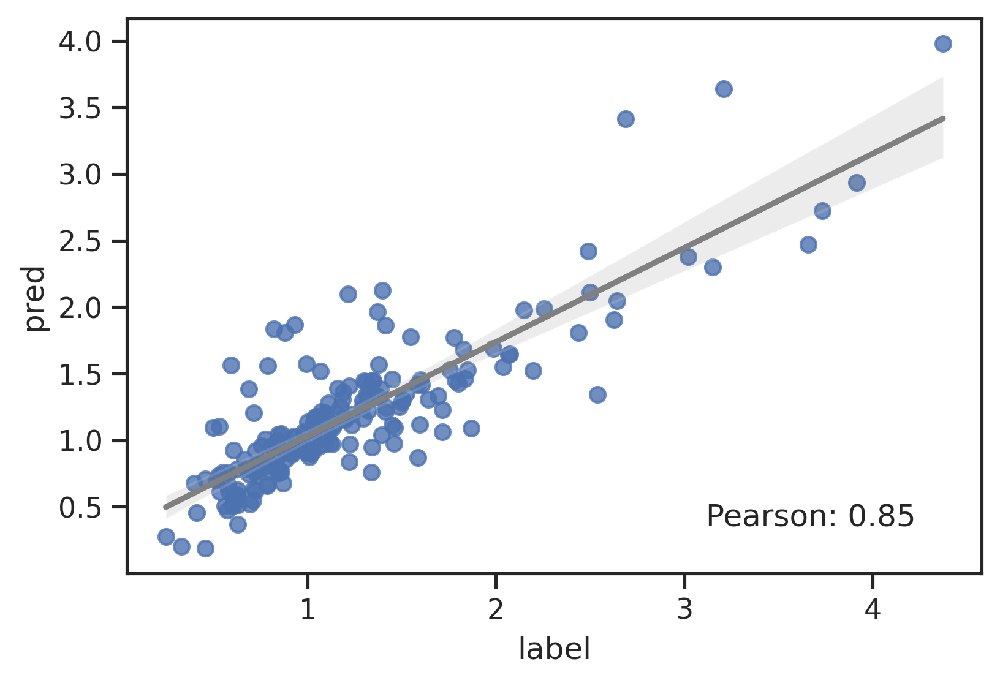

colored by aa


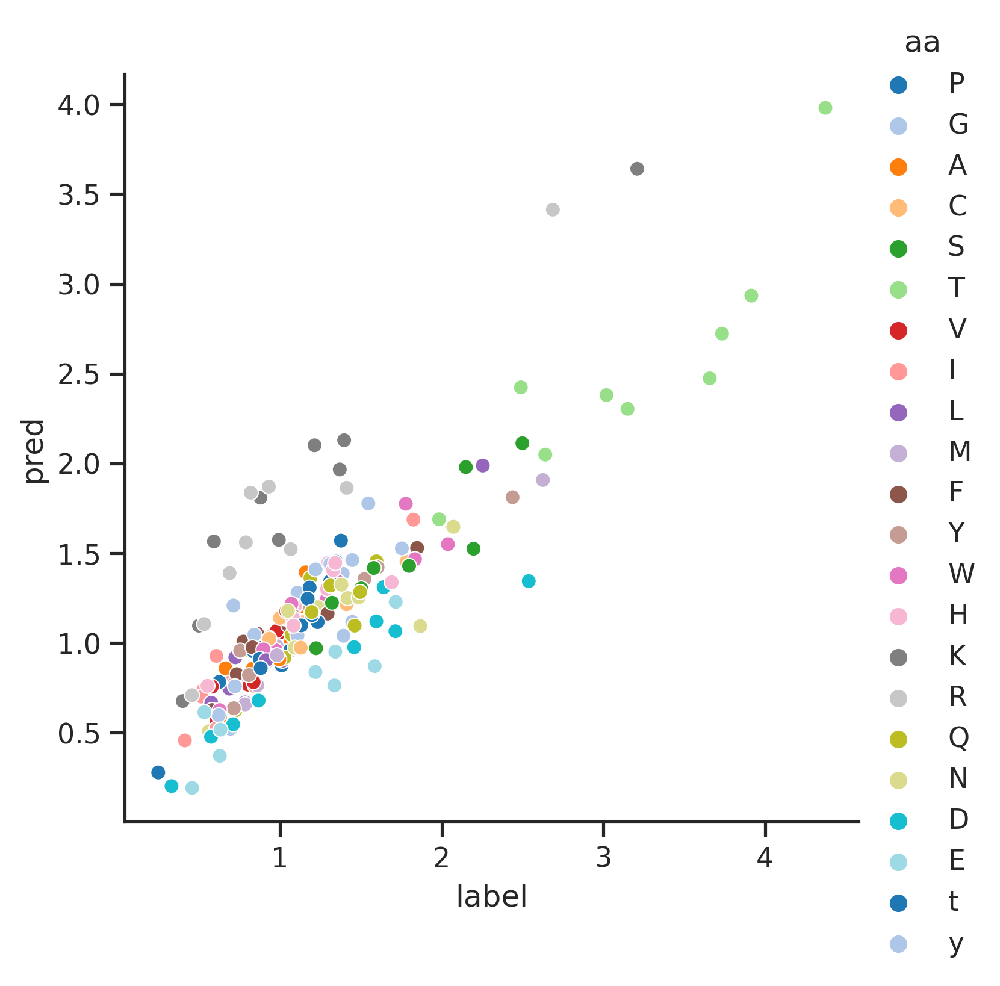

------TBK1------
Logo of TBK1  from raw dataset


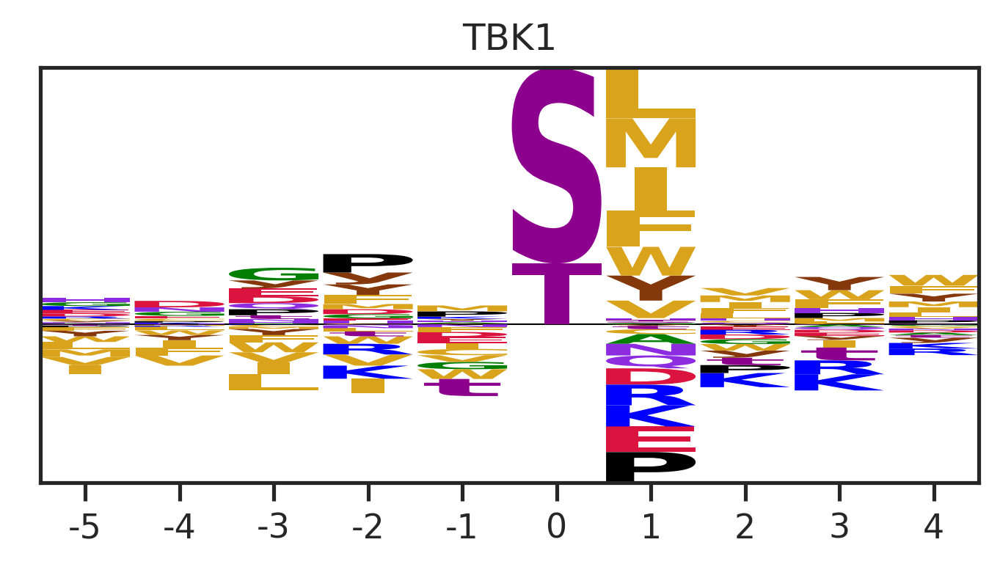

Logo of TBK1  from reversed label


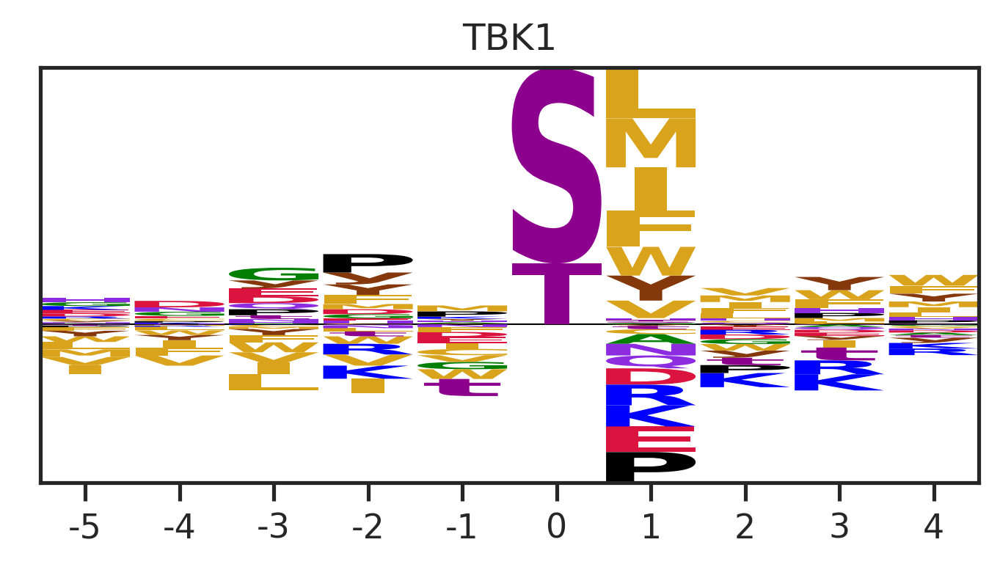

Logo of TBK1  based on prediction


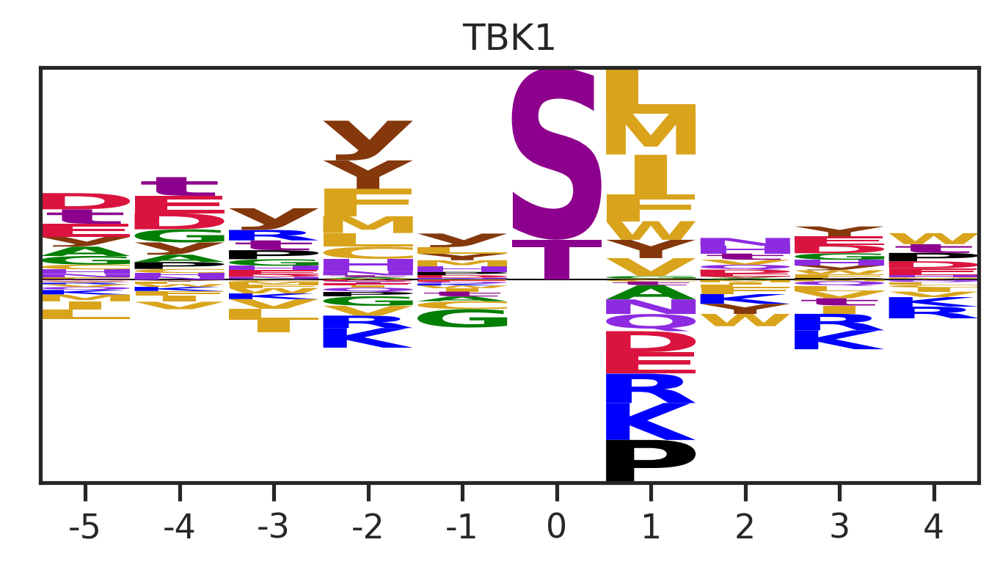

correlation


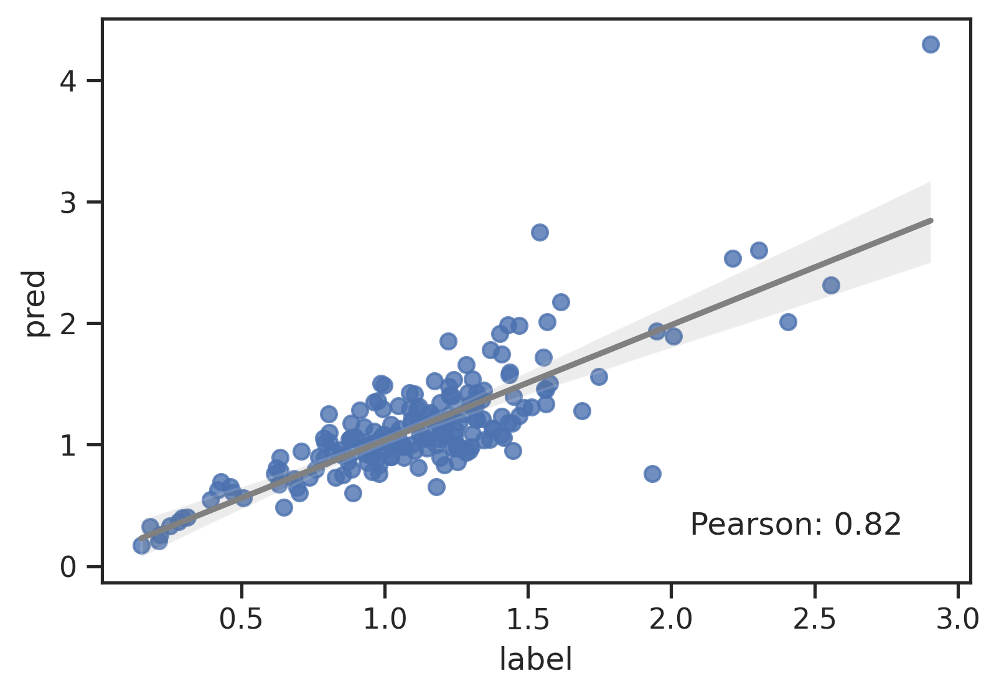

colored by aa


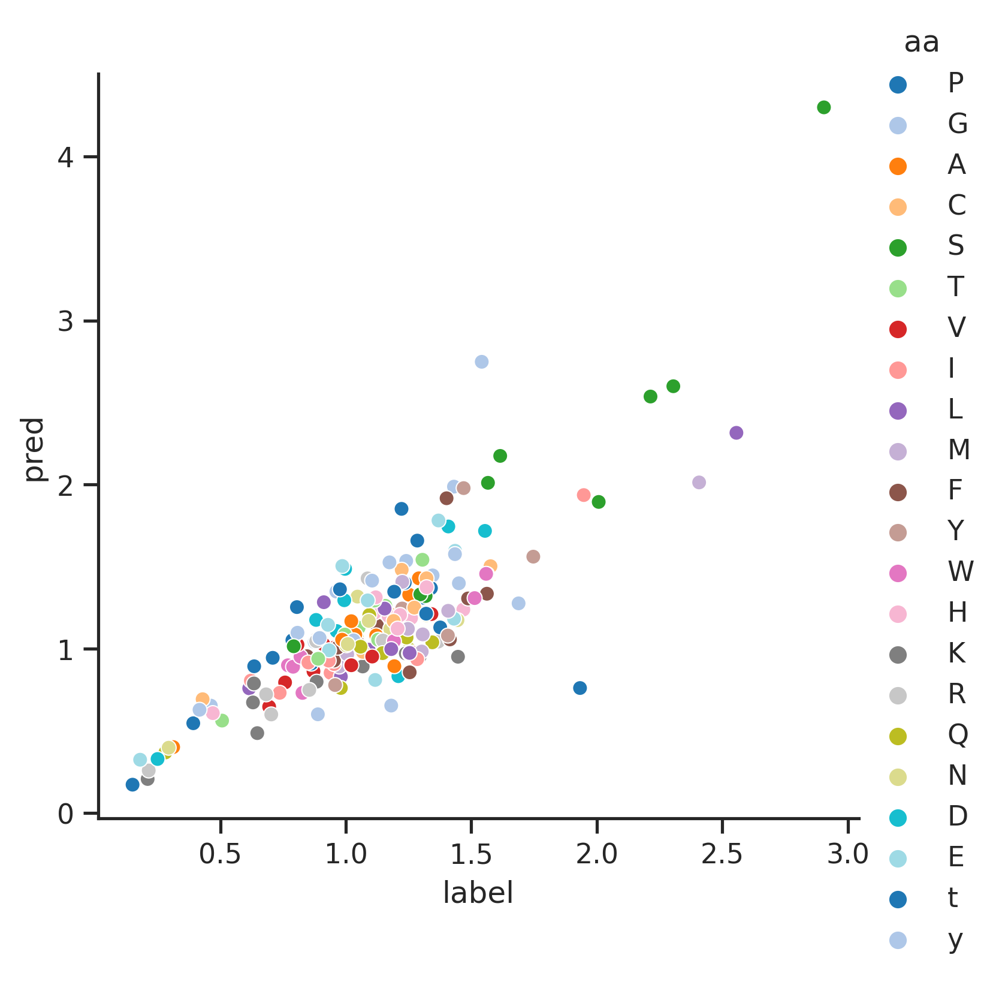

------MLK4------
Logo of MLK4  from raw dataset


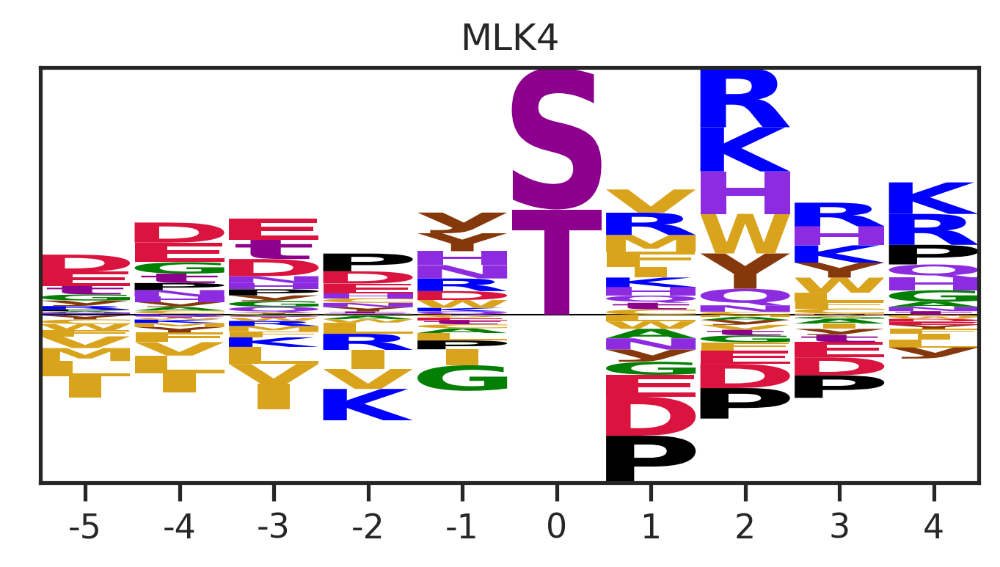

Logo of MLK4  from reversed label


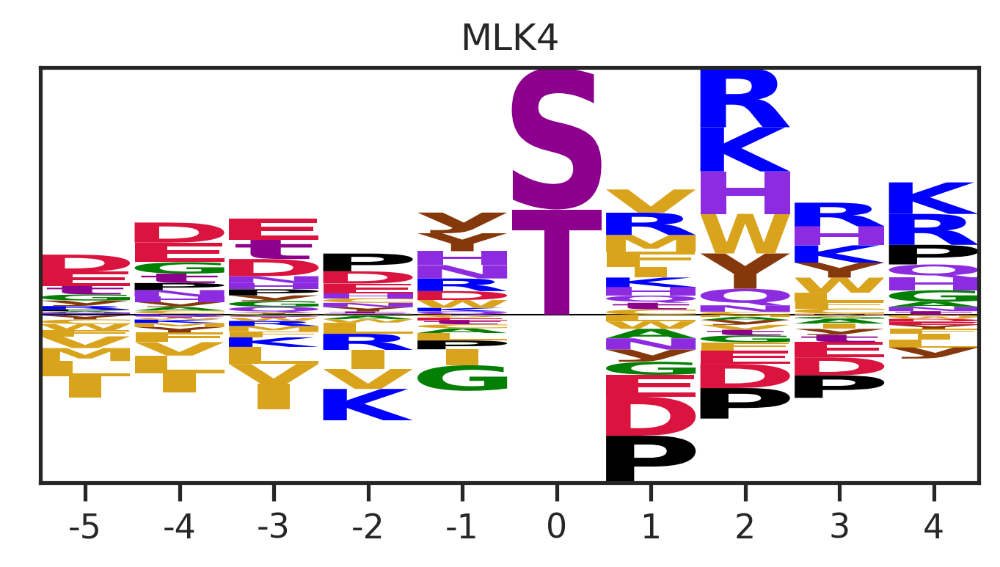

Logo of MLK4  based on prediction


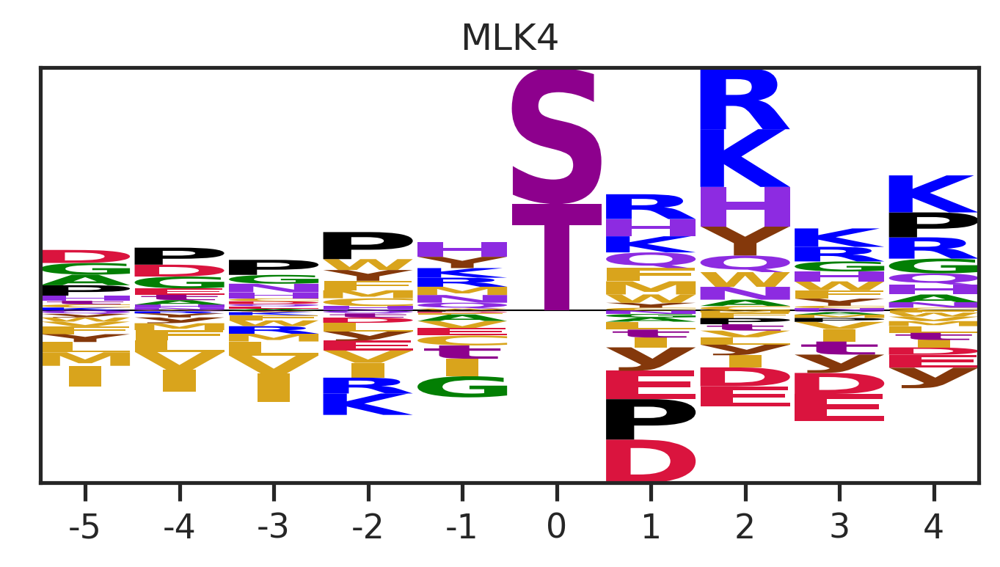

correlation


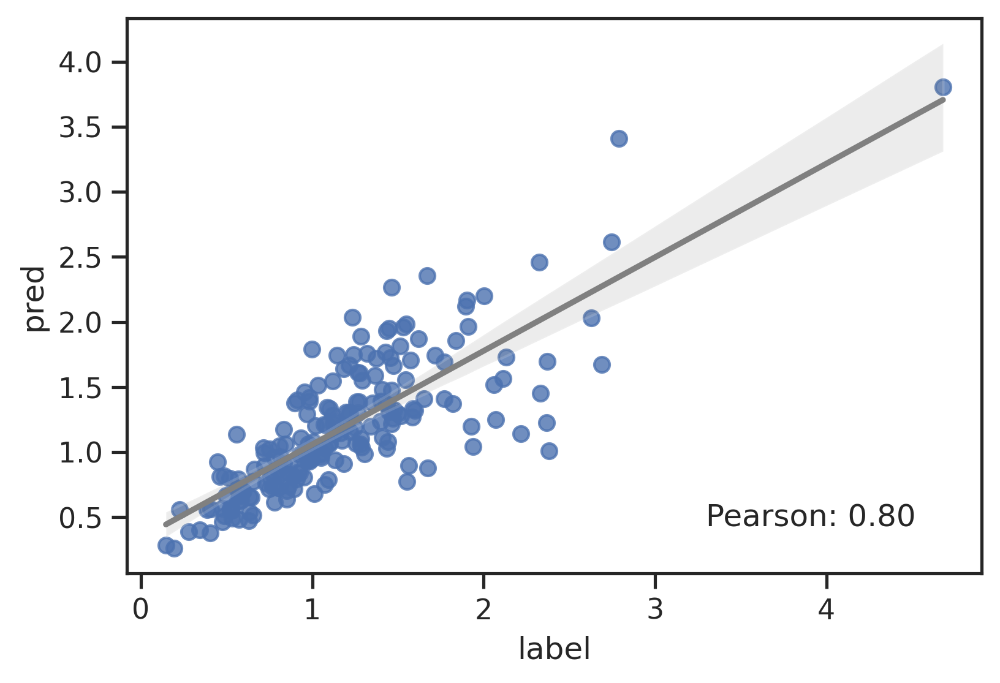

colored by aa


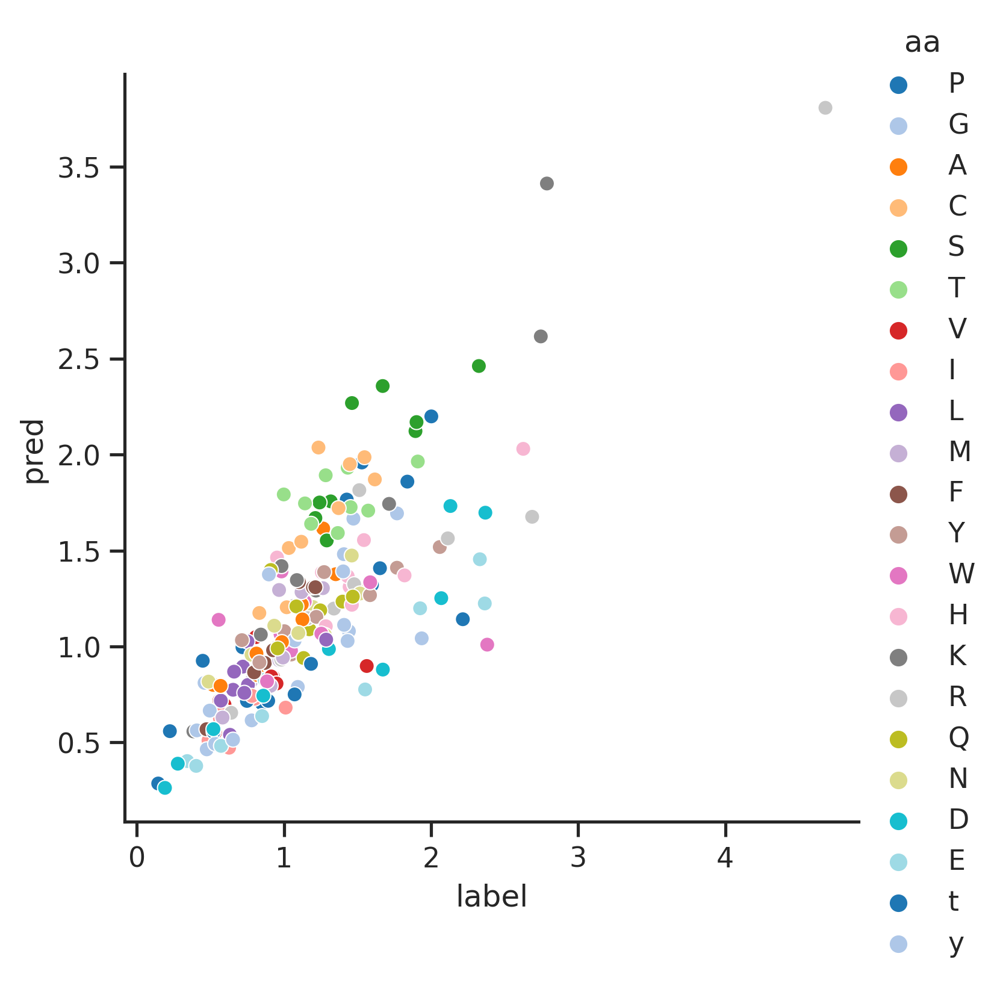

------NEK4------
Logo of NEK4  from raw dataset


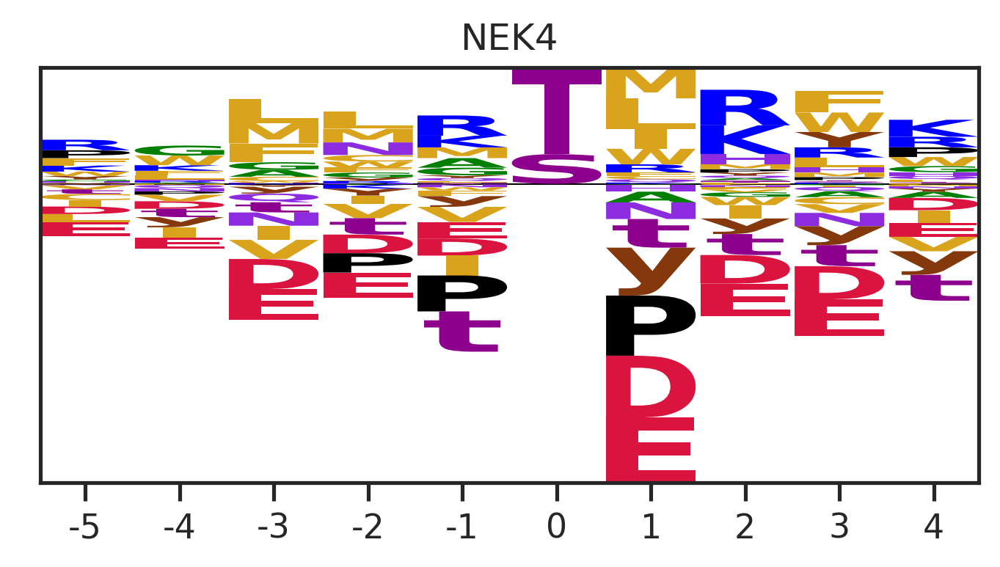

Logo of NEK4  from reversed label


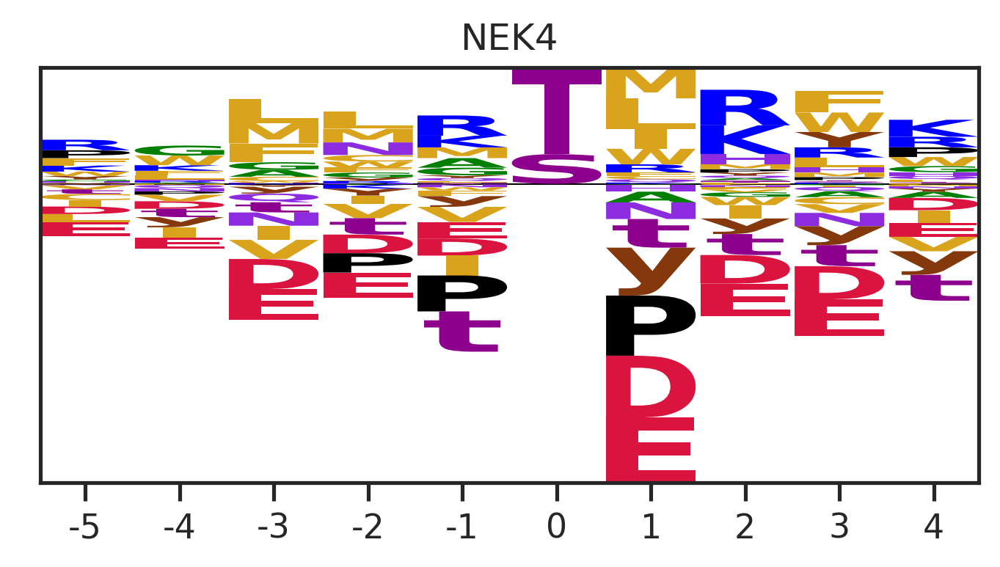

Logo of NEK4  based on prediction


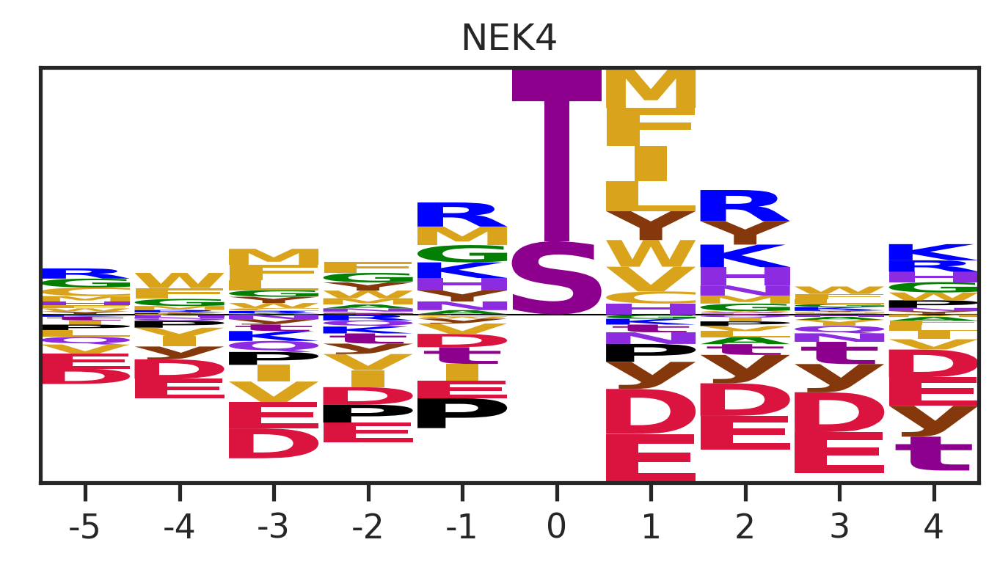

correlation


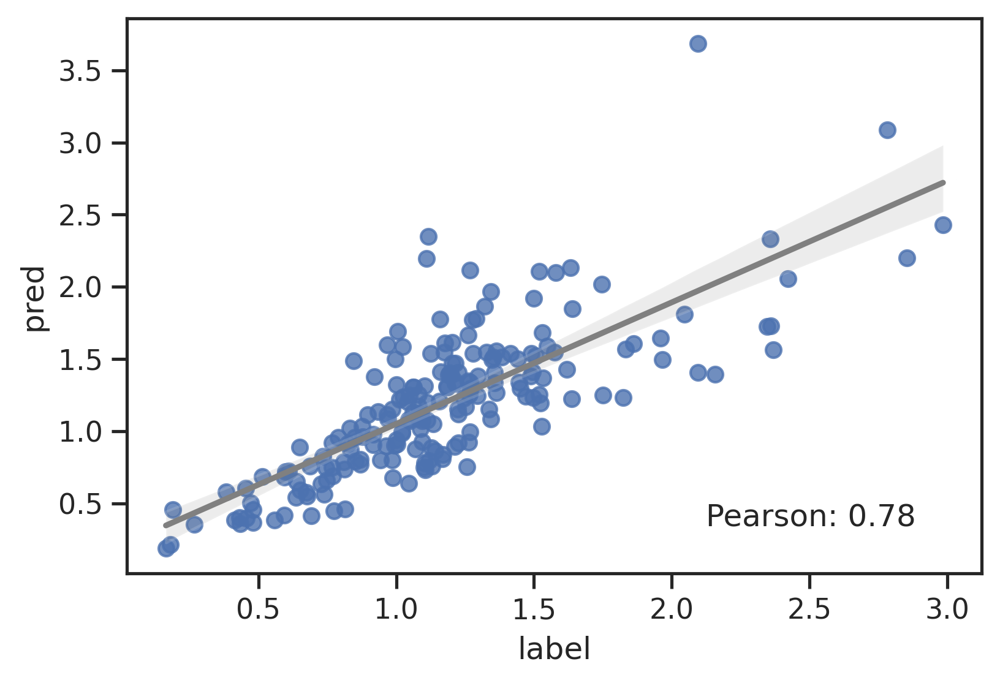

colored by aa


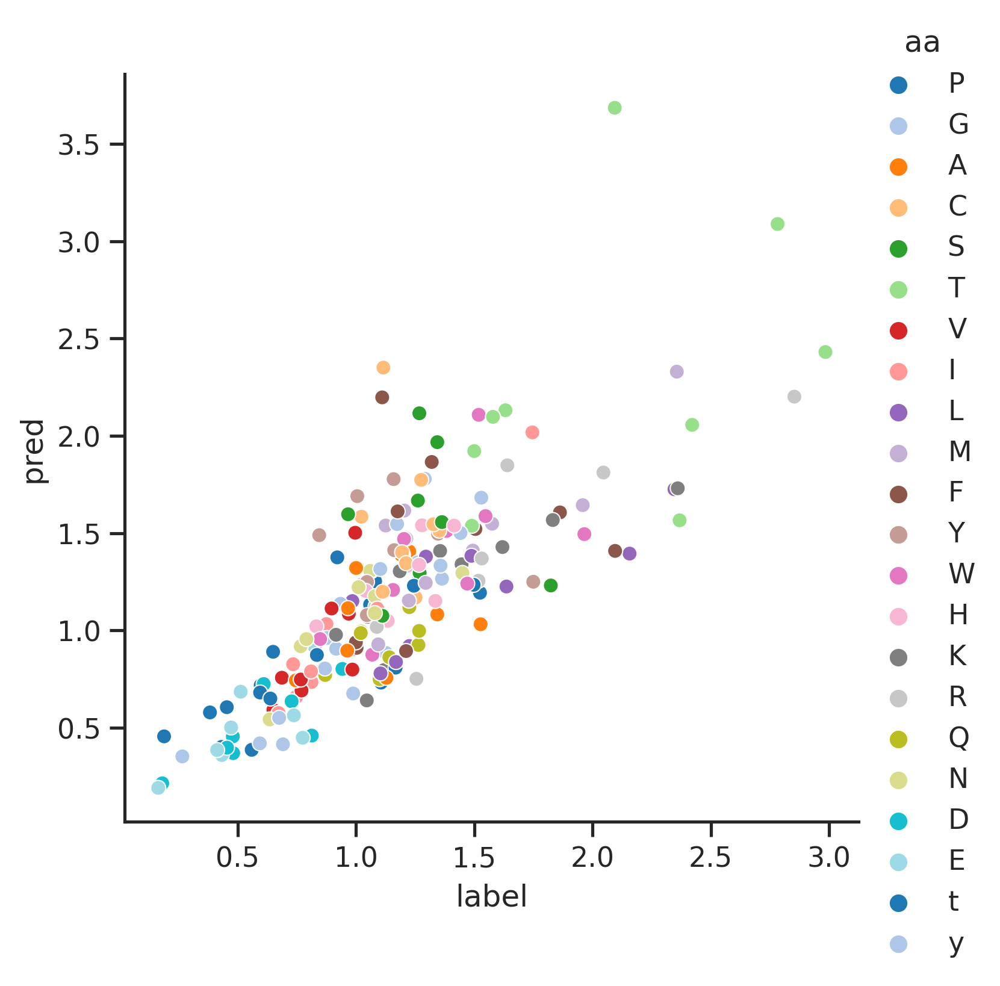

------DNAPK------
Logo of DNAPK  from raw dataset


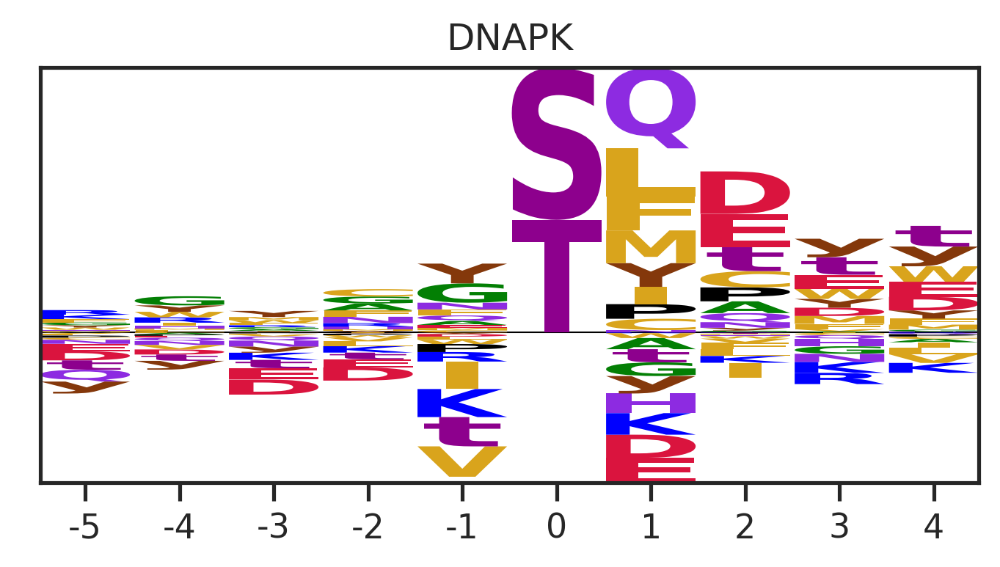

Logo of DNAPK  from reversed label


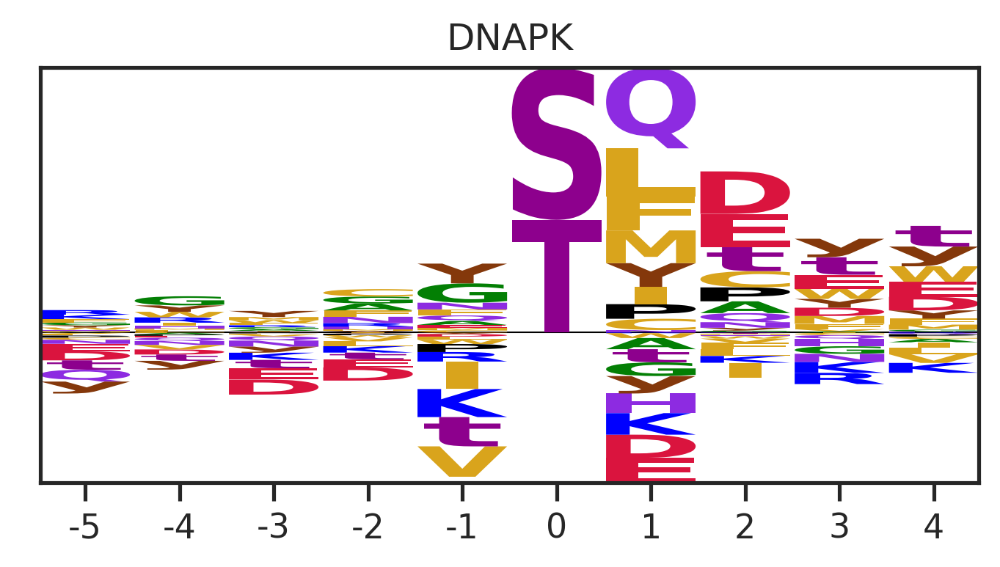

Logo of DNAPK  based on prediction


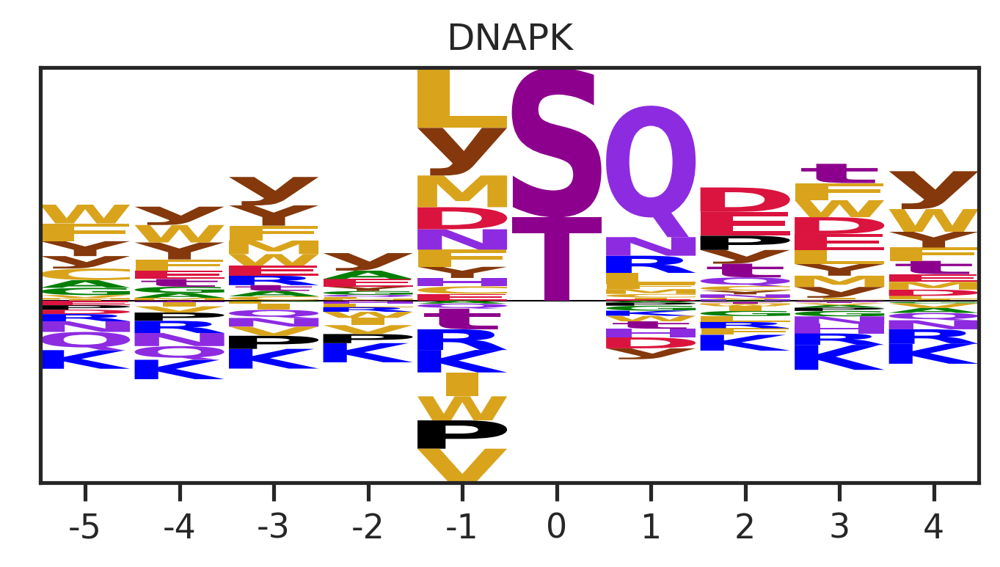

correlation


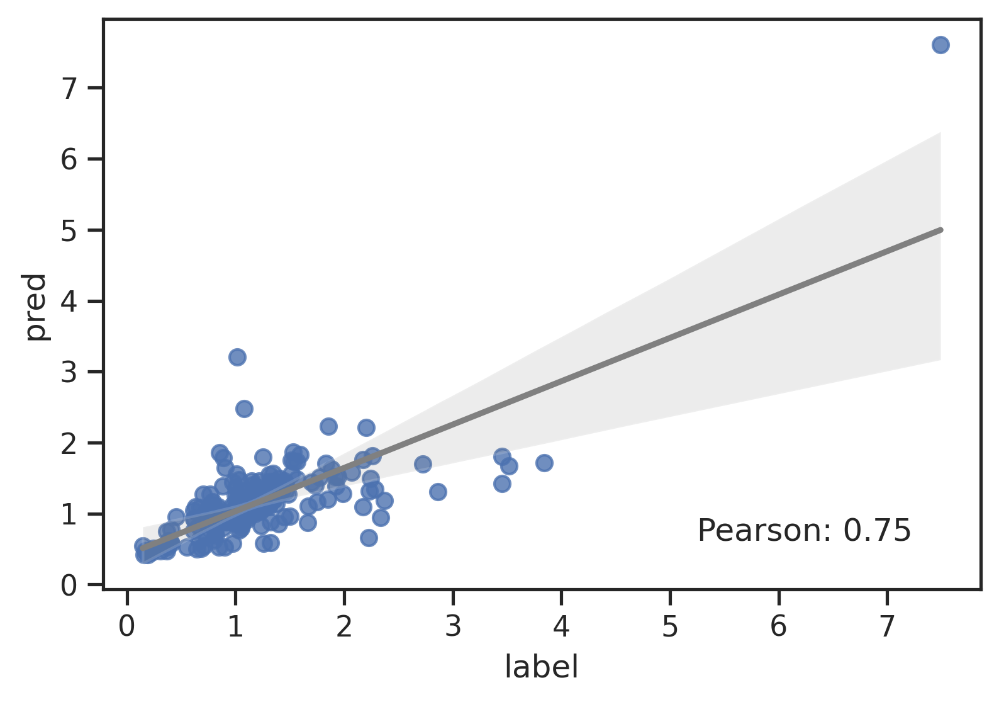

colored by aa


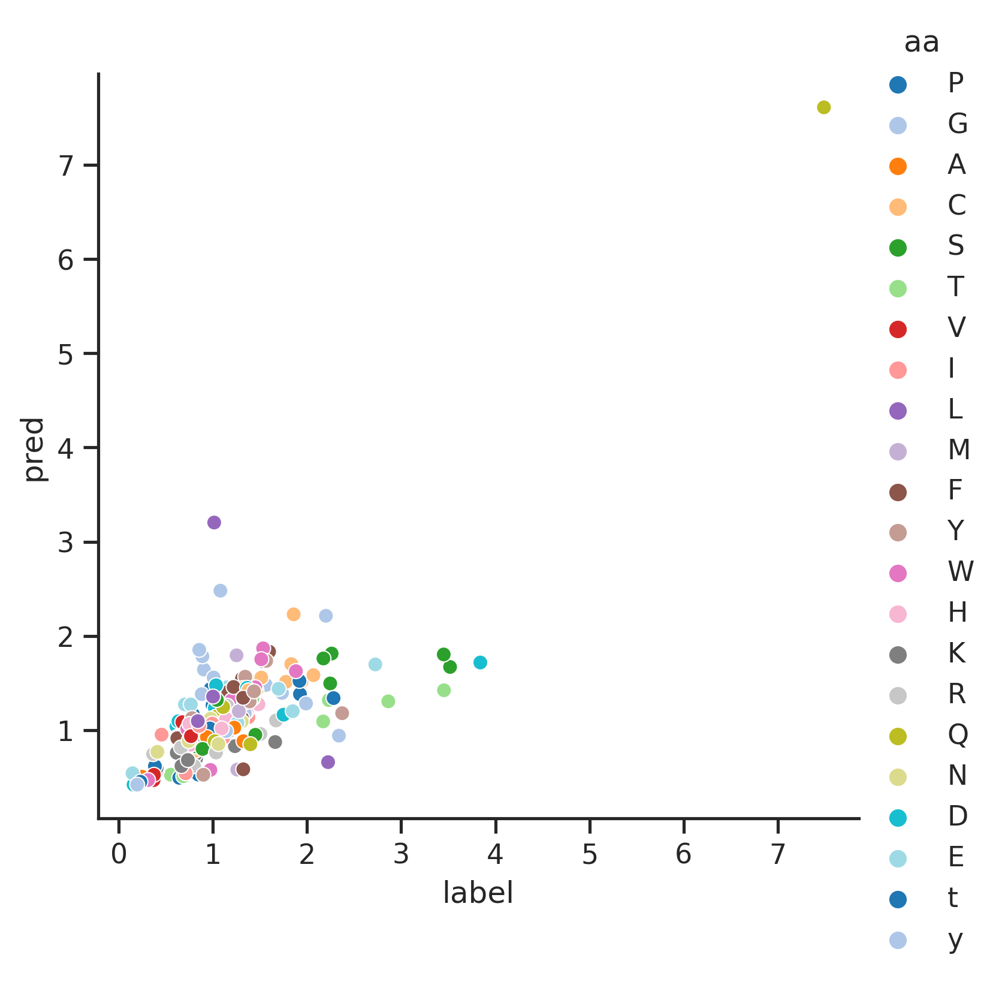

------PERK------
Logo of PERK  from raw dataset


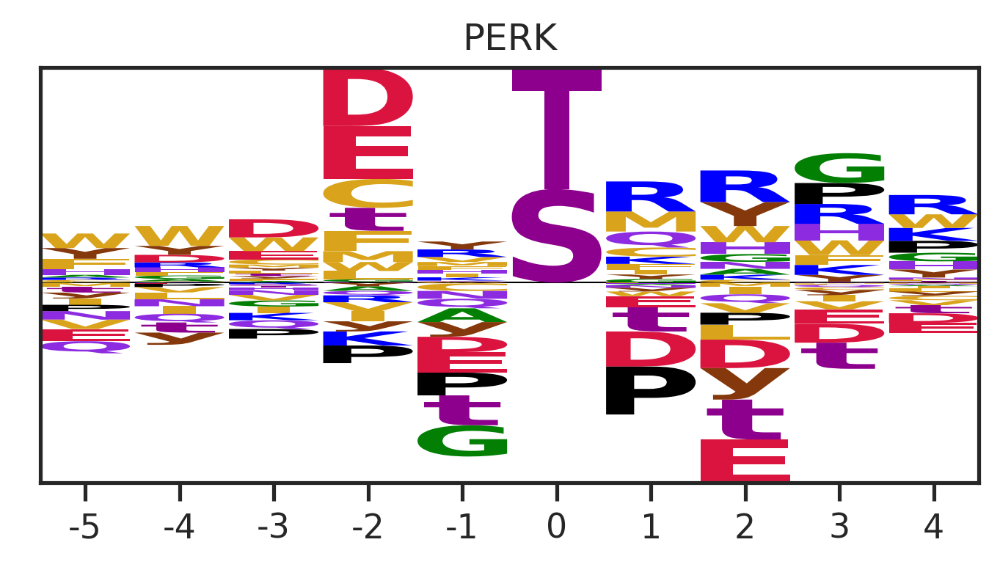

Logo of PERK  from reversed label


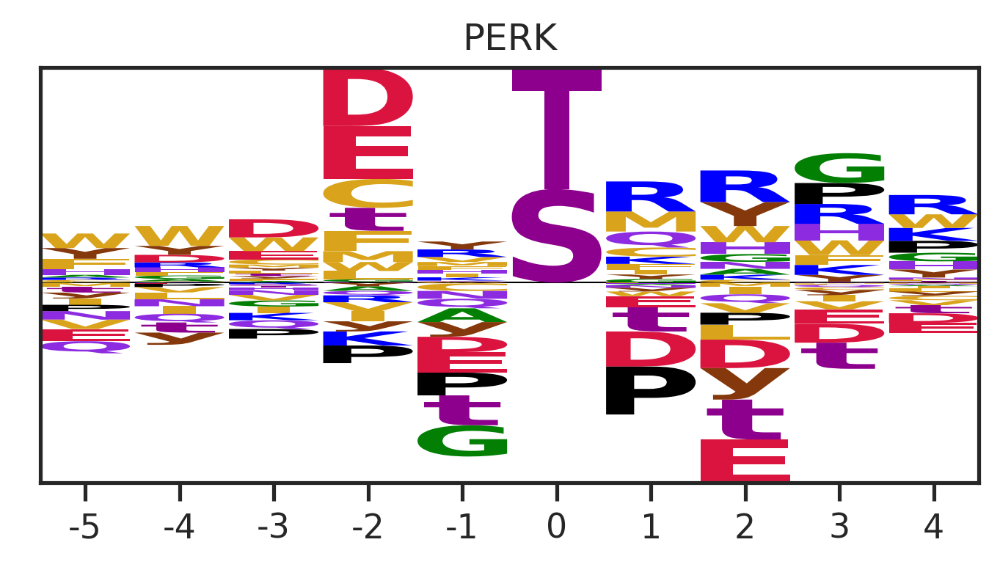

Logo of PERK  based on prediction


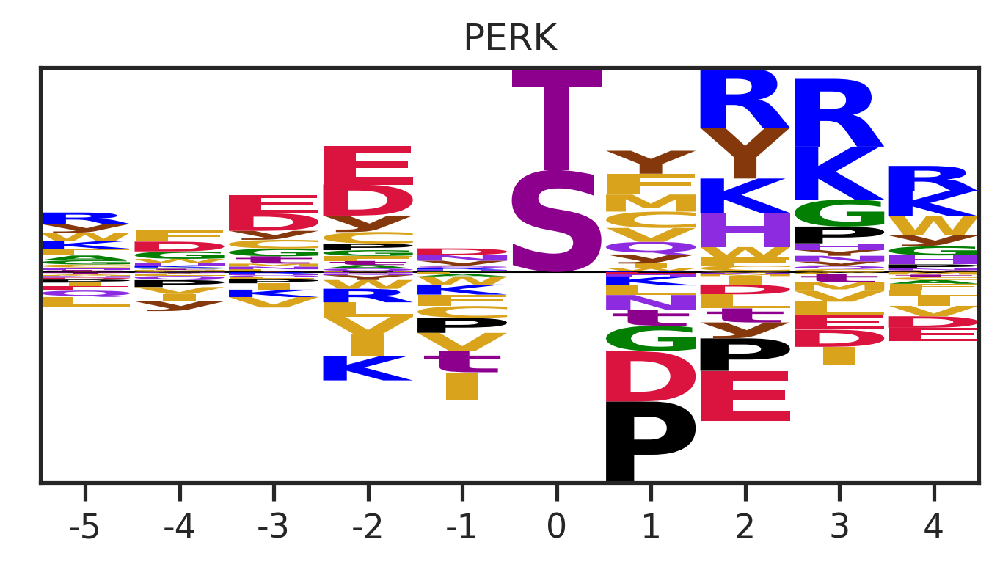

correlation


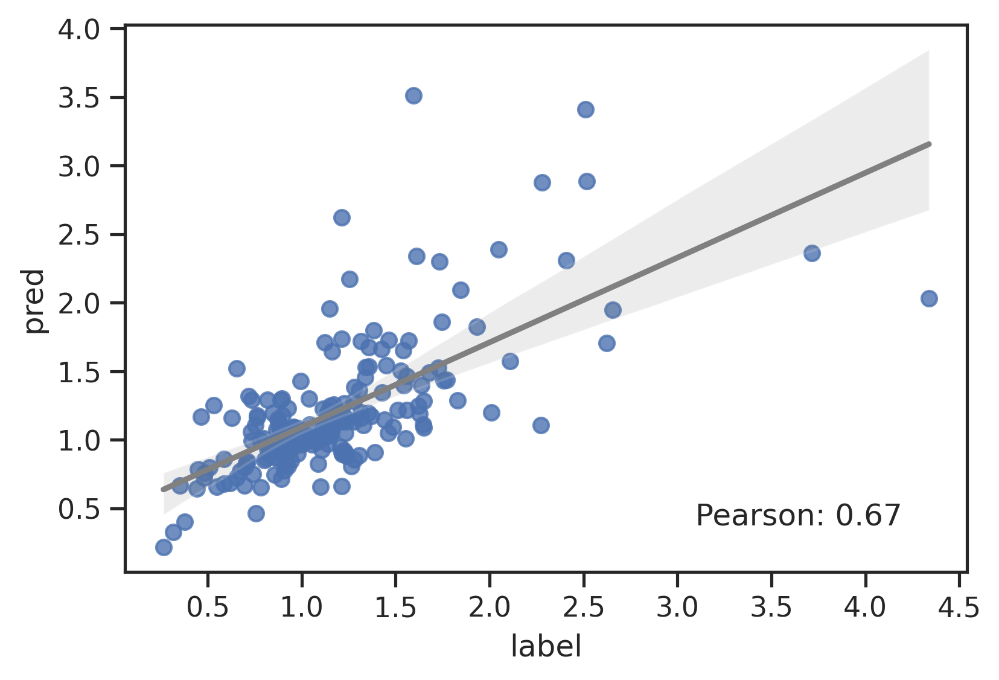

colored by aa


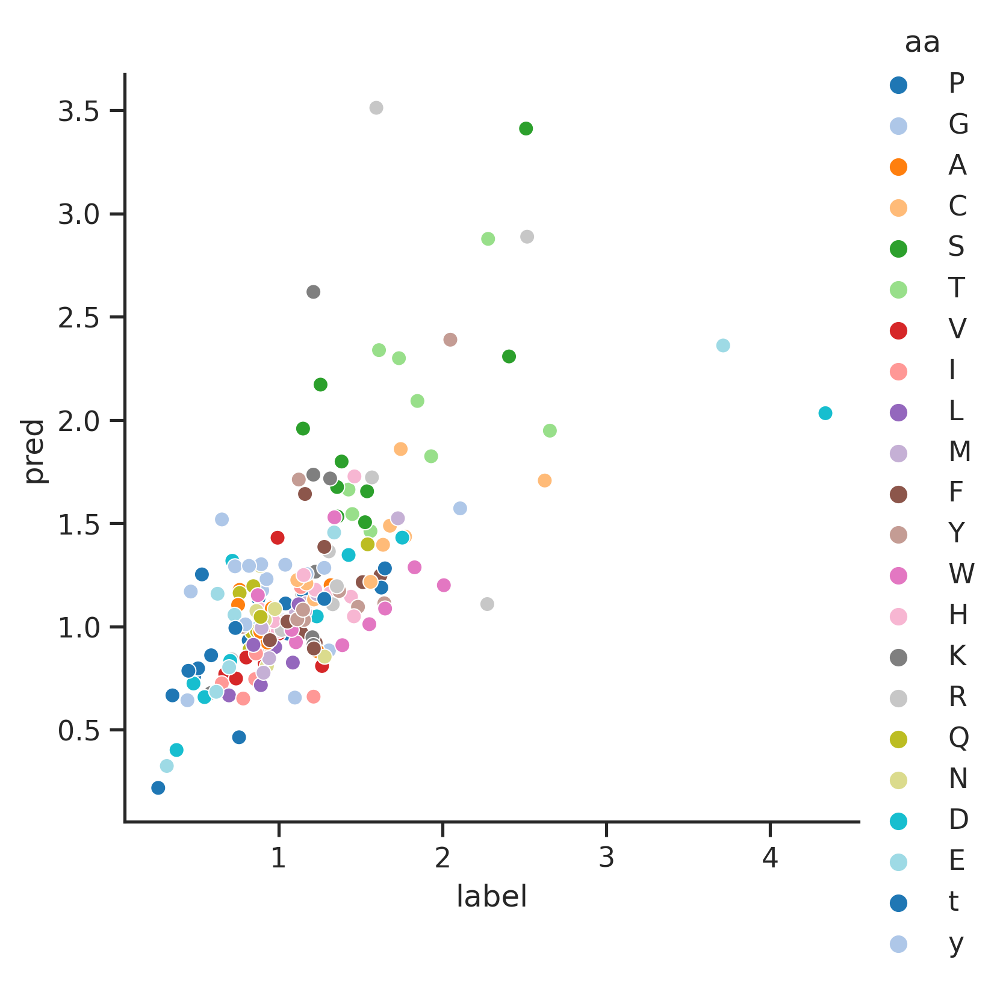

------RIPK3------
Logo of RIPK3  from raw dataset


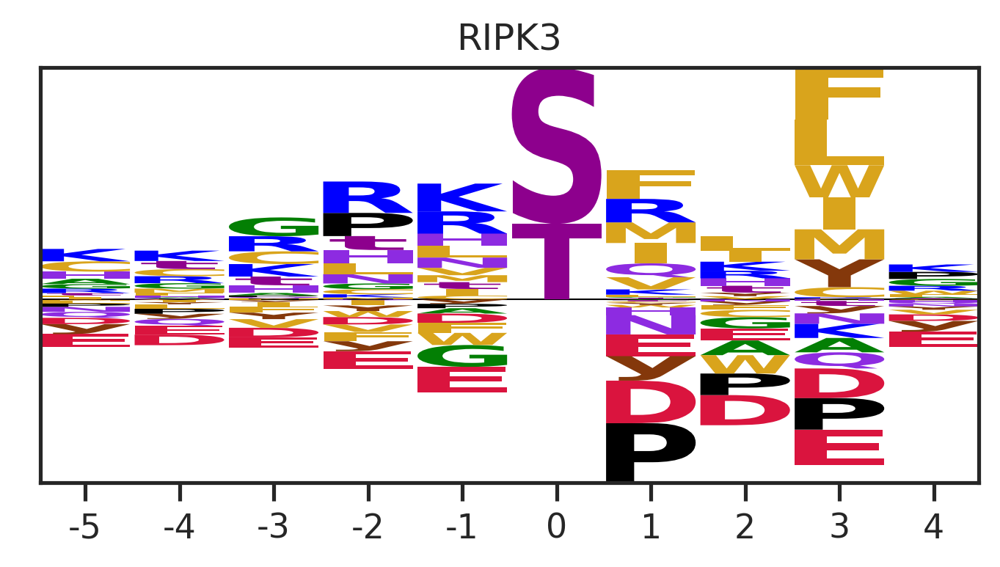

Logo of RIPK3  from reversed label


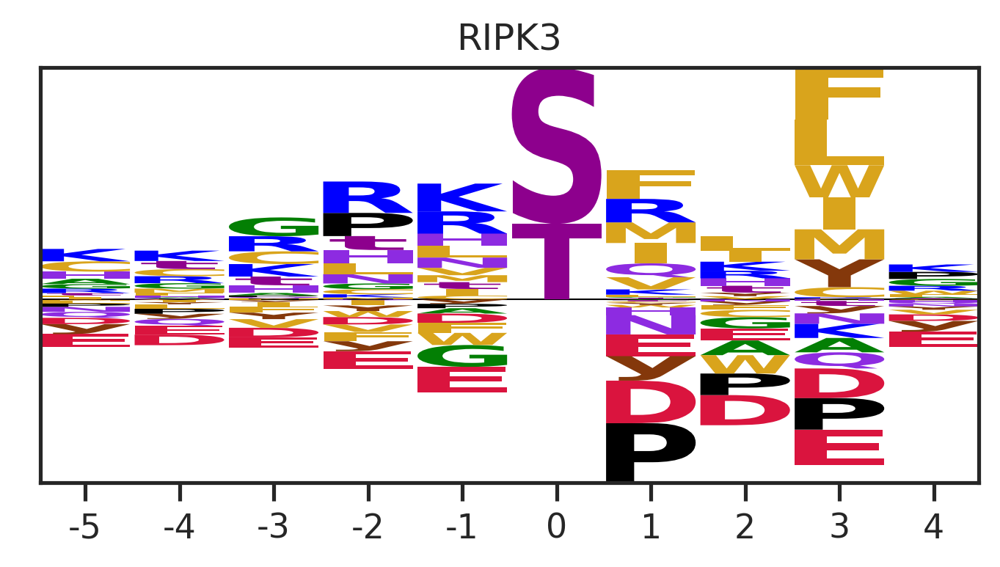

Logo of RIPK3  based on prediction


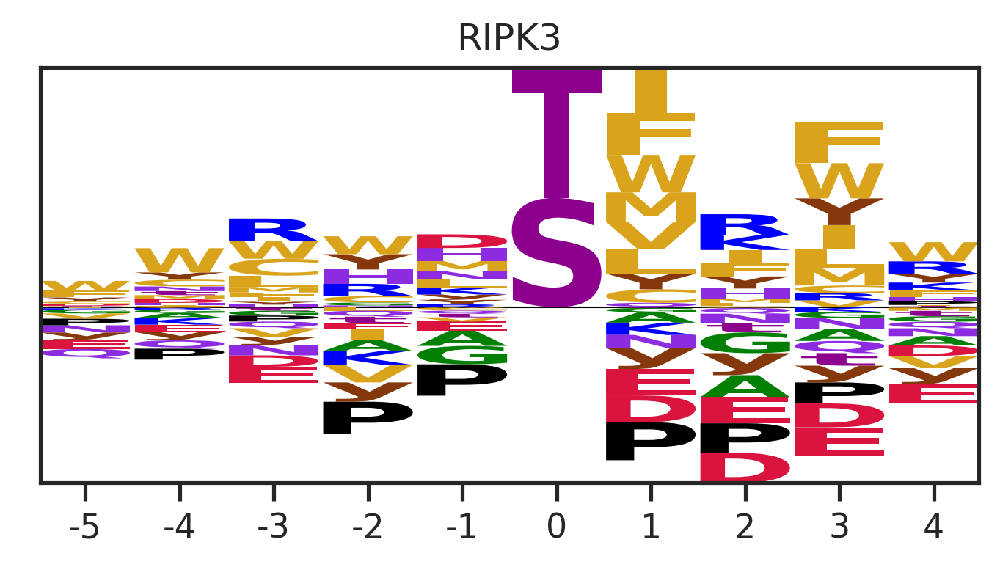

correlation


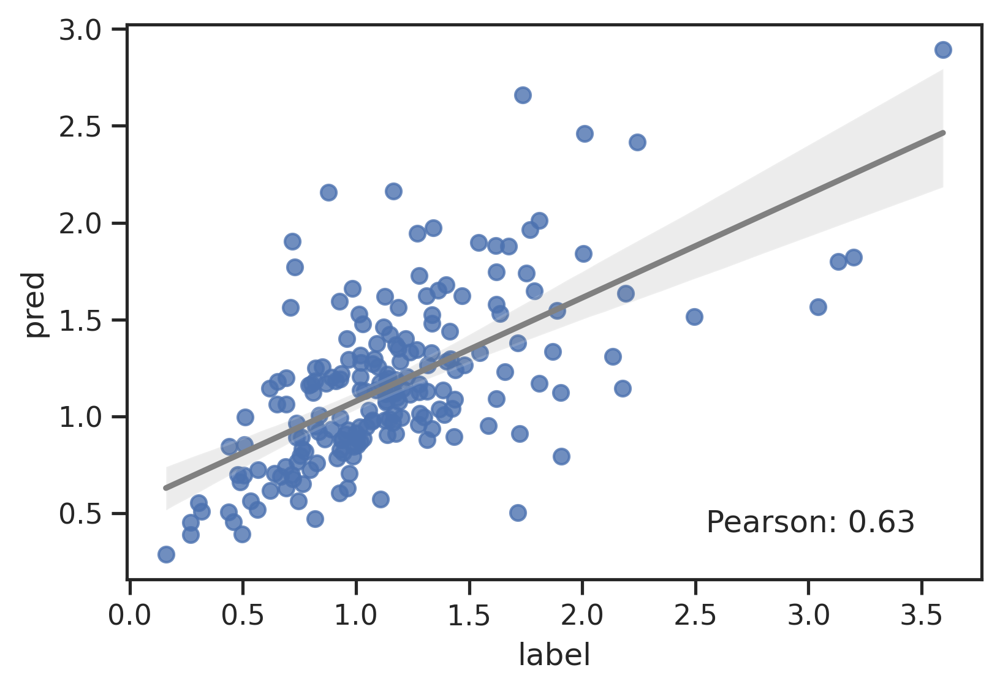

colored by aa


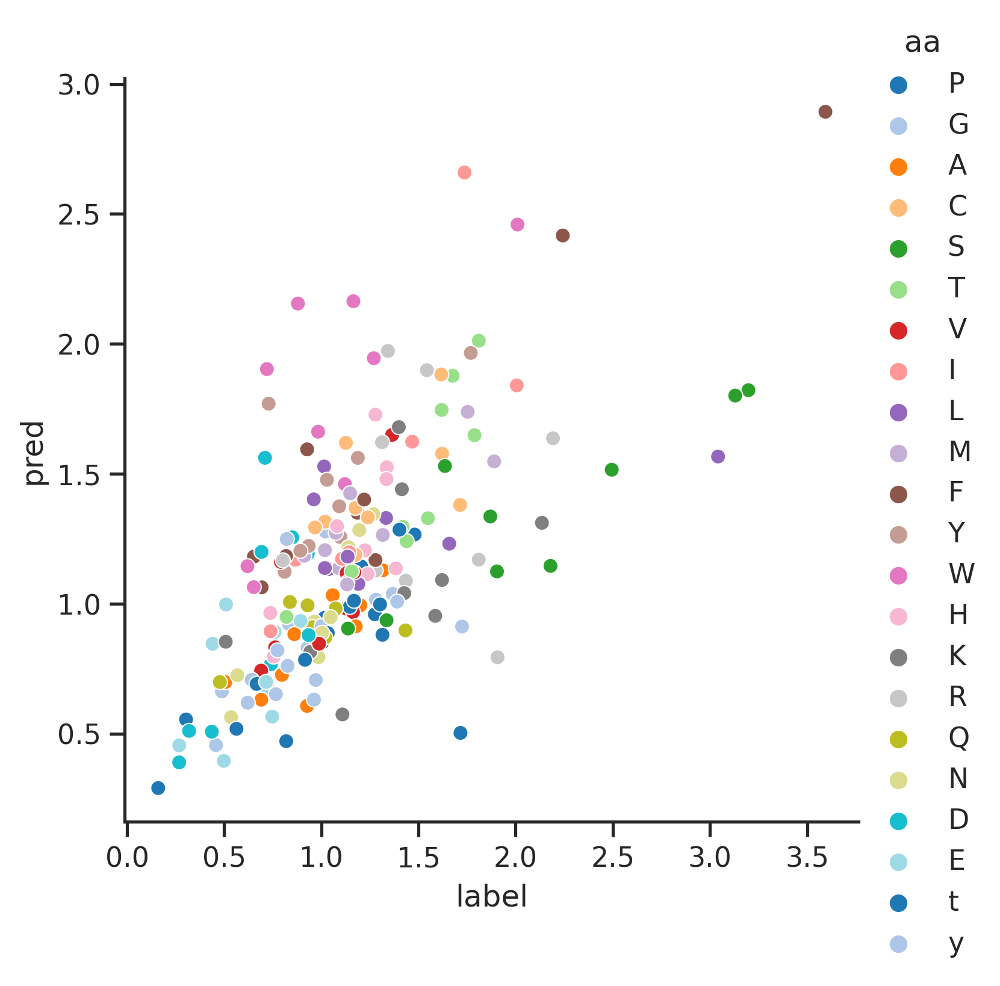

------MASTL------
Logo of MASTL  from raw dataset


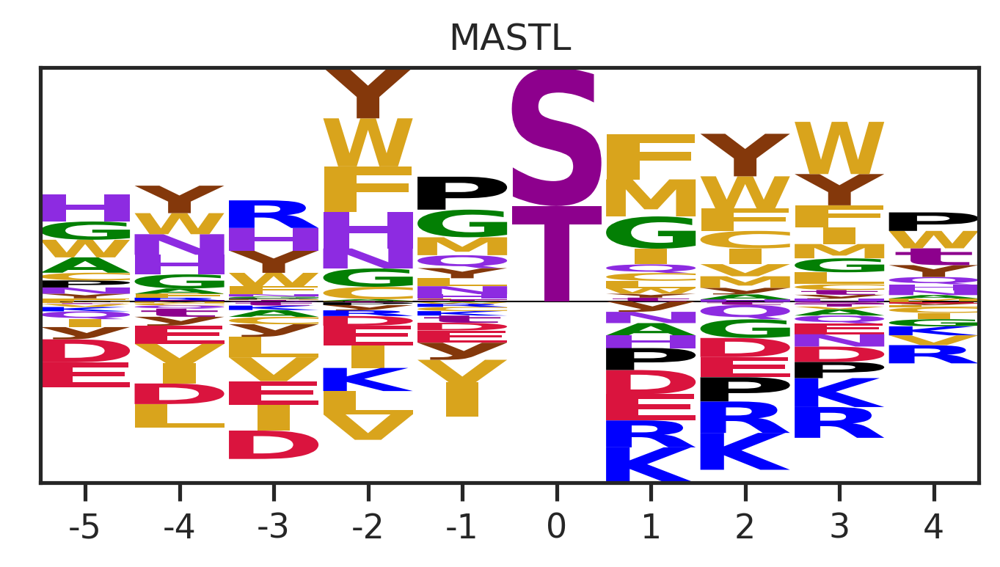

Logo of MASTL  from reversed label


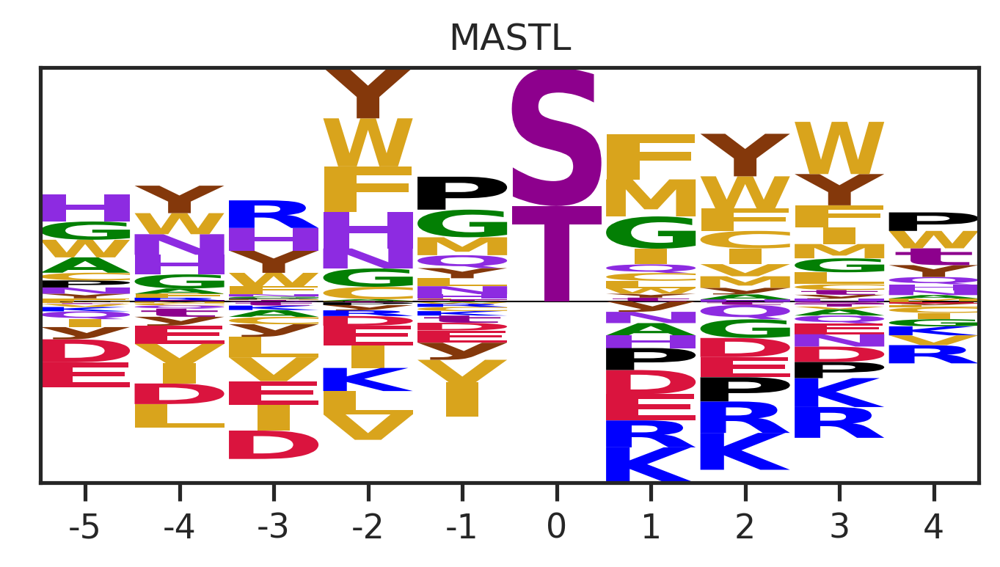

Logo of MASTL  based on prediction


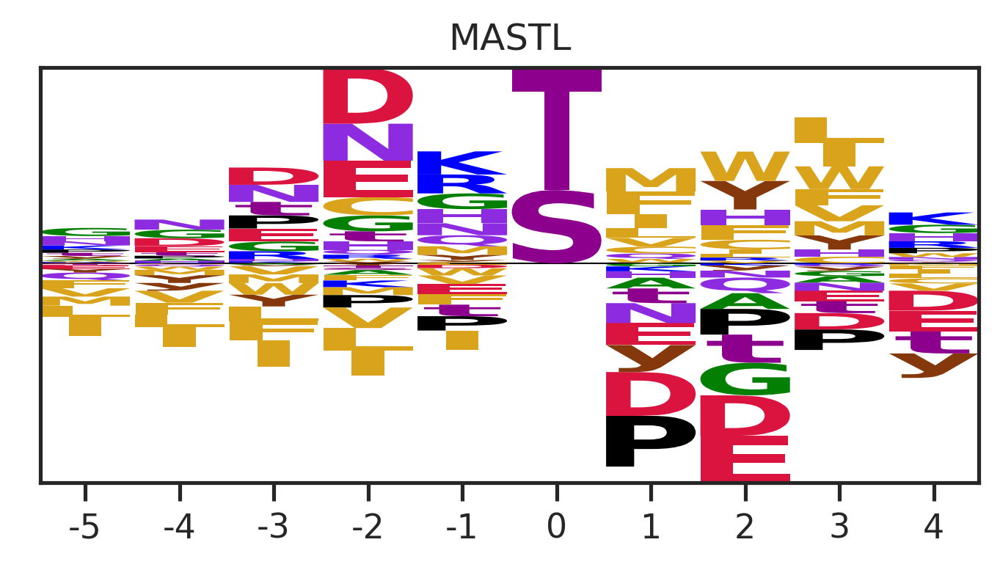

correlation


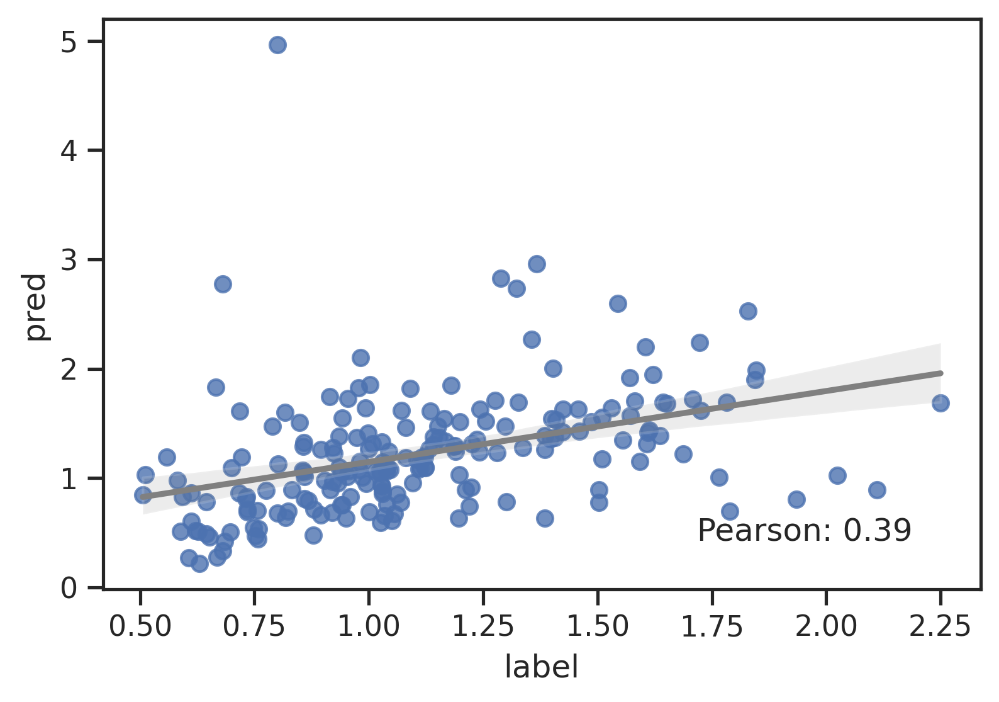

colored by aa


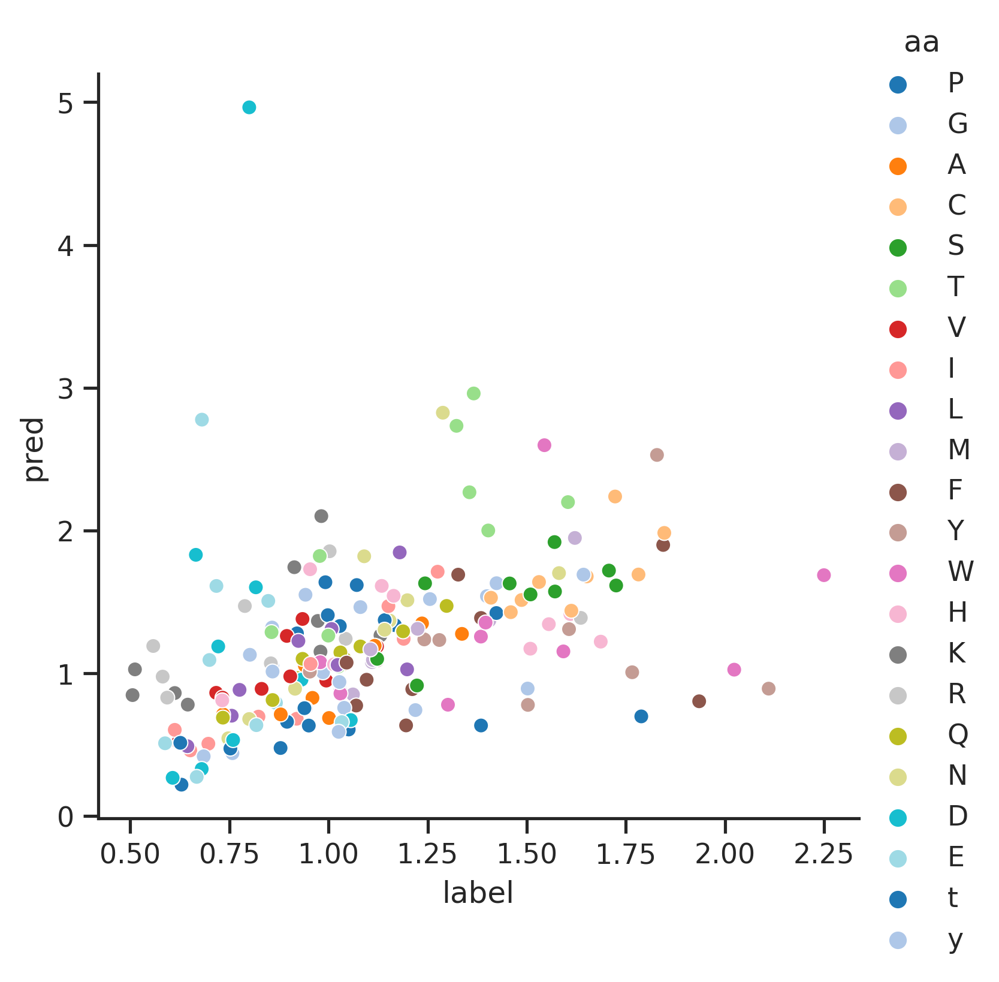

------TTBK2------
Logo of TTBK2  from raw dataset


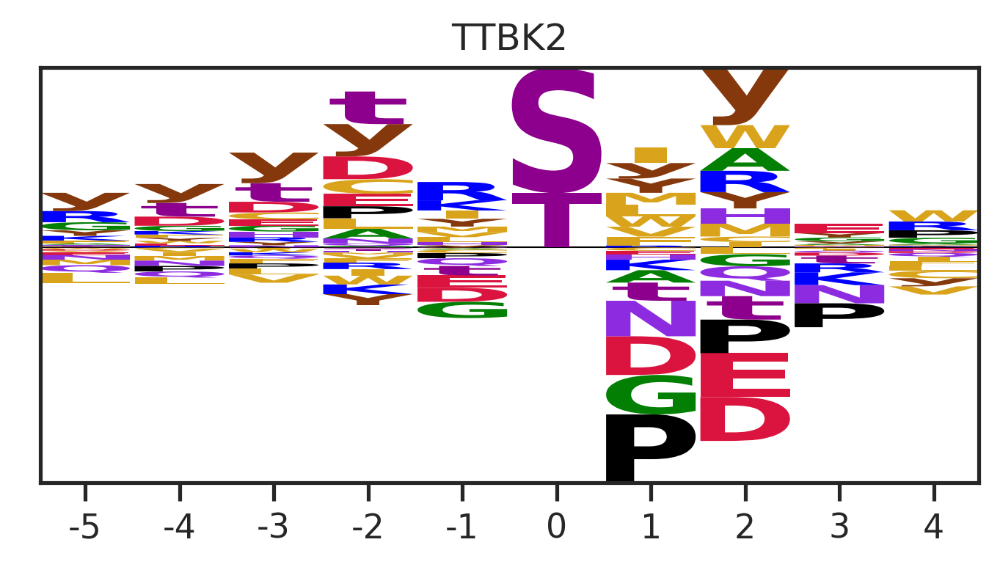

Logo of TTBK2  from reversed label


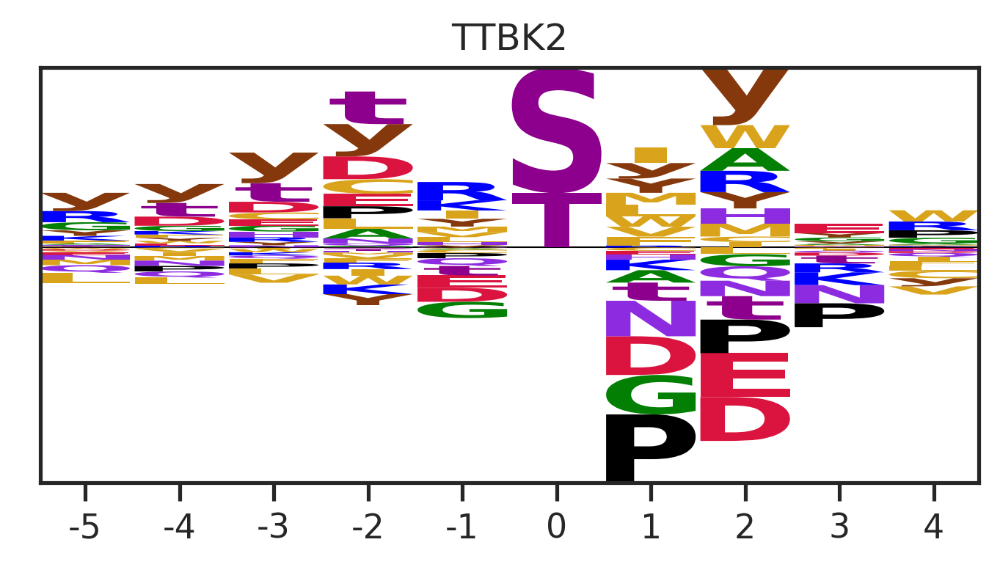

Logo of TTBK2  based on prediction


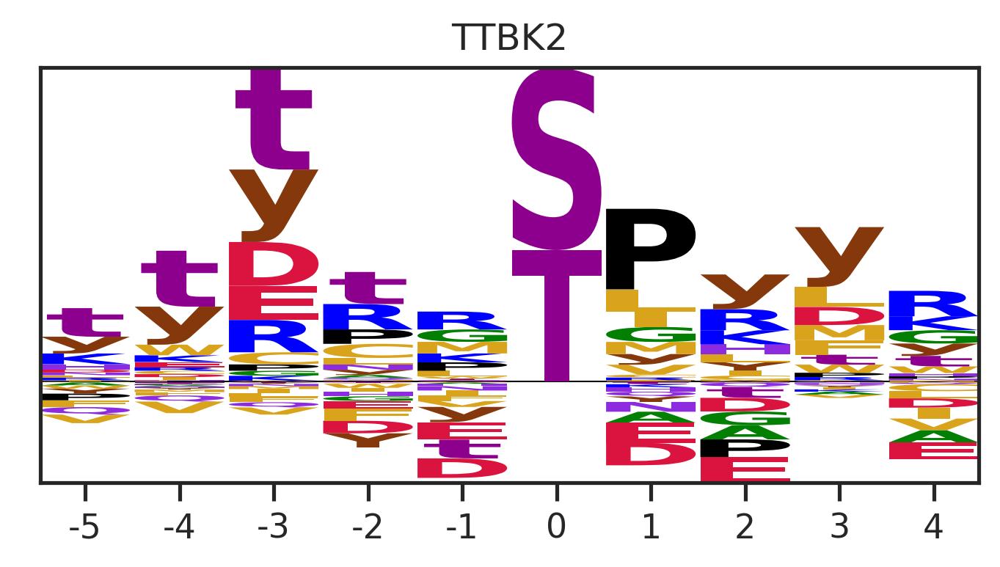

correlation


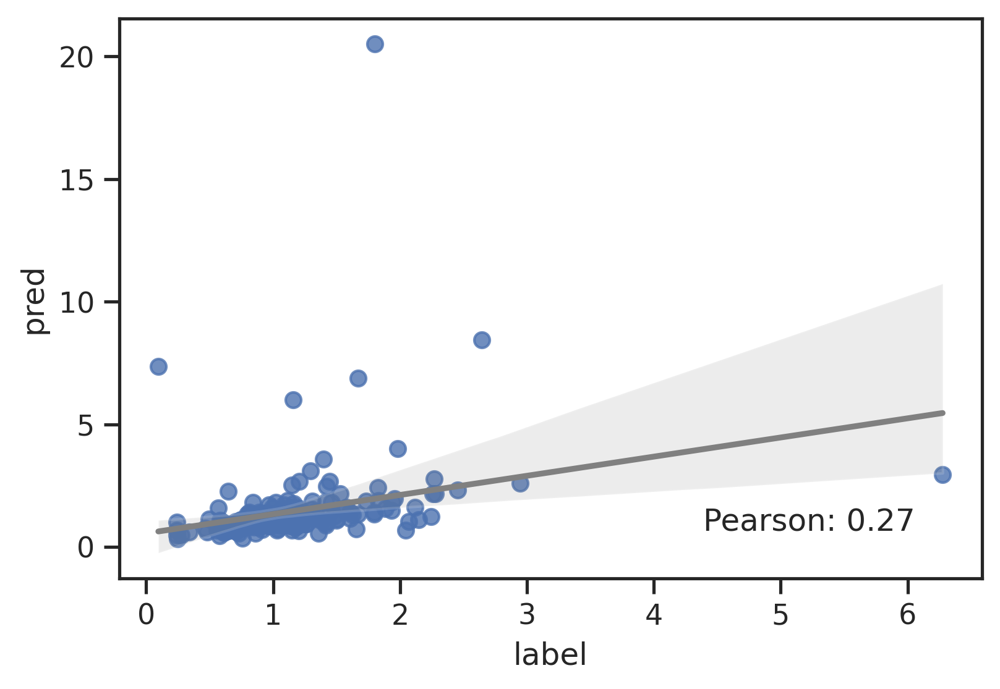

colored by aa


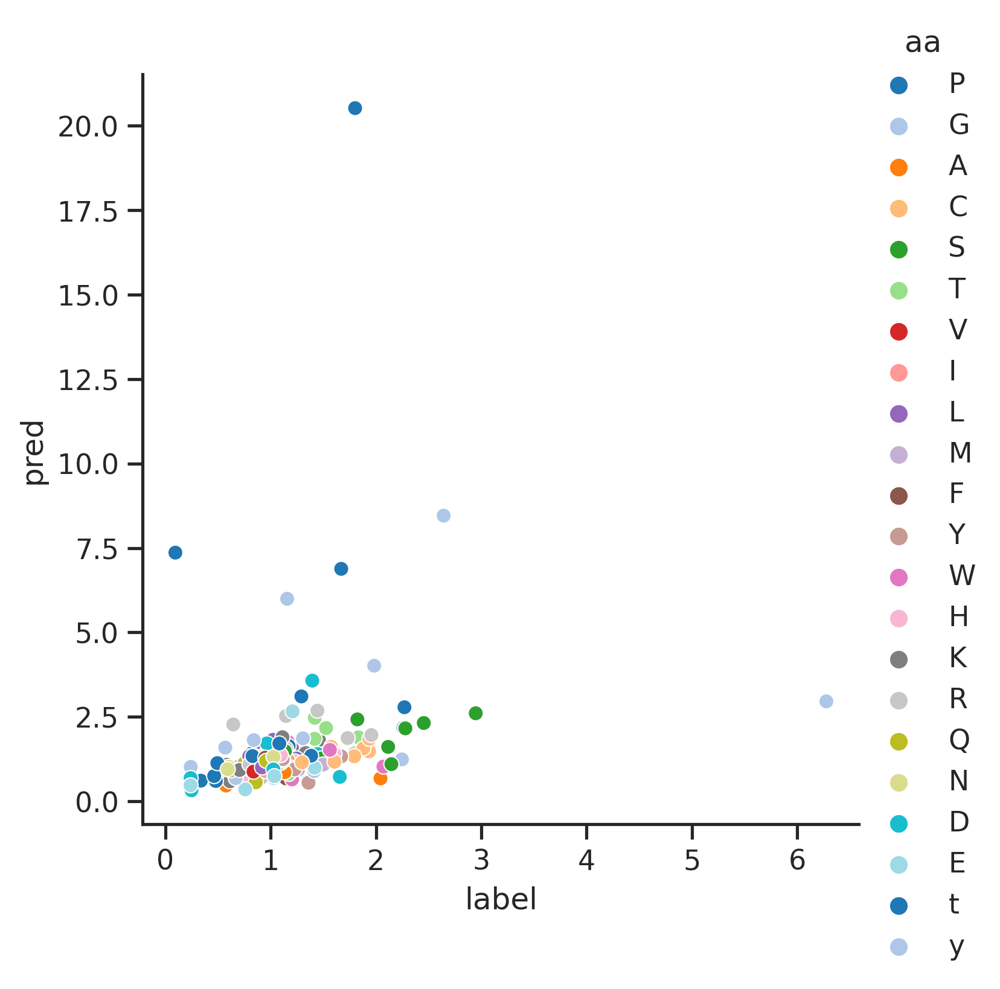

------NLK------
Logo of NLK  from raw dataset


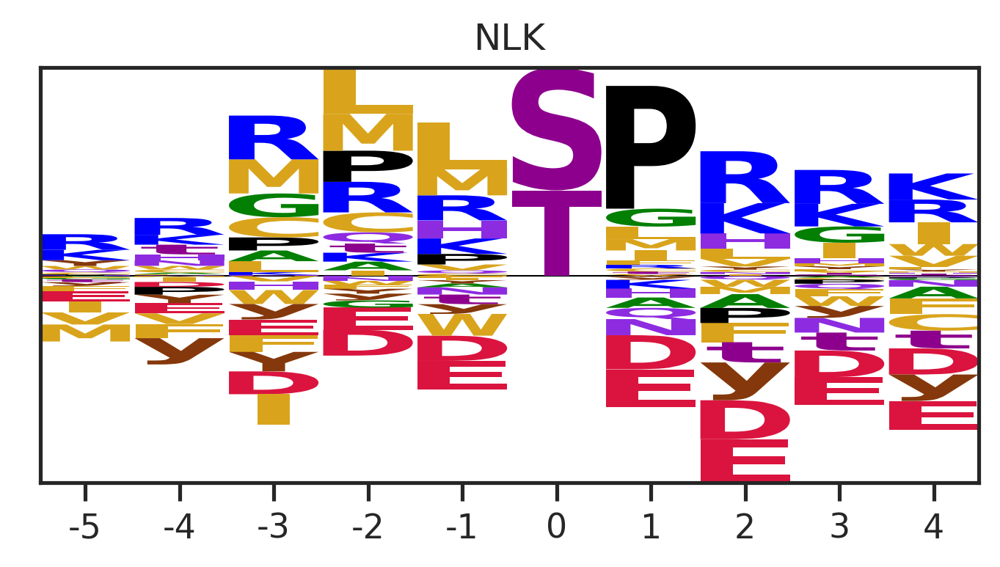

Logo of NLK  from reversed label


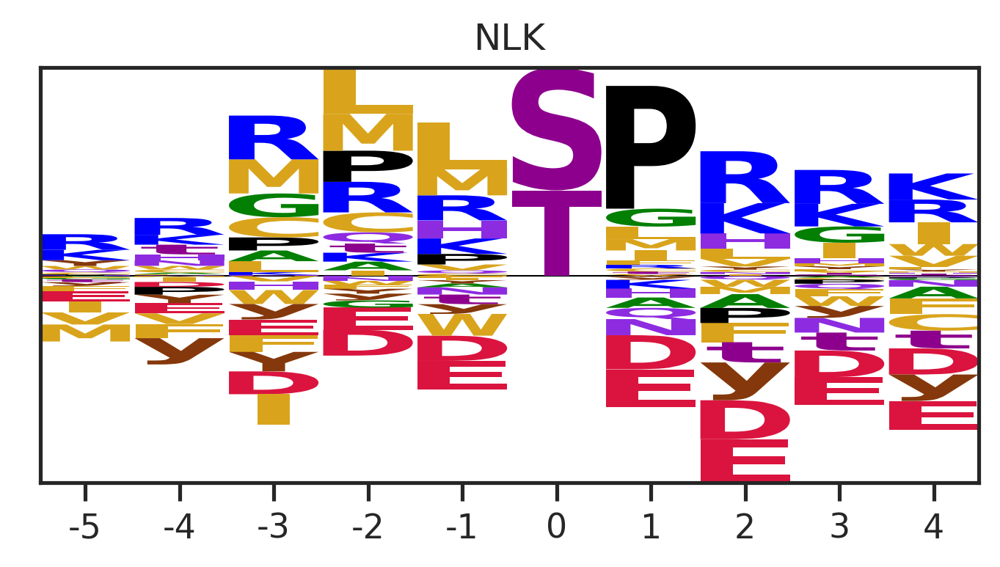

Logo of NLK  based on prediction


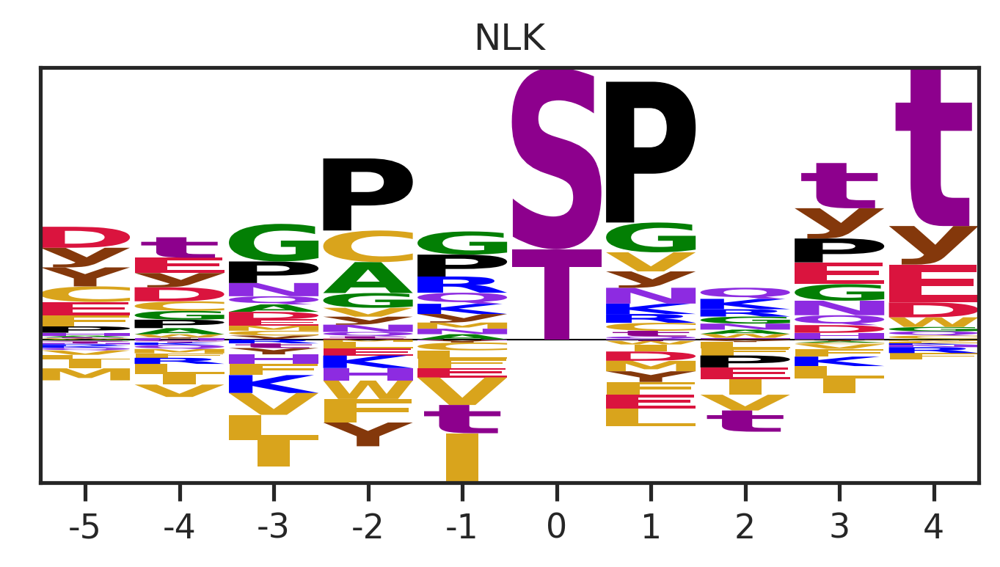

correlation


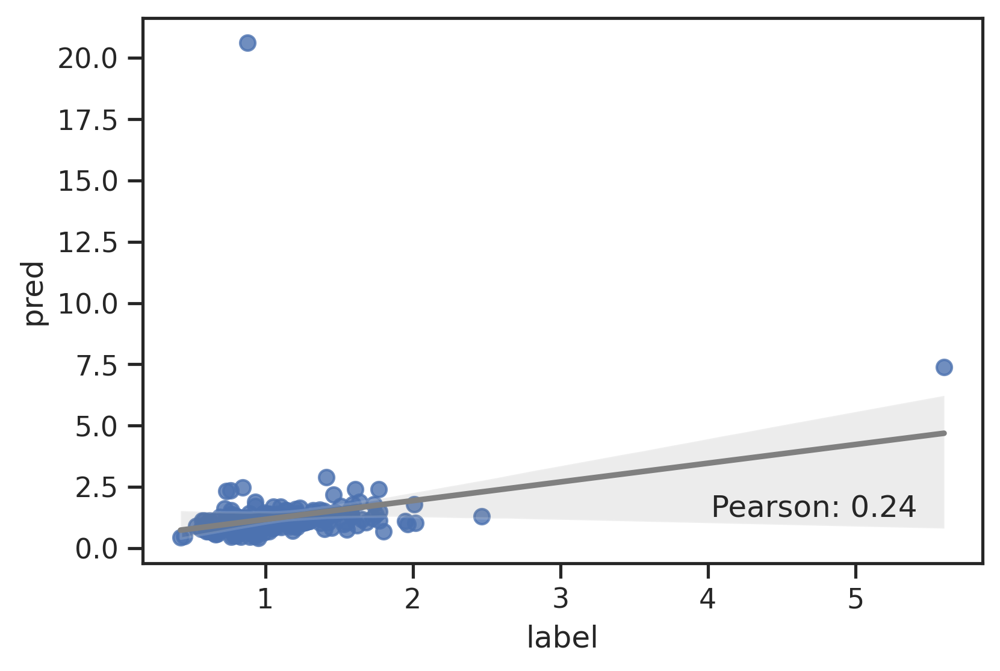

colored by aa


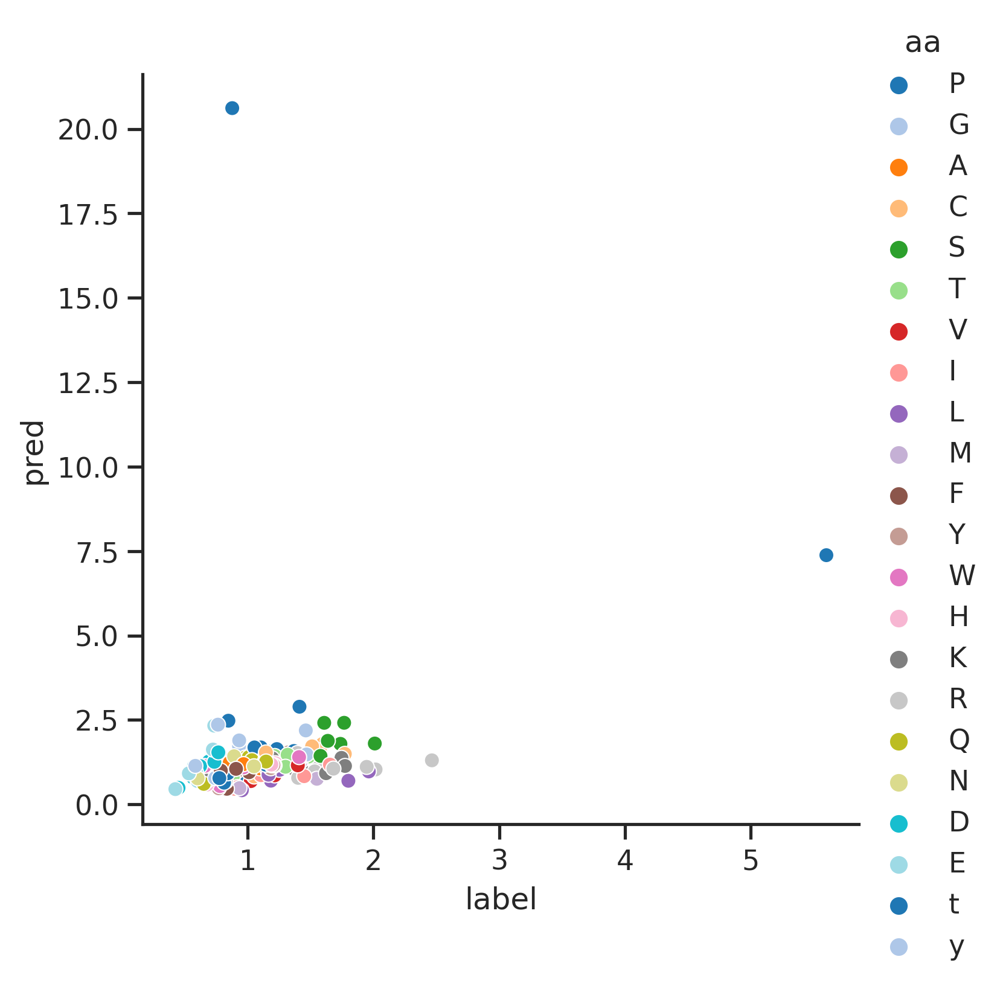

------CAMKK1------
Logo of CAMKK1  from raw dataset


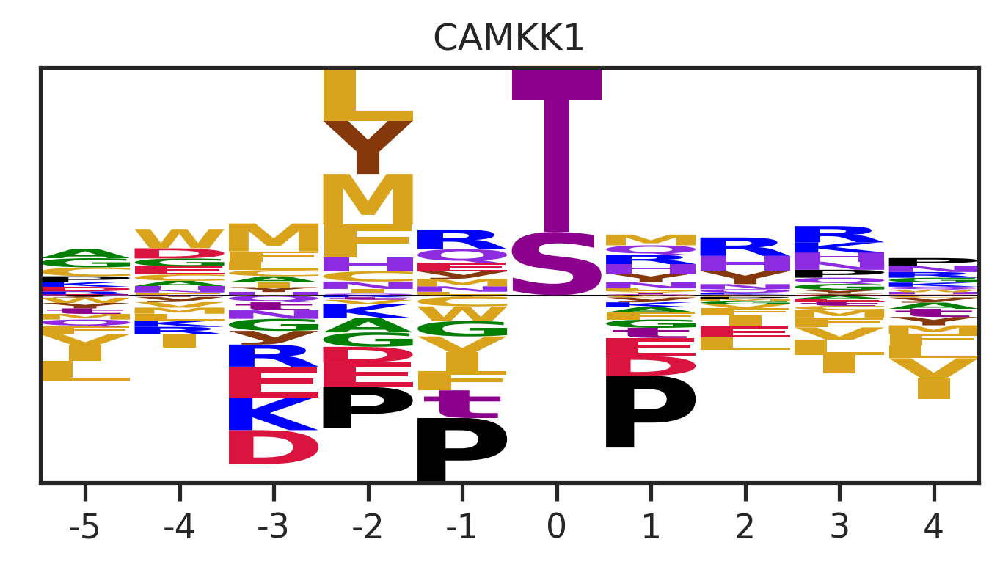

Logo of CAMKK1  from reversed label


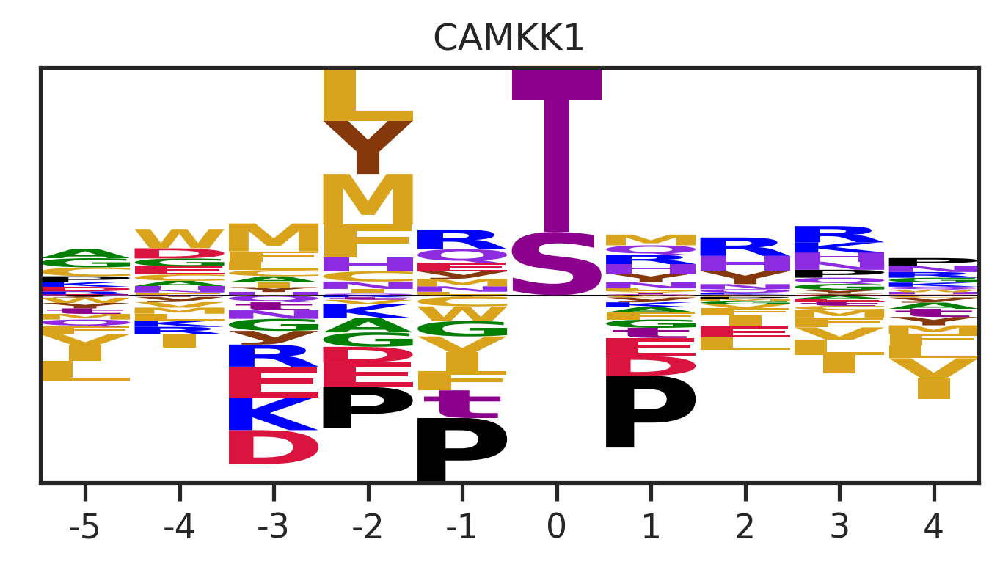

Logo of CAMKK1  based on prediction


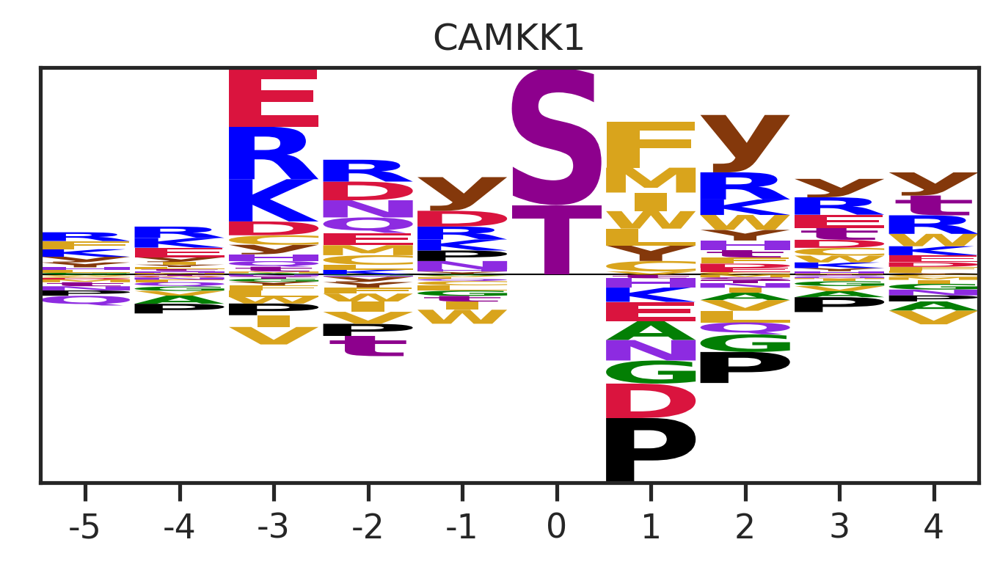

correlation


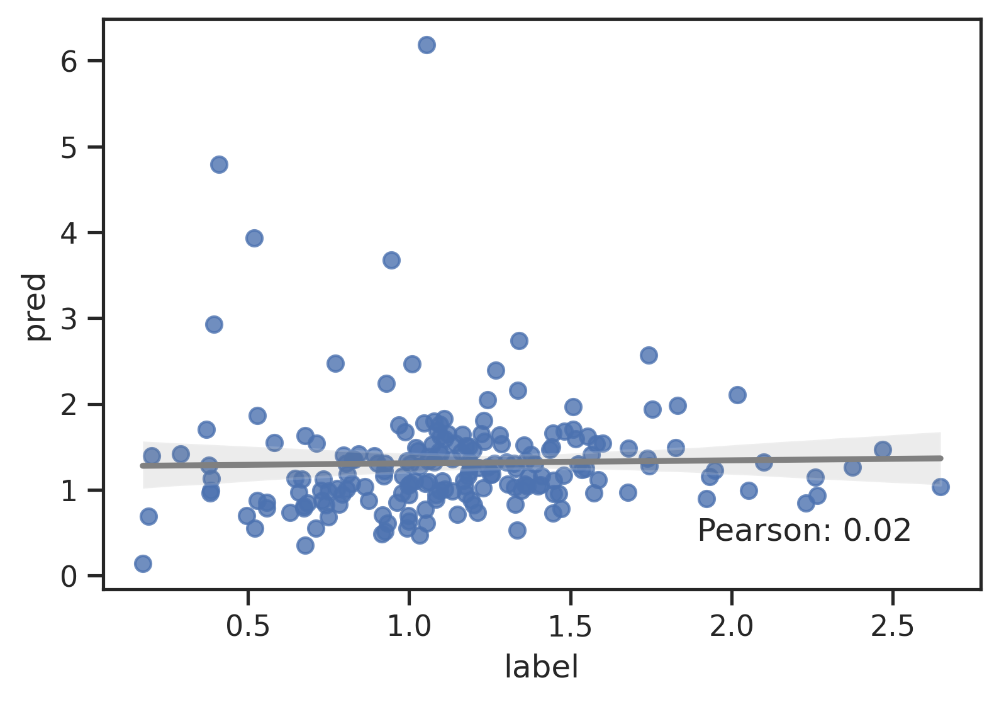

colored by aa


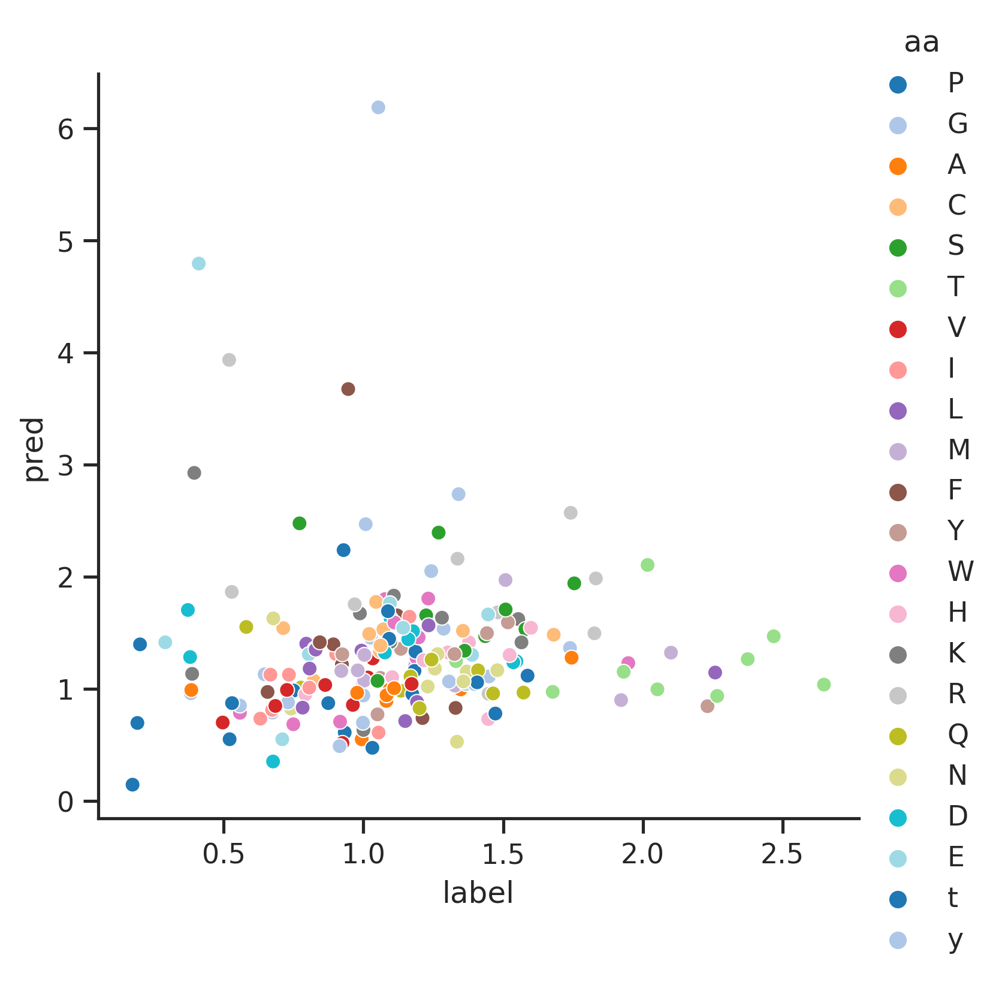

In [81]:
for k in max_group.kinase:
    print(f'------{k}------')
    kinase_report(pred2,k)

## Gaussian Process

slow, not recommend

In [ ]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import *

In [ ]:
# Create an instance of GaussianProcessRegressor model
kernel = RBF()  # Select the appropriate kernel for your problem
model = GaussianProcessRegressor(kernel=kernel)
pred = train_ML(model,X_train, X_test, y_train, y_test)

In [ ]:
kernel = DotProduct() + WhiteKernel()
model = GaussianProcessRegressor(kernel=kernel)
pred = train_ML(model,X_train, X_test, y_train, y_test)

## Decision Trees

In [77]:
from sklearn.tree import DecisionTreeRegressor

In [92]:
model = DecisionTreeRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

DecisionTreeRegressor()
rmse is 1.2406
Spearman correlation coefficient: 0.4609
Pearson correlation coefficient: 0.4291 


In [93]:
model = DecisionTreeRegressor(max_depth=10)
pred = train_ML(model,X_train, X_test, y_train, y_test)

DecisionTreeRegressor(max_depth=10)
rmse is 1.0152
Spearman correlation coefficient: 0.4476
Pearson correlation coefficient: 0.4543 


## Ensemble methods

### LightGBM

In [205]:
!pip install lightgbm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 49.7 MB/s eta 0:00:0000:01


In [206]:
from lightgbm import LGBMRegressor

In [217]:
model = LGBMRegressor(num_leaves = 500)
pred = train_ML(model,X_train, X_test, y_train, y_test)

LGBMRegressor(num_leaves=500)
rmse is 0.8224
Spearman correlation coefficient: 0.5993
Pearson correlation coefficient: 0.6395 


### XGBRegressor

In [79]:
from xgboost import XGBRegressor

In [118]:
for i in range(5,16):
    print(f'max_depth is {i}')
    model = XGBRegressor(max_depth = i)
    pred = train_ML(model,X_train, X_test, y_train, y_test)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)
rmse is 0.9044
Spearman correlation coefficient: 0.4900
Pearson correlation coefficient: 0.5328 
XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
          

In [187]:
model = XGBRegressor(max_depth = 10)
pred = train_ML(model,X_train, X_test, y_train, y_test)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=10, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)
rmse is 0.8379
Spearman correlation coefficient: 0.5759
Pearson correlation coefficient: 0.6306 


In [188]:
imp = pd.DataFrame(index=model.get_booster().get_score(importance_type='gain').keys())

imp['gain'] = model.get_booster().get_score(importance_type='gain').values()

imp['weight'] = model.get_booster().get_score(importance_type='weight').values()

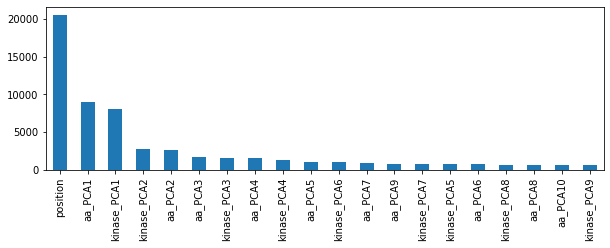

In [189]:
imp.weight.sort_values(ascending=False)[:20].plot.bar(figsize=(10,3));

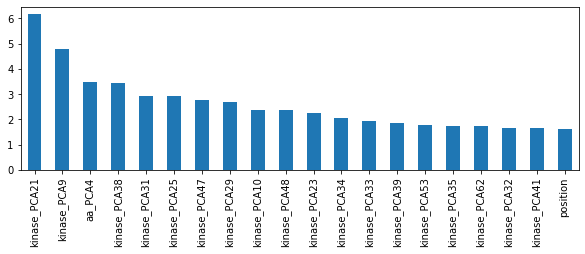

In [190]:
imp.gain.sort_values(ascending=False)[:20].plot.bar(figsize=(10,3));

get pearson

In [55]:
pred2 = pd.concat([pred,
           df[['kinase','substrate','position','aa']].loc[pred.index],
           info.loc[pred.index].drop(columns='kinase')
          ],axis=1)

pearson = pred2.groupby('kinase')[['target','pred']].corr().pred.loc[::2].reset_index()

# Get the absolute value of pearson correlation, and name the column pearson
pearson['pearson'] = abs(pearson.pred)

pearson = pearson.merge(kinase_info, 'left')

print(f'The average pearson value across kinases in test set is : {pearson.pearson.mean().round(4)}')

The average pearson value across kinases in test set is : 0.6025


Get AUC-ROC

In [61]:
from sklearn.metrics import roc_auc_score

In [113]:
def auc(r, thr=95):
    target_threshold = np.percentile(r.target, thr)
    pred_threshold = np.percentile(r.pred, thr)
    
    target_binary = np.where(r.target >= target_threshold, 1, 0)
    pred_binary = np.where(r.pred >= pred_threshold, 1, 0)
    
    auc_roc = roc_auc_score(target_binary, pred_binary)
    
    return auc_roc

In [114]:
auc_df = pred2.groupby('kinase').apply(auc).reset_index(name = 'auc')

In [115]:
auc_df = auc_df.merge(kinase_info, 'left')

In [116]:
auc_df.auc.mean()

0.6909487268922219

In [117]:
auc_df.sort_values('auc')

,kinase,auc,Family,category,category_big
29,MASTL,0.473404,AGC,assorted,assorted
25,IRAK4,0.473404,TKL,RIPK/WNK,RIPK/WNK
51,RIPK3,0.473404,TKL,RIPK/WNK,RIPK/WNK
7,CAMKK1,0.473404,Other,LKB/CAMKK,LKB/CAMKK
48,PKR,0.473404,Other,ALPHA/MLK,ALPHA/MLK
...,...,...,...,...,...
45,PKCA,0.842021,AGC,PKC,PKC
13,CK1D,0.894681,CK1,CK1,acidophilic
1,AKT3,0.894681,AGC,AKT/ROCK,basophilic
36,MYO3A,0.947340,STE,MAP4K,MAP4K


### RandomForestRegressor

In [ ]:
model.fit(X_train, y_train.values.ravel())

In [94]:
model = RandomForestRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

KeyboardInterrupt: 

In [22]:
model = RandomForestRegressor(n_estimators=50)
pred = train_ML(model,X_train, X_test, y_train, y_test)

KeyboardInterrupt: 

### GradientBoostingRegressor

In [32]:
model = GradientBoostingRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

GradientBoostingRegressor()
rmse is 1.1870
Spearman correlation coefficient: 0.4392
Pearson correlation coefficient: 0.3727 


### ExtraTreesRegressor

In [200]:
model = ExtraTreesRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

ExtraTreesRegressor()
rmse is 0.7815
Spearman correlation coefficient: 0.6452
Pearson correlation coefficient: 0.6832 


### AdaBoostRegressor

In [34]:
model = AdaBoostRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

AdaBoostRegressor()
rmse is 1.3750
Spearman correlation coefficient: 0.2755
Pearson correlation coefficient: 0.1361 


### BaggingRegressor

In [40]:
# Create an instance of BaggingRegressor model
base_model = DecisionTreeRegressor()  # Choose the base model for bagging
model = BaggingRegressor(base_estimator=base_model)
pred = train_ML(model,X_train, X_test, y_train, y_test)

BaggingRegressor(base_estimator=DecisionTreeRegressor())
rmse is 1.0484
Spearman correlation coefficient: 0.7078
Pearson correlation coefficient: 0.5676 


In [57]:
# base_model = LinearSVR()
# model = BaggingRegressor(base_estimator=base_model)
# pred = train_ML(model,X_train, X_test, y_train, y_test)

### StackingRegressor

In [198]:
# Define the base models
base_models = [
    ('KNeighbors', KNeighborsRegressor(n_neighbors=2)),
    ('XGB', XGBRegressor(max_depth = 10)),
]

# Create an instance of StackingRegressor model
model = StackingRegressor(estimators=base_models, final_estimator=LinearRegression())
pred = train_ML(model,X_train, X_test, y_train, y_test)

StackingRegressor(estimators=[('KNeighbors',
                               KNeighborsRegressor(n_neighbors=2)),
                              ('XGB',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None, gamma=None,
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
   

In [43]:
# Define the base models
base_models = [
    ('linear_regression', LinearRegression()),
    ('random_forest', RandomForestRegressor()),
    ('svr', LinearSVR())
]

# Create an instance of StackingRegressor model
model = StackingRegressor(estimators=base_models, final_estimator=LinearRegression())
pred = train_ML(model,X_train, X_test, y_train, y_test)

/usr/local/lib/python3.9/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
base_models = [('linear_regression', RidgeCV()),
               ('svr', LinearSVR(random_state=42))
              ]
model = StackingRegressor(estimators=estimators,
                        final_estimator=RandomForestRegressor(n_estimators=10,random_state=42))
pred = train_ML(model,X_train, X_test, y_train, y_test)

### VotingRegressor

In [220]:
# Define the individual regressor models
base_models = [
    ('KNeighbors', KNeighborsRegressor(n_neighbors=2)),
    ('XGB', XGBRegressor(max_depth = 10)),
    ('ExtraTrees',ExtraTreesRegressor()),
    ('LGBM',LGBMRegressor(num_leaves = 500)),
    ('MLP', MLPRegressor(max_iter=500))
]

# Create an instance of VotingRegressor model
model = VotingRegressor(estimators=base_models)
pred = train_ML(model,X_train, X_test, y_train, y_test)

VotingRegressor(estimators=[('KNeighbors', KNeighborsRegressor(n_neighbors=2)),
                            ('XGB',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, gamma=None,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction...
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=10,
          

In [201]:
# Define the individual regressor models
base_models = [
    ('KNeighbors', KNeighborsRegressor(n_neighbors=2)),
    ('XGB', XGBRegressor(max_depth = 10)),
    ('ExtraTrees',ExtraTreesRegressor()),
]

# Create an instance of VotingRegressor model
model = VotingRegressor(estimators=base_models)
pred = train_ML(model,X_train, X_test, y_train, y_test)

VotingRegressor(estimators=[('KNeighbors', KNeighborsRegressor(n_neighbors=2)),
                            ('XGB',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, gamma=None,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          max_cat_to_onehot=No

In [199]:
# Define the individual regressor models
base_models = [
    ('KNeighbors', KNeighborsRegressor(n_neighbors=2)),
    ('XGB', XGBRegressor(max_depth = 10)),
]

# Create an instance of VotingRegressor model
model = VotingRegressor(estimators=base_models)
pred = train_ML(model,X_train, X_test, y_train, y_test)

VotingRegressor(estimators=[('KNeighbors', KNeighborsRegressor(n_neighbors=2)),
                            ('XGB',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, gamma=None,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          max_cat_to_onehot=No

In [ ]:
# Define the individual regressor models
regressor_models = [
    ('linear_regression', LinearRegression()),
    ('random_forest', RandomForestRegressor()),
    ('svr', LinearSVR())
]

# Create an instance of VotingRegressor model
model = VotingRegressor(estimators=regressor_models)
pred = train_ML(model,X_train, X_test, y_train, y_test)

## Neural Network Models

In [219]:
from sklearn.neural_network import MLPRegressor

In [45]:
model = MLPRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

MLPRegressor()
rmse is 1.0074
Spearman correlation coefficient: 0.5533
Pearson correlation coefficient: 0.6111 


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [46]:
model = MLPRegressor(max_iter=500)
pred = train_ML(model,X_train, X_test, y_train, y_test)

MLPRegressor(max_iter=500)
rmse is 0.9850
Spearman correlation coefficient: 0.5564
Pearson correlation coefficient: 0.6352 


## Stochastic Gradient Descent

In [47]:
model = SGDRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

SGDRegressor()
rmse is 1.2435
Spearman correlation coefficient: 0.2592
Pearson correlation coefficient: 0.2133 


## Other models

### HuberRegressor

In [53]:
HuberRegressor?

Init signature:
HuberRegressor(
    *,
    epsilon=1.35,
    max_iter=100,
    alpha=0.0001,
    warm_start=False,
    fit_intercept=True,
    tol=1e-05,
)
Docstring:     
Linear regression model that is robust to outliers.

The Huber Regressor optimizes the squared loss for the samples where
``|(y - X'w) / sigma| < epsilon`` and the absolute loss for the samples
where ``|(y - X'w) / sigma| > epsilon``, where w and sigma are parameters
to be optimized. The parameter sigma makes sure that if y is scaled up
or down by a certain factor, one does not need to rescale epsilon to
achieve the same robustness. Note that this does not take into account
the fact that the different features of X may be of different scales.

This makes sure that the loss function is not heavily influenced by the
outliers while not completely ignoring their effect.

Read more in the :ref:`User Guide <huber_regression>`

.. versionadded:: 0.18

Parameters
----------
epsilon : float, greater than 1.0, default=1.35
   

In [54]:
model = HuberRegressor(max_iter=1000)
pred = train_ML(model,X_train, X_test, y_train, y_test)

HuberRegressor(max_iter=1000)
rmse is 1.2587
Spearman correlation coefficient: 0.3426
Pearson correlation coefficient: 0.1921 


### RANSACRegressor

In [55]:
RANSACRegressor?

Init signature:
RANSACRegressor(
    estimator=None,
    *,
    min_samples=None,
    residual_threshold=None,
    is_data_valid=None,
    is_model_valid=None,
    max_trials=100,
    max_skips=inf,
    stop_n_inliers=inf,
    stop_score=inf,
    stop_probability=0.99,
    loss='absolute_error',
    random_state=None,
    base_estimator='deprecated',
)
Docstring:     
RANSAC (RANdom SAmple Consensus) algorithm.

RANSAC is an iterative algorithm for the robust estimation of parameters
from a subset of inliers from the complete data set.

Read more in the :ref:`User Guide <ransac_regression>`.

Parameters
----------
estimator : object, default=None
    Base estimator object which implements the following methods:

     * `fit(X, y)`: Fit model to given training data and target values.
     * `score(X, y)`: Returns the mean accuracy on the given test data,
       which is used for the stop criterion defined by `stop_score`.
       Additionally, the score is used to decide which of two equ

In [51]:
model = RANSACRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

RANSACRegressor()
rmse is 4.9620
Spearman correlation coefficient: -0.0290
Pearson correlation coefficient: 0.0100 


### TheilSenRegressor

In [52]:
model = TheilSenRegressor()
pred = train_ML(model,X_train, X_test, y_train, y_test)

TheilSenRegressor()
rmse is 1.3014
Spearman correlation coefficient: 0.2566
Pearson correlation coefficient: 0.1171 


## Advanced API

### LGBM

In [30]:
import lightgbm as lgb

In [44]:
params = {
    "objective" : "regression",
    "metric" : "rmse",
    "num_leaves" : 60,
    "learning_rate" : 0.001,
    "num_boost_round" : 10000
    # "bagging_fraction" : 0.6,
    # "feature_fraction" : 0.6,
    # "bagging_frequency" : 6,
    # "bagging_seed" : 42,
    # "verbosity" : -1,
    # 'device': 'gpu',  # Specify GPU device
    # 'gpu_platform_id': 0,  # Specify GPU platform ID
    # 'gpu_device_id': 0,  # Specify GPU device ID
    "seed": 42
}

In [45]:
lgtrain = lgb.Dataset(X_train, label=y_train)
lgtest = lgb.Dataset(X_test, label=y_test)

In [46]:
evals_result = {}

In [ ]:
model = lgb.train(params, lgtrain, 5000, 
                  valid_sets=[lgtrain, lgtest], 
                  early_stopping_rounds=100, 
                  verbose_eval=150, 
                  evals_result=evals_result)

/usr/local/lib/python3.9/dist-packages/lightgbm/engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035857 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16159
[LightGBM] [Info] Number of data points in the train set: 47995, number of used features: 75
[LightGBM] [Info] Start training from score 1.237125
Training until validation scores don't improve for 100 rounds
[150]	training's rmse: 0.989295	valid_1's rmse: 1.23896
[300]	training's rmse: 0.957922	valid_1's rmse: 1.21474
[450]	training's rmse: 0.932885	valid_1's rmse: 1.19623
[600]	training's rmse: 0.910961	valid_1's rmse: 1.1797
[750]	training's rmse: 0.892914	valid_1's rmse: 1.16754
[900]	training's rmse: 0.876295	valid_1's rmse: 1.15582
[1050]	training's rmse: 0.860309	valid_1's rmse: 1.14501
[1200]	training's rmse: 0.846443	valid_1's rmse: 1.13516
[1350]	training's rmse: 0.834048	valid_1's rmse: 1.12742
[1500]	training's rmse: 0.823033	valid_1's rmse: 1.12169
[1650]	training's rmse: 0.813

### XGB

In [222]:
from katlas.train import *

In [233]:
xgb_trainer?

Signature:
xgb_trainer(
    df,
    feature_col,
    target_col,
    test_index=None,
    xgb_params={'max_depth': 7, 'learning_rate': 0.001, 'subsample': 0.8, 'colsample_bytree': 1, 'eval_metric': 'rmse', 'objective': 'reg:squarederror', 'tree_method': 'gpu_hist', 'predictor': 'gpu_predictor', 'random_state': 123},
    model_file='xgb_model.bin',
    split_seed=123,
)
Docstring: <no docstring>
File:      /notebooks/katlas/katlas/train.py
Type:      function


In [237]:
xgb_trainer(df,feat_col, target_col, test_index=test_idx)

xgb params is: {'max_depth': 7, 'learning_rate': 0.001, 'subsample': 0.8, 'colsample_bytree': 1, 'eval_metric': 'rmse', 'objective': 'reg:squarederror', 'tree_method': 'gpu_hist', 'predictor': 'gpu_predictor', 'random_state': 123}
(47916, 75) (47916, 1) (12078, 75) (12078, 1)
Int64Index([    0,     5,    10,    15,    20,    25,    30,    36,    39,
               42,
            ...
            59946, 59952, 59956, 59964, 59966, 59969, 59971, 59980, 59987,
            59991],
           dtype='int64', length=12078)
[0]	train-rmse:1.31486	valid-rmse:1.29851
[100]	train-rmse:1.25561	valid-rmse:1.24425
[200]	train-rmse:1.20360	valid-rmse:1.19788
[300]	train-rmse:1.15858	valid-rmse:1.15811
[400]	train-rmse:1.11893	valid-rmse:1.12389
[500]	train-rmse:1.08452	valid-rmse:1.09478
[600]	train-rmse:1.05426	valid-rmse:1.07009
[700]	train-rmse:1.02731	valid-rmse:1.04886
[800]	train-rmse:1.00389	valid-rmse:1.03088
[900]	train-rmse:0.98248	valid-rmse:1.01505
[1000]	train-rmse:0.96355	valid-rmse:1.0

ValueError: shapes (12078,1) and (12078,) not aligned: 1 (dim 1) != 12078 (dim 0)

In [239]:
df['target'].shape

(59994,)